In [622]:
library(Seurat)

In [ ]:
sc.T1 <- readRDS('/syn1/liangzhen/jinhua_jilab_project/result/scRNA/cellranger/T1/sc.all.merge.rds')
sc.T1@meta.data$time <- 'T1'
sc.T1@meta.data$orig.ident <- substr(rownames(sc.T1@meta.data),1,8)

sc.T2 <- readRDS('/syn1/liangzhen/jinhua_jilab_project/result/scRNA/cellranger/T2/sc.all.merge.rds')
sc.T2@meta.data$time <- 'T2'
sc.T2@meta.data$orig.ident <- substr(rownames(sc.T2@meta.data),1,8)

sc.T3 <- readRDS('/syn1/liangzhen/jinhua_jilab_project/result/scRNA/cellranger/T3/sc.all.merge.rds')
sc.T3@meta.data$time <- 'T3'
sc.T3@meta.data$orig.ident <- substr(rownames(sc.T3@meta.data),1,8)

In [ ]:
sc.all.merge <- merge(sc.T1,y = list(sc.T2,sc.T3), add.cell.ids = c('T1','T2','T3'), project = "EP_mouse")

In [ ]:
sc.all.merge <- JoinLayers(sc.all.merge)
sc.all.merge[["RNA"]] <- split(sc.all.merge[["RNA"]], f = sc.all.merge$orig.ident)

In [ ]:
sc.all.merge

In [92]:
sc.all.merge <- NormalizeData(sc.all.merge)
sc.all.merge <- FindVariableFeatures(sc.all.merge, selection.method = "vst", nfeatures = 2000)
all.genes <- rownames(sc.all.merge)
sc.all.merge <- ScaleData(sc.all.merge, features = all.genes)
sc.all.merge <- RunPCA(sc.all.merge, features = VariableFeatures(object = sc.all.merge))
sc.all.merge <- RunUMAP(sc.all.merge, dims = 1:30)

Normalizing layer: counts.T1_a3026

Normalizing layer: counts.T1_a3028

Normalizing layer: counts.T1_a3030

Normalizing layer: counts.T2_a3026

Normalizing layer: counts.T2_a3028

Normalizing layer: counts.T2_a3030

Normalizing layer: counts.T3_a3026

Normalizing layer: counts.T3_a3028

Normalizing layer: counts.T3_a3030

Finding variable features for layer counts.T1_a3026

Finding variable features for layer counts.T1_a3028

Finding variable features for layer counts.T1_a3030

Finding variable features for layer counts.T2_a3026

Finding variable features for layer counts.T2_a3028

Finding variable features for layer counts.T2_a3030

Finding variable features for layer counts.T3_a3026

Finding variable features for layer counts.T3_a3028

Finding variable features for layer counts.T3_a3030

Centering and scaling data matrix

PC_ 1 
Positive:  Pclaf, Top2a, Birc5, H2afz, Smc2, Tk1, Cks1b, Mki67, Ccna2, Hmgb1 
	   Spc24, Diaph3, Tyms, Cdk1, Hmgb2, Dek, Ranbp1, Kif15, Racgap1, Hist1h1e 
	 

In [93]:
sc.all.merge <- FindNeighbors(sc.all.merge, dims = 1:30, reduction = "pca")
sc.all.merge <- FindClusters(sc.all.merge, resolution = 0.3)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 92018
Number of edges: 2576118

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9056
Number of communities: 12
Elapsed time: 45 seconds


1 singletons identified. 11 final clusters.



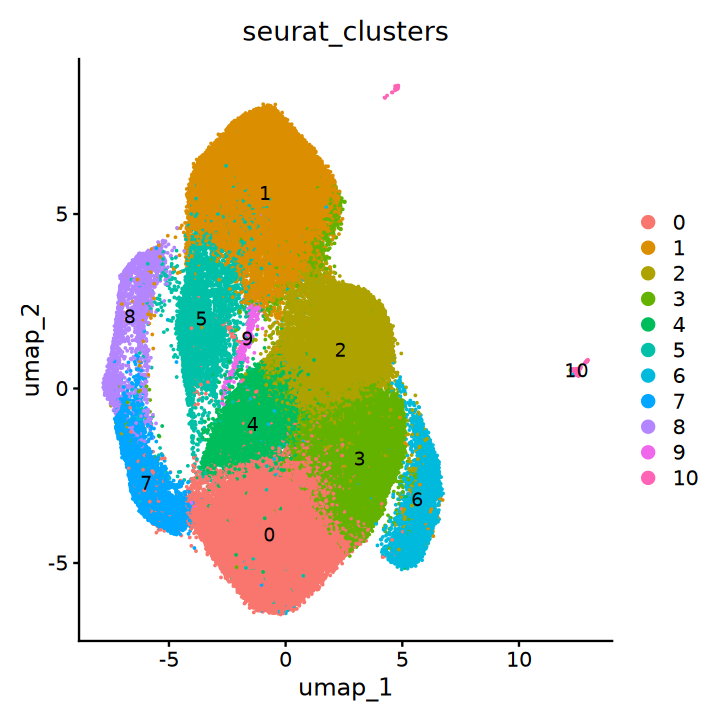

In [94]:
options(repr.plot.width = 6, repr.plot.height = 6) 
DimPlot(sc.all.merge, group.by = 'seurat_clusters',raster=FALSE,label = T)

In [95]:
sc.all.merge

An object of class Seurat 
32285 features across 92018 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 19 layers present: counts.T1_a3026, counts.T1_a3028, counts.T1_a3030, counts.T2_a3026, counts.T2_a3028, counts.T2_a3030, counts.T3_a3026, counts.T3_a3028, counts.T3_a3030, scale.data, data.T1_a3026, data.T1_a3028, data.T1_a3030, data.T2_a3026, data.T2_a3028, data.T2_a3030, data.T3_a3026, data.T3_a3028, data.T3_a3030
 2 dimensional reductions calculated: pca, umap

In [581]:
92018-91411

[1] 607

In [96]:
sc.all.merge <- IntegrateLayers(object = sc.all.merge, method = HarmonyIntegration,orig.reduction = "pca",new.reduction = "harmony", verbose = F)

Warning message:
“HarmonyMatrix is deprecated and will be removed in the future from the API in the future”
Warning message:
“Warning: The parameters do_pca and npcs are deprecated. They will be ignored for this function call and please remove parameters do_pca and npcs and pass to harmony cell_embeddings directly.
This warning is displayed once per session.”
Warning message:
“Warning: The parameter tau is deprecated. It will be ignored for this function call and please remove parameter tau in future function calls. Advanced users can set value of parameter tau by using parameter .options and function harmony_options().
This warning is displayed once per session.”
Warning message:
“Warning: The parameter block.size is deprecated. It will be ignored for this function call and please remove parameter block.size in future function calls. Advanced users can set value of parameter block.size by using parameter .options and function harmony_options().
This warning is displayed once per sessi

In [97]:
sc.all.merge <- RunUMAP(sc.all.merge, dims = 1:40,reduction= "harmony",reduction.name = "umap.harmony" )

21:27:38 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

21:27:38 Read 92018 rows and found 40 numeric columns

21:27:38 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

21:27:38 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

21:27:49 Writing NN index file to temp file /tmp/RtmpjVSSTR/filebd65771e84bf

21:27:49 Searching Annoy index using 1 thread, search_k = 3000

21:28:45 Annoy recall = 100%

21:28:53 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

21:28:58 Initializing from normalized Laplacian + 

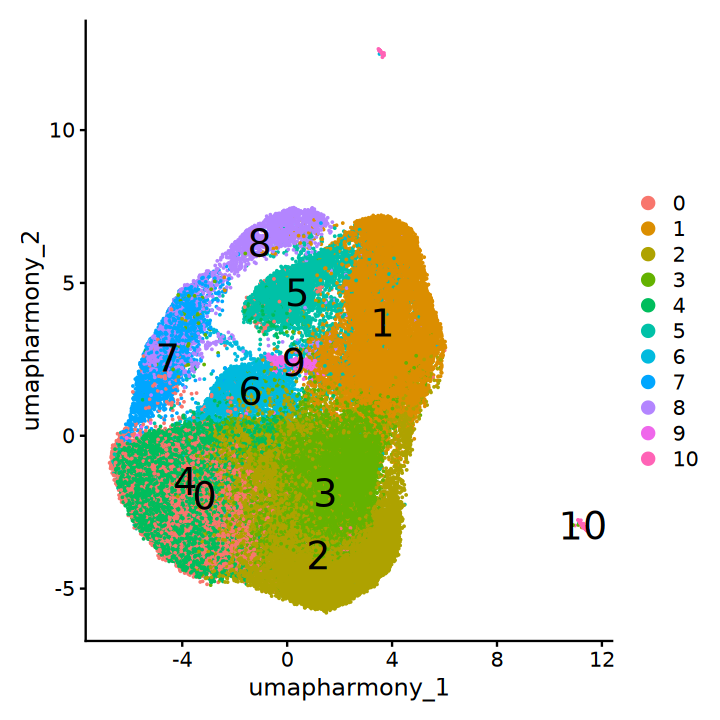

In [98]:
options(repr.plot.width = 6, repr.plot.height = 6) 
DimPlot(sc.all.merge, reduction = "umap.harmony",label.size = 8,raster=FALSE,label = T)

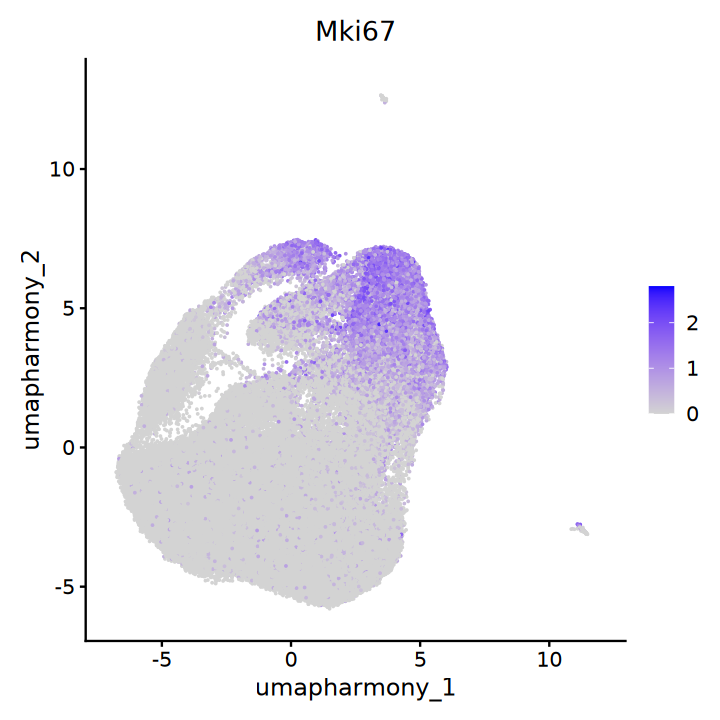

In [99]:
FeaturePlot(sc.all.merge,features = 'Mki67',reduction = "umap.harmony")

In [3]:
library(Seurat)
help(FindClusters)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect




In [100]:
sc.all.merge <- FindNeighbors(sc.all.merge, reduction = "harmony", dims = 1:40)
sc.all.merge <- FindClusters(sc.all.merge, resolution = 0.15, cluster.name = "harmony_clusters")

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 92018
Number of edges: 2633047

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9263
Number of communities: 10
Elapsed time: 42 seconds


2 singletons identified. 8 final clusters.



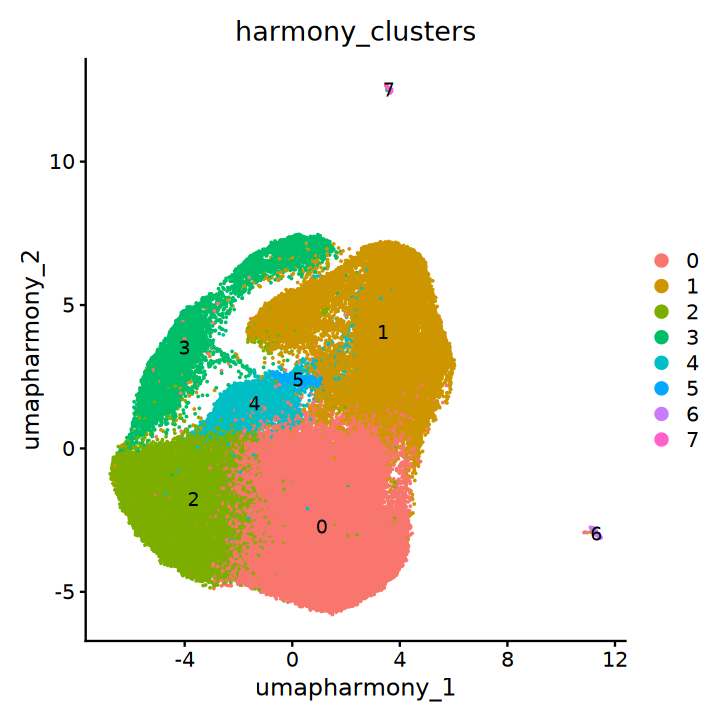

In [104]:
options(repr.plot.width = 6, repr.plot.height = 6) 
DimPlot(sc.all.merge, reduction = "umap.harmony",group.by = 'harmony_clusters',raster=FALSE,label = T#,
       #cols = c('#a6cee3','#33a02c','#6a3d9a','#fb9a99','#e31a1c','#ff7f00','#fdbf6f','#cab2d6','gray','black')
       )

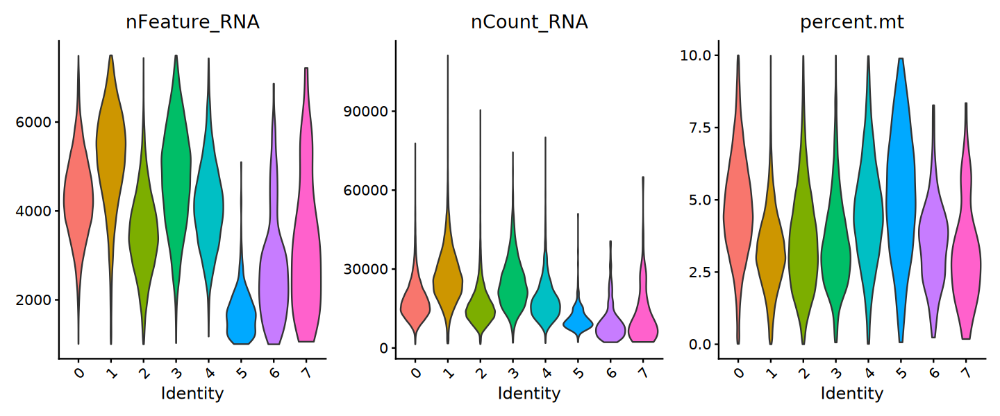

In [106]:
options(repr.plot.width = 12, repr.plot.height = 5) 
VlnPlot(sc.all.merge, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3,pt.size=0)

In [107]:
sc.all.merge <- subset(sc.all.merge,seurat_clusters %in% c(0,1,2,3,4))

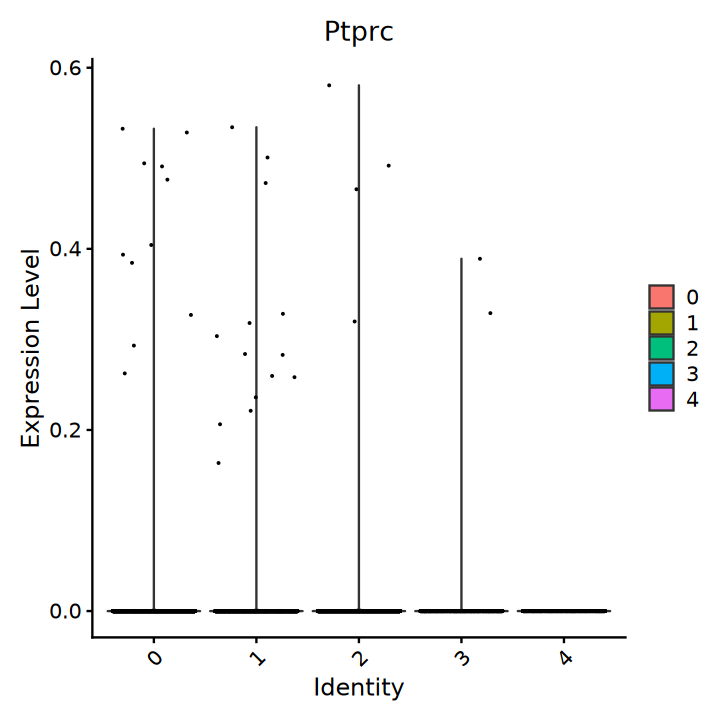

In [108]:
options(repr.plot.width = 6, repr.plot.height = 6) 
VlnPlot(sc.all.merge,features = 'Ptprc')

In [109]:
sc.all.merge

An object of class Seurat 
32285 features across 91422 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 19 layers present: counts.T1_a3026, counts.T1_a3028, counts.T1_a3030, counts.T2_a3026, counts.T2_a3028, counts.T2_a3030, counts.T3_a3026, counts.T3_a3028, counts.T3_a3030, scale.data, data.T1_a3026, data.T1_a3028, data.T1_a3030, data.T2_a3026, data.T2_a3028, data.T2_a3030, data.T3_a3026, data.T3_a3028, data.T3_a3030
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

In [110]:
sc.all.merge@meta.data$seurat_clusters_rename <- as.character(sc.all.merge@meta.data$harmony_clusters)
sc.all.merge@meta.data[sc.all.merge@meta.data$seurat_clusters_rename == 2,'seurat_clusters_rename'] <- 9
sc.all.merge@meta.data[sc.all.merge@meta.data$seurat_clusters_rename == 0,'seurat_clusters_rename'] <- 2
sc.all.merge@meta.data[sc.all.merge@meta.data$seurat_clusters_rename == 9,'seurat_clusters_rename'] <- 0

In [111]:
library(ggplot2)

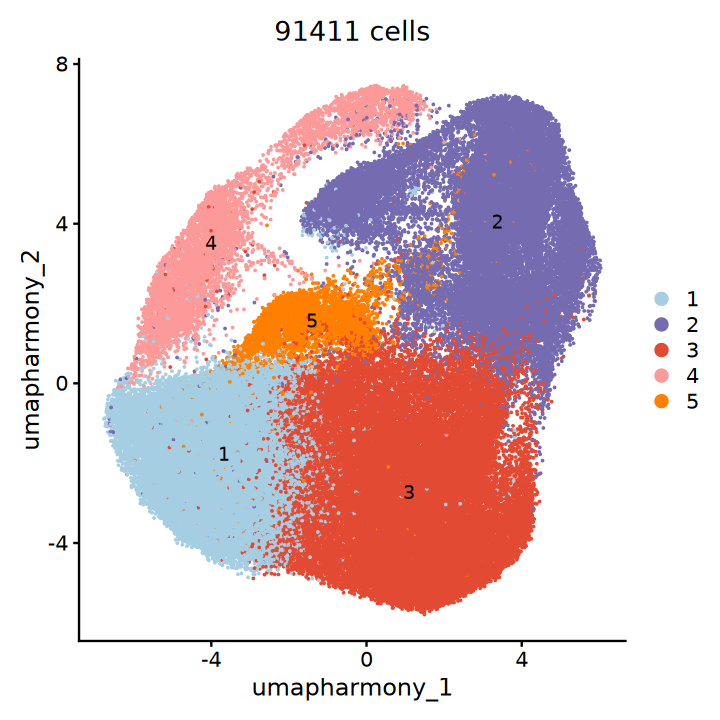

In [131]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(sc.all.merge, reduction = "umap.harmony",group.by = 'seurat_clusters_rename',raster=FALSE,label = T,
       cols = c('#a6cee3','#756bb1','#e34a33','#fb9a99','#ff7f00')
       )+ ggtitle(paste0(dim(sc.all.merge)[2],' cells'))

In [113]:
sc.all.merge

An object of class Seurat 
32285 features across 91422 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 19 layers present: counts.T1_a3026, counts.T1_a3028, counts.T1_a3030, counts.T2_a3026, counts.T2_a3028, counts.T2_a3030, counts.T3_a3026, counts.T3_a3028, counts.T3_a3030, scale.data, data.T1_a3026, data.T1_a3028, data.T1_a3030, data.T2_a3026, data.T2_a3028, data.T2_a3030, data.T3_a3026, data.T3_a3028, data.T3_a3030
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

In [114]:
sc.all.merge@meta.data$seurat_clusters_rename <- as.character(as.numeric(sc.all.merge@meta.data$seurat_clusters_rename)+1)

In [115]:
unique(sc.all.merge@meta.data$seurat_clusters_rename)

[1] "2" "1" "3" "4" "5"

In [117]:
sc.all.merge@meta.data <- cbind(sc.all.merge@meta.data,
                      as.data.frame(sc.all.merge@reductions$umap.harmony@cell.embeddings)[rownames(sc.all.merge@meta.data),])

In [118]:
sc.all.merge <- subset(sc.all.merge,cells = rownames(sc.all.merge@meta.data)[sc.all.merge@meta.data$umapharmony_1 < 8 & sc.all.merge@meta.data$umapharmony_2 < 10])

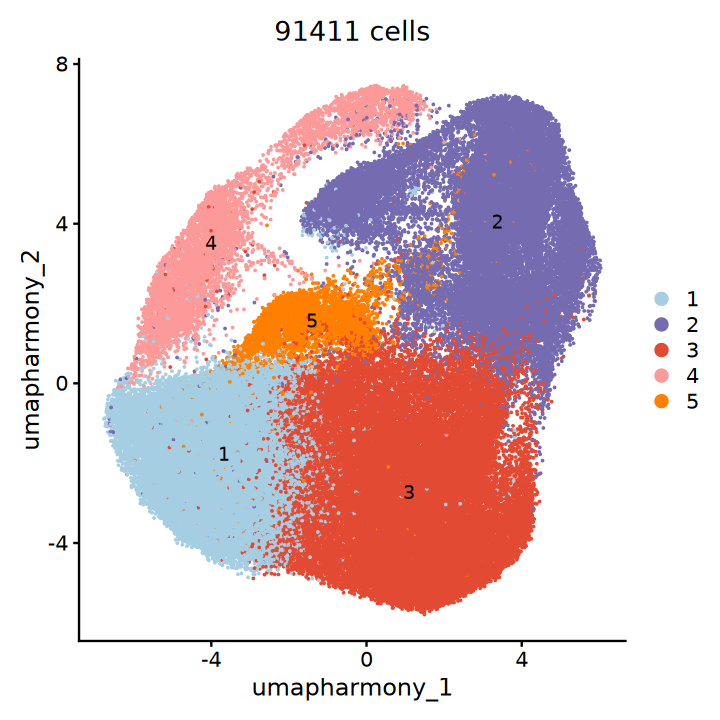

In [132]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(sc.all.merge, reduction = "umap.harmony",group.by = 'seurat_clusters_rename',raster=FALSE,label = T,
       cols = c('#a6cee3','#756bb1','#e34a33','#fb9a99','#ff7f00')
       )+ ggtitle(paste0(dim(sc.all.merge)[2],' cells'))

In [120]:
table(sc.all.merge@meta.data$seurat_clusters_rename)


    1     2     3     4     5 
23463 25185 32470  6190  4103 

In [121]:
saveRDS(sc.all.merge,file='/syn1/liangzhen/jinhua_jilab_project/result/scRNA/cellranger/sc.all.merge.T1T2T3a.harmony.final.refine.rds')

In [122]:
sc.all.merge

An object of class Seurat 
32285 features across 91411 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 19 layers present: counts.T1_a3026, counts.T1_a3028, counts.T1_a3030, counts.T2_a3026, counts.T2_a3028, counts.T2_a3030, counts.T3_a3026, counts.T3_a3028, counts.T3_a3030, scale.data, data.T1_a3026, data.T1_a3028, data.T1_a3030, data.T2_a3026, data.T2_a3028, data.T2_a3030, data.T3_a3026, data.T3_a3028, data.T3_a3030
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

In [20]:
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO301','orig.ident'] <- 'T2_a3026_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO302','orig.ident'] <- 'T2_a3026_2'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO303','orig.ident'] <- 'T2_a3028_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO304','orig.ident'] <- 'T2_a3028_2'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO305','orig.ident'] <- 'T2_a3030_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO306','orig.ident'] <- 'T2_a3030_2'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO301','orig.ident'] <- 'T3_a3026_1_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO307','orig.ident'] <- 'T3_a3026_2_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO303','orig.ident'] <- 'T3_a3028_1_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO304','orig.ident'] <- 'T3_a3028_2_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO305','orig.ident'] <- 'T3_a3030_1_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO306','orig.ident'] <- 'T3_a3030_2_1'

cellBCs <- c()
for (cellBC in rownames(sc.all.merge@meta.data)){
    cellBC <- substr(cellBC,nchar(cellBC)-1-16,nchar(cellBC)-2)
    cellBCs <- c(cellBCs,cellBC)
}

sc.all.merge@meta.data$cellName <- paste0(sc.all.merge@meta.data$orig.ident,'_',cellBCs)

In [124]:
write.table(sc.all.merge@meta.data,file='/syn1/liangzhen/jinhua_jilab_project/result/scRNA/cellranger/metadata.T1_T2_T3a.harmony.final.refine.csv',col.names = NA,quote=F,sep=',')

In [1]:
library(Seurat)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect




In [2]:
sc.all.merge <- readRDS('/syn1/liangzhen/jinhua_jilab_project/result/scRNA/cellranger/sc.all.merge.T1T2T3a.harmony.final.refine.rds')

In [3]:
sc.all.merge

An object of class Seurat 
32285 features across 91411 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 19 layers present: counts.T1_a3026, counts.T1_a3028, counts.T1_a3030, counts.T2_a3026, counts.T2_a3028, counts.T2_a3030, counts.T3_a3026, counts.T3_a3028, counts.T3_a3030, scale.data, data.T1_a3026, data.T1_a3028, data.T1_a3030, data.T2_a3026, data.T2_a3028, data.T2_a3030, data.T3_a3026, data.T3_a3028, data.T3_a3030
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

In [5]:
table(sc.all.merge$time)


   T1    T2    T3 
34774 27081 29556 

In [458]:
library(ggplot2)

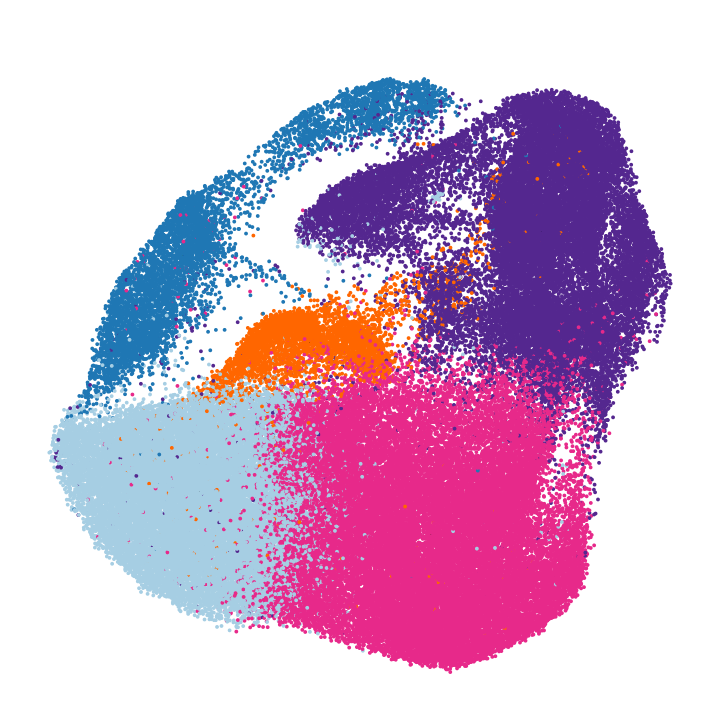

In [31]:
options(repr.plot.width = 6, repr.plot.height = 6)
plot <- DimPlot(sc.all.merge, reduction = "umap.harmony",group.by = 'seurat_clusters_rename',raster=FALSE,label = T,label.size = 0,
       cols = c('#a6cee3','#54278f','#e7298a','#1f77b4','#ff6600')
       )+ NoLegend()+ ggtitle('')+theme_bw()+#ggtitle(paste0(dim(sc.all.merge)[2],' cells'))
theme(panel.grid.major = element_blank(),panel.grid.minor = element_blank(),axis.ticks.length = unit(0, "pt"),
           panel.border = element_blank(),axis.text = element_blank(),axis.title = element_blank())+ theme(legend.position = 'none')
plot
ggsave(plot,file='/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2/umap.png',height=6,width=6)

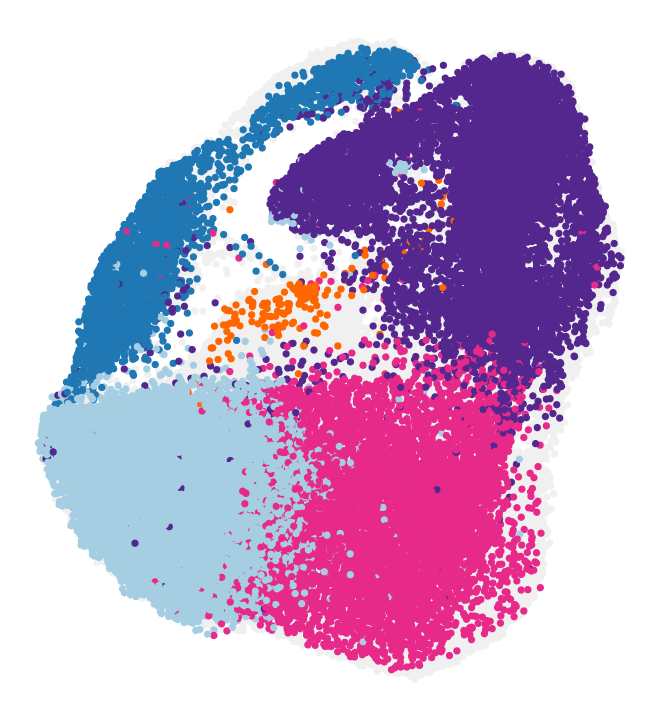

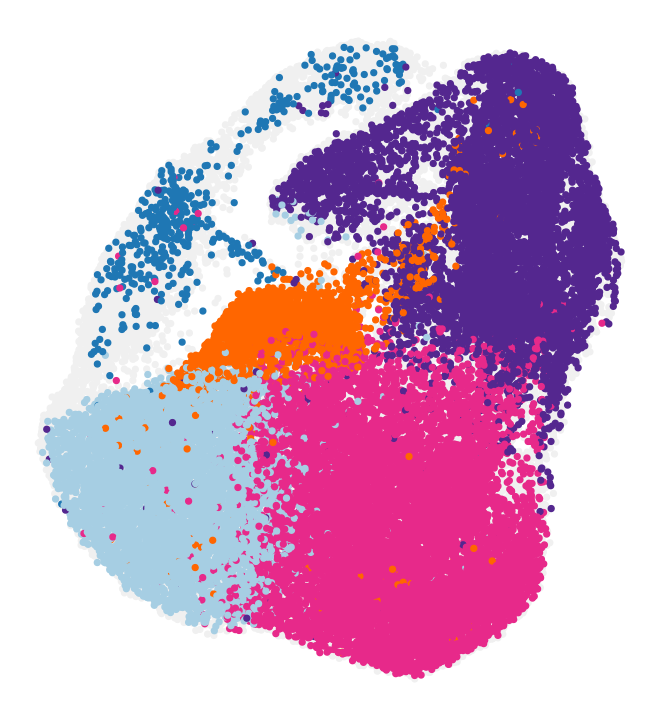

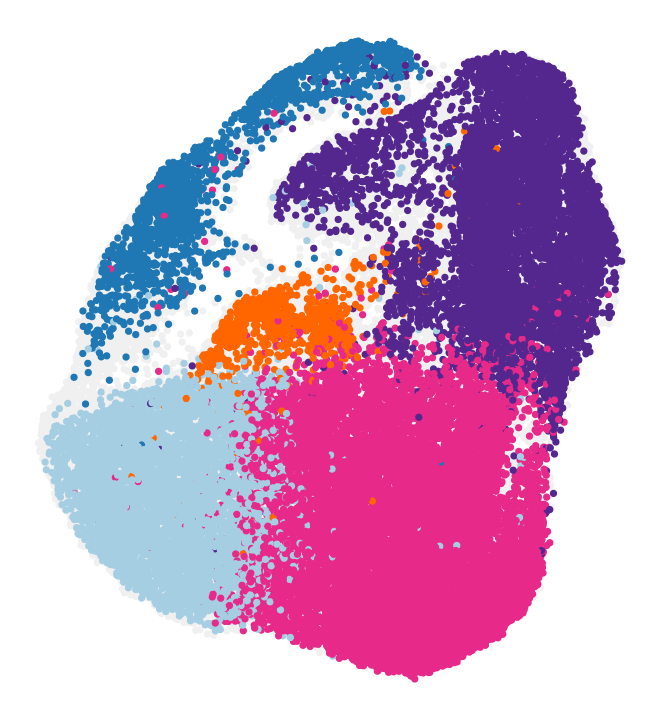

In [27]:
options(repr.plot.width = 5.5, repr.plot.height = 6)
#pdf(file='/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2/umap_split_time.pdf',height=6,width=5.5)
for (time in c('T1','T2','T3')){
    sc.all.merge@meta.data$seurat_clusters_col <- as.character(sc.all.merge@meta.data$seurat_clusters_rename)
    sc.all.merge@meta.data[sc.all.merge@meta.data$time!=time,'seurat_clusters_col'] <- 'bg'
    sc.all.merge@meta.data$seurat_clusters_col <- factor(sc.all.merge@meta.data$seurat_clusters_col,
                                                         levels = c('bg','1','2','3','4','5'))
    plot <- ggplot()+
            geom_point(data =sc.all.merge@meta.data[sc.all.merge@meta.data$seurat_clusters_col == 'bg',],aes(x=umapharmony_1,y=umapharmony_2),size=1,color='#f0f0f0') + 
            geom_point(data =sc.all.merge@meta.data[sc.all.merge@meta.data$seurat_clusters_col != 'bg',],aes(x=umapharmony_1,y=umapharmony_2,color=seurat_clusters_col),size=1)+
            scale_color_manual(
                 breaks=c('1','2','3','4','5'),
                 values=c('#a6cee3','#54278f','#e7298a','#1f77b4','#ff6600')
         )+ theme_bw()+
     theme(panel.grid.major = element_blank(),panel.grid.minor = element_blank(),axis.ticks.length = unit(0, "pt"),
           panel.border = element_blank(),axis.text = element_blank(),axis.title = element_blank())+ theme(legend.position = 'none')#+ 
        #ggtitle(paste0(time,'-',dim(sc.all.merge@meta.data[sc.all.merge@meta.data$seurat_clusters_col != 'bg',])[1],' cells'))

    print(plot) 
    ggsave(plot,file=paste0('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2/',time,'_umap.png'),height=6,width=6)
}
#dev.off()

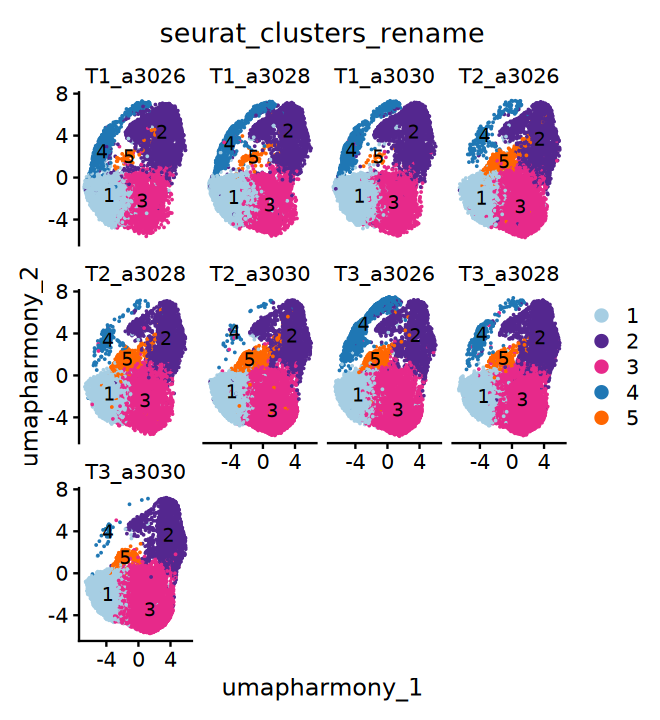

In [18]:
DimPlot(sc.all.merge, reduction = "umap.harmony",split.by = "orig.ident",label = T,raster=FALSE,ncol =4,group.by = c("seurat_clusters_rename"),
        cols = c('#a6cee3','#54278f','#e7298a','#1f77b4','#ff6600'))

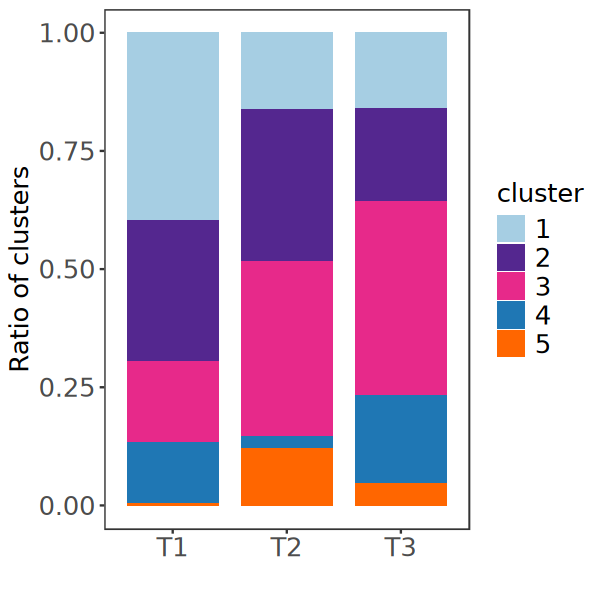

In [21]:
library(ggplot2)
options(repr.plot.width = 5, repr.plot.height = 5)
sc.all.merge@meta.data$Num <- 1
plot <- ggplot(data=sc.all.merge@meta.data[sc.all.merge@meta.data$orig.ident %in% c('T1_a3026','T2_a3026_1','T2_a3026_2','T3_a3026_2_1','T3_a3026_1_1'),],aes(time,Num,fill=seurat_clusters_rename)) + geom_bar(stat="identity",position="fill",width=0.8) +
    xlab('') + ylab('Ratio of clusters')+ labs(fill='cluster')+
    scale_fill_manual(values = c('#a6cee3','#54278f','#e7298a','#1f77b4','#ff6600'))+
    theme_bw() + theme(panel.grid=element_blank(),
                  axis.text = element_text(size=15),axis.title = element_text(size=15),
                  legend.text=element_text(size=15),legend.title=element_text(size=15))
ggsave(plot,file='/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2/cluster_ratio_a3026.pdf',height=5,width=5)
plot

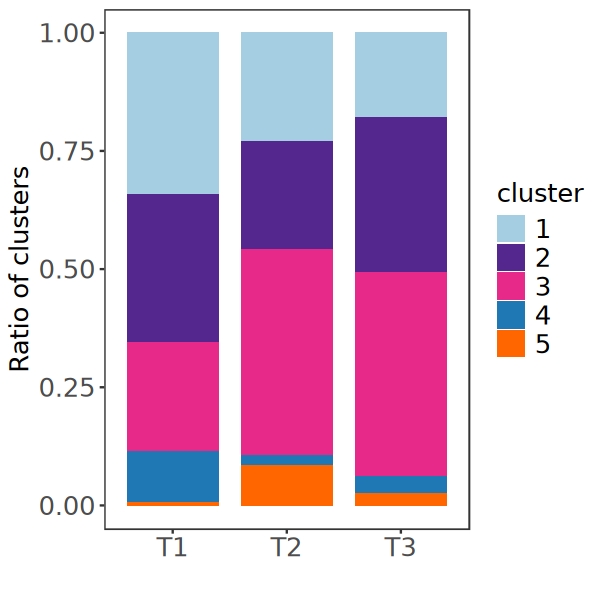

In [22]:
library(ggplot2)
options(repr.plot.width = 5, repr.plot.height = 5)
sc.all.merge@meta.data$Num <- 1
plot <- ggplot(data=sc.all.merge@meta.data[sc.all.merge@meta.data$orig.ident %in% c('T1_a3028','T2_a3028_1','T2_a3028_2','T3_a3028_2_1','T3_a3028_1_1'),],aes(time,Num,fill=seurat_clusters_rename)) + geom_bar(stat="identity",position="fill",width=0.8) +
    xlab('') + ylab('Ratio of clusters')+ labs(fill='cluster')+
    scale_fill_manual(values = c('#a6cee3','#54278f','#e7298a','#1f77b4','#ff6600'))+
    theme_bw() + theme(panel.grid=element_blank(),
                  axis.text = element_text(size=15),axis.title = element_text(size=15),
                  legend.text=element_text(size=15),legend.title=element_text(size=15))
ggsave(plot,file='/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2/cluster_ratio_a3028.pdf',height=5,width=5)
plot

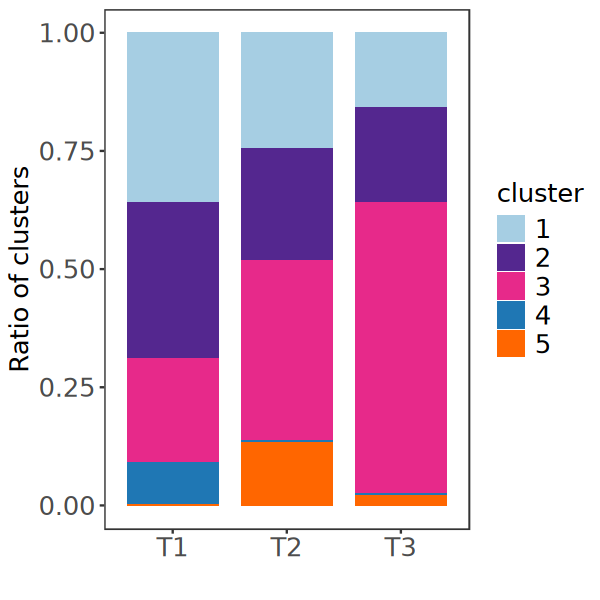

In [23]:
library(ggplot2)
options(repr.plot.width = 5, repr.plot.height = 5)
sc.all.merge@meta.data$Num <- 1
plot <- ggplot(data=sc.all.merge@meta.data[sc.all.merge@meta.data$orig.ident %in% c('T1_a3030','T2_a3030_1','T2_a3030_2','T3_a3030_2_1','T3_a3030_1_1'),],aes(time,Num,fill=seurat_clusters_rename)) + geom_bar(stat="identity",position="fill",width=0.8) +
    xlab('') + ylab('Ratio of clusters')+ labs(fill='cluster')+
    scale_fill_manual(values = c('#a6cee3','#54278f','#e7298a','#1f77b4','#ff6600'))+
    theme_bw() + theme(panel.grid=element_blank(),
                  axis.text = element_text(size=15),axis.title = element_text(size=15),
                  legend.text=element_text(size=15),legend.title=element_text(size=15))
ggsave(plot,file='/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2/cluster_ratio_a3030.pdf',height=5,width=5)
plot

In [4]:
sc.all.merge

An object of class Seurat 
32285 features across 91411 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 19 layers present: counts.T1_a3026, counts.T1_a3028, counts.T1_a3030, counts.T2_a3026, counts.T2_a3028, counts.T2_a3030, counts.T3_a3026, counts.T3_a3028, counts.T3_a3030, scale.data, data.T1_a3026, data.T1_a3028, data.T1_a3030, data.T2_a3026, data.T2_a3028, data.T2_a3030, data.T3_a3026, data.T3_a3028, data.T3_a3030
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

In [482]:
sc.all.merge <- JoinLayers(sc.all.merge)

In [483]:
Idents(sc.all.merge) <- sc.all.merge@meta.data$seurat_clusters_rename

sc.all.merge.markers <- FindAllMarkers(sc.all.merge, only.pos = TRUE,min.pct = 0.1)

Calculating cluster 2

Calculating cluster 1

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5



In [462]:
sc.all.merge.markers

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Pclaf,0,4.275370,0.897,0.129,0,2,Pclaf
Spc24,0,3.757732,0.773,0.103,0,2,Spc24
Tk1,0,3.679177,0.855,0.185,0,2,Tk1
Ccna2,0,4.155450,0.729,0.062,0,2,Ccna2
Mki67,0,4.063172,0.747,0.081,0,2,Mki67
Smc2,0,3.109348,0.862,0.198,0,2,Smc2
Ube2c,0,3.921812,0.812,0.155,0,2,Ube2c
Cdca8,0,3.268513,0.792,0.142,0,2,Cdca8
Racgap1,0,2.861734,0.822,0.173,0,2,Racgap1


In [463]:
sc.all.merge.markers.filter <- sc.all.merge.markers[sc.all.merge.markers$avg_log2FC>1 & sc.all.merge.markers$p_val_adj < 0.05,]
sc.all.merge.markers.filter

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Pclaf,0,4.275370,0.897,0.129,0,2,Pclaf
Spc24,0,3.757732,0.773,0.103,0,2,Spc24
Tk1,0,3.679177,0.855,0.185,0,2,Tk1
Ccna2,0,4.155450,0.729,0.062,0,2,Ccna2
Mki67,0,4.063172,0.747,0.081,0,2,Mki67
Smc2,0,3.109348,0.862,0.198,0,2,Smc2
Ube2c,0,3.921812,0.812,0.155,0,2,Ube2c
Cdca8,0,3.268513,0.792,0.142,0,2,Cdca8
Racgap1,0,2.861734,0.822,0.173,0,2,Racgap1


In [464]:
write.table(sc.all.merge.markers.filter,file='/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2.sup/sc.all.merge.markers.csv',sep=',',col.names = T,row.names = T,quote=F)

In [461]:
library(dplyr)

In [60]:
sc.all.merge.markers[sc.all.merge.markers$avg_log2FC > 3 & sc.all.merge.markers$cluster=='4',]

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Clu,0,3.772151,0.831,0.208,0,4,Clu
Cotl1,0,3.241725,0.438,0.074,0,4,Cotl1
Mab21l4,0,5.511148,0.356,0.012,0,4,Mab21l4
Maoa,0,3.759259,0.342,0.023,0,4,Maoa
Cd53,0,3.654123,0.333,0.038,0,4,Cd53
Igsf11,0,3.146116,0.316,0.040,0,4,Igsf11
Gm49504,0,5.428477,0.186,0.004,0,4,Gm49504
Krt23,0,3.212602,0.197,0.020,0,4,Krt23
Sox5,0,3.058896,0.275,0.100,0,4,Sox5


In [484]:
library(dplyr)
sc.all.merge.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 1) %>%
    slice_head(n = 100) %>%
    ungroup() -> top100

In [485]:
write.table(top100,file='/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2.sup/cluster_DEGs_top100.csv',sep=',',col.names = T,row.names = T,quote=F)

In [20]:
top100

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0,4.275370,0.897,0.129,0,2,Pclaf
0,3.757732,0.773,0.103,0,2,Spc24
0,3.679177,0.855,0.185,0,2,Tk1
0,4.155450,0.729,0.062,0,2,Ccna2
0,4.063172,0.747,0.081,0,2,Mki67
0,3.109348,0.862,0.198,0,2,Smc2
0,3.921812,0.812,0.155,0,2,Ube2c
0,3.268513,0.792,0.142,0,2,Cdca8
0,2.861734,0.822,0.173,0,2,Racgap1


In [60]:
library('clusterProfiler')
library("org.Mm.eg.db")

In [64]:
top100$gene[top100$cluster==4]

[1] "Clu"           "Nt5e"          "Cela1"         "Qrfp"         
  [5] "8430429K09Rik" "Msln"          "Spint2"        "Nlrp4e"       
  [9] "Grasp"         "Sorcs2"        "Lamb3"         "Rnf185"       
 [13] "Cotl1"         "1600012H06Rik" "Fam120b"       "Mab21l4"      
 [17] "Riok2"         "Cd24a"         "Nrxn1"         "Pdcd2"        
 [21] "Lgr6"          "Rarg"          "Tbp"           "Ccn2"         
 [25] "Serf1"         "Maoa"          "Slc4a8"        "Phf10"        
 [29] "Spryd3"        "AA467197"      "Atg101"        "Creb5"        
 [33] "Cd53"          "Pxdc1"         "Zfp740"        "Mfsd5"        
 [37] "Rbp4"          "Stom"          "Abcb1a"        "Ano1"         
 [41] "1190005I06Rik" "Foxq1"         "Gpr39"         "Dhrs3"        
 [45] "Igsf11"        "Smtn"          "Serpinb6b"     "Rgmb"         
 [49] "Wtap"          "Adam12"        "Gm2694"        "Tmem163"      
 [53] "Ermard"        "Pus10"         "Afdn"          "Tfcp2"        
 [57] "Efnb1"         "Adamts6"       "Smarcd1"       "Letmd1"       
 [61] "Ptprf"         "Ggct"          "Zfp52"         "Zfp160"       
 [65] "Tnnt2"         "Epb41l4b"      "Syngr1"        "Wdr27"        
 [69] "Carmil1"       "Nt5dc2"        "Spaca6"        "Slc11a2"      
 [73] "BC002059"      "Cfap77"        "Stard10"       "Gzme"         
 [77] "Nr4a1"         "Pou6f1"        "Cldn18"        "Arhgdib"      
 [81] "Cib2"          "Acvr1b"        "Pgf"           "Ifi207"       
 [85] "Gm49504"       "Chd1"          "Krt23"         "Sox5"         
 [89] "Krt80"         "Csrnp2"        "Dll1"          "Kif26b"       
 [93] "Abca3"         "Sulf2"         "Edn1"          "Tcte2"        
 [97] "Ptk7"          "Mmp10"         "Gm14207"       "Dazap2"

In [45]:
test_go <- enrichGO(gene = top100$gene[top100$cluster==4],keyType = 'SYMBOL',OrgDb = 'org.Mm.eg.db',minGSSize = 3,pAdjustMethod = 'fdr',ont = "BP")

In [46]:
test_go@result

,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>
GO:0072001,GO:0072001,renal system development,8/96,352/28891,2.342129e-05,0.01766268,0.01289410,Cd24a/Rbp4/Adamts6/Pgf/Dll1/Kif26b/Sulf2/Ptk7,8
GO:0061884,GO:0061884,regulation of mini excitatory postsynaptic potential,2/96,3/28891,3.270867e-05,0.01766268,0.01289410,Igsf11/Afdn,2
GO:0061885,GO:0061885,positive regulation of mini excitatory postsynaptic potential,2/96,3/28891,3.270867e-05,0.01766268,0.01289410,Igsf11/Afdn,2
GO:0098816,GO:0098816,mini excitatory postsynaptic potential,2/96,3/28891,3.270867e-05,0.01766268,0.01289410,Igsf11/Afdn,2
GO:0046864,GO:0046864,isoprenoid transport,2/96,5/28891,1.085566e-04,0.03908036,0.02852943,Rbp4/Abcb1a,2
GO:0046865,GO:0046865,terpenoid transport,2/96,5/28891,1.085566e-04,0.03908036,0.02852943,Rbp4/Abcb1a,2
GO:0001822,GO:0001822,kidney development,7/96,336/28891,1.328865e-04,0.04100499,0.02993444,Cd24a/Adamts6/Pgf/Dll1/Kif26b/Sulf2/Ptk7,7
GO:0072006,GO:0072006,nephron development,5/96,162/28891,2.111067e-04,0.04514800,0.03295892,Cd24a/Pgf/Dll1/Kif26b/Sulf2,5
GO:0070316,GO:0070316,regulation of G0 to G1 transition,3/96,36/28891,2.344269e-04,0.04514800,0.03295892,Ccn2/Phf10/Smarcd1,3


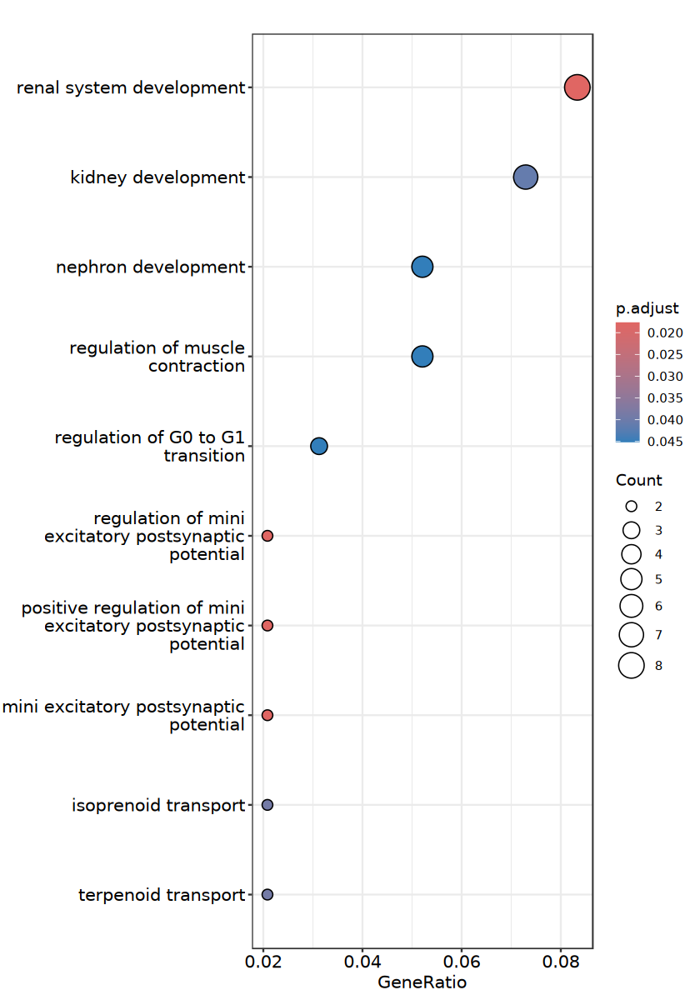

In [47]:
dotplot(test_go)

In [38]:
compare_enrich@compareClusterResult[compare_enrich@compareClusterResult$Cluster==4,]

,Cluster,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
,<fct>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>
728,4,GO:0072001,renal system development,8/96,352/28891,2.342129e-05,0.04916129,0.03693168,Cd24a/Rbp4/Adamts6/Pgf/Dll1/Kif26b/Sulf2/Ptk7,8


png 
  2

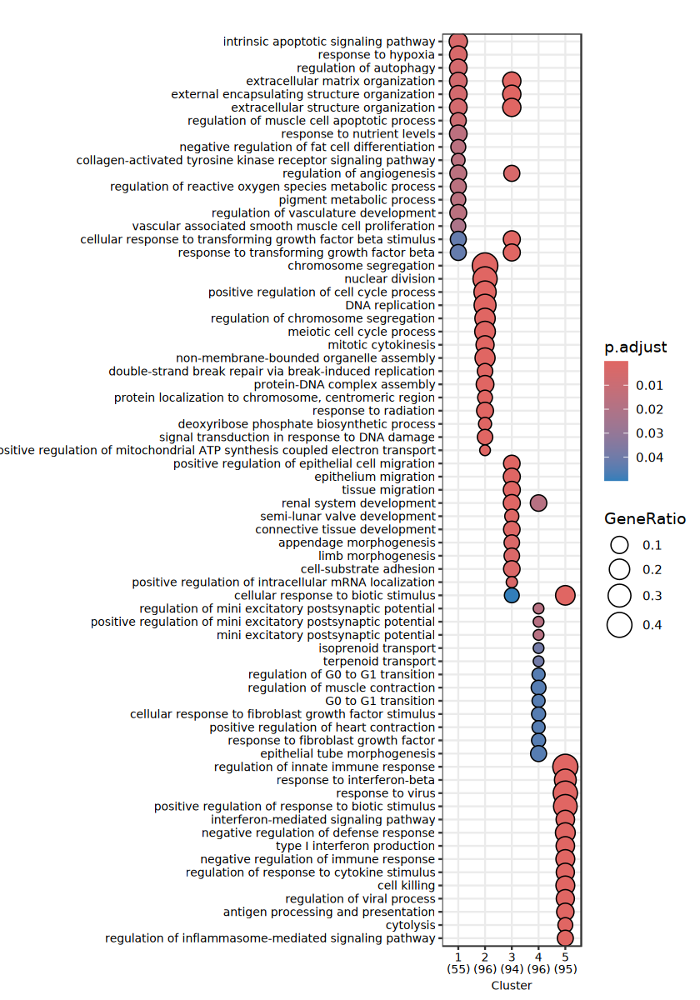

In [62]:
enrich_gene_list_for_test <- list("1"=top100$gene[top100$cluster==1],"2"=top100$gene[top100$cluster==2],"3"=top100$gene[top100$cluster==3],
                                  "4"=top100$gene[top100$cluster==4],"5"=top100$gene[top100$cluster==5])

compare_enrich <- compareCluster(geneCluster = enrich_gene_list_for_test,
                              keyType = 'SYMBOL',
                                   ont = "BP",
                                   OrgDb = 'org.Mm.eg.db',
                                   pAdjustMethod = "BH",
                                     minGSSize = 3,
                                   fun =  enrichGO)
compare_enrich <- simplify(compare_enrich,cutoff=0.6)
options(repr.plot.width = 7, repr.plot.height = 10)
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2.sup/GO_plot.pdf',width = 7,height = 10)
plot <- dotplot(compare_enrich,label_format = 100 ,showCategory=15, font.size=8)
print(plot)
dev.off()
print(plot)

In [201]:
write.table(compare_enrich@compareClusterResult,file='/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2.sup/GO_terms.csv',col.names = T,row.names = T,quote=F)

In [9]:
gmt <- clusterProfiler::read.gmt('/syn1/liangzhen/fanli_tfseq_project/hisat2_index/mh.all.v2023.2.Mm.symbols.gmt')
h_df = gmt[,c(2,1)]
h_list = unstack(h_df)

In [10]:
h_list$HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION

[1] "Abi3bp"    "Acta2"     "Adam12"    "Anpep"     "Aplp1"     "Areg"     
  [7] "Basp1"     "Bdnf"      "Bgn"       "Bmp1"      "Cadm1"     "Cald1"    
 [13] "Calu"      "Cap2"      "Capg"      "Ccn1"      "Ccn2"      "Cd44"     
 [19] "Cdh11"     "Cdh2"      "Cdh6"      "Col11a1"   "Col12a1"   "Col16a1"  
 [25] "Col1a1"    "Col1a2"    "Col3a1"    "Col4a1"    "Col4a2"    "Col5a1"   
 [31] "Col5a2"    "Col5a3"    "Col6a2"    "Col6a3"    "Col7a1"    "Col8a2"   
 [37] "Colgalt1"  "Comp"      "Copa"      "Crlf1"     "Cthrc1"    "Cxcl12"   
 [43] "Cxcl15"    "Cxcl5"     "Dab2"      "Dcn"       "Dkk1"      "Dpysl3"   
 [49] "Dst"       "Ecm1"      "Ecm2"      "Edil3"     "Efemp2"    "Eln"      
 [55] "Emp3"      "Eno2"      "Fap"       "Fas"       "Fbln1"     "Fbln2"    
 [61] "Fbln5"     "Fbn1"      "Fbn2"      "Fermt2"    "Fgf2"      "Flna"     
 [67] "Fmod"      "Fn1"       "Foxc2"     "Fstl1"     "Fstl3"     "Fuca1"    
 [73] "Fzd8"      "Gadd45a"   "Gadd45b"   "Gas1"      "Gem"       "Gja1"     
 [79] "Glipr1"    "Gm21451"   "Gpc1"      "Gpx7"      "Grem1"     "Htra1"    
 [85] "Id2"       "Igfbp2"    "Igfbp3"    "Igfbp4"    "Il15"      "Il6"      
 [91] "Inhba"     "Itga2"     "Itga5"     "Itgav"     "Itgb1"     "Itgb3"    
 [97] "Itgb5"     "Jun"       "Lama1"     "Lama2"     "Lama3"     "Lamc1"    
[103] "Lamc2"     "Lgals1"    "Lox"       "Loxl1"     "Lrp1"      "Lrrc15"   
[109] "Lum"       "Magee1"    "Matn2"     "Matn3"     "Mcm7"      "Mest"     
[115] "Mfap5"     "Mgp"       "Mmp14"     "Mmp2"      "Mmp3"      "Msx1"     
[121] "Myl9"      "Mylk"      "Nid2"      "Nnmt"      "Notch2"    "Nt5e"     
[127] "Ntm"       "Oxtr"      "P3h1"      "Pcolce"    "Pcolce2"   "Pdgfrb"   
[133] "Pdlim4"    "Pfn2"      "Plaur"     "Plod1"     "Plod2"     "Plod3"    
[139] "Pmepa1"    "Pmp22"     "Postn"     "Ppib"      "Prrx1"     "Pthlh"    
[145] "Ptx3"      "Pvr"       "Qsox1"     "Rgs4"      "Rhob"      "Sat1"     
[151] "Scg2"      "Sdc1"      "Sdc4"      "Serpine1"  "Serpine2"  "Serpinh1" 
[157] "Sfrp1"     "Sfrp4"     "Sgcb"      "Sgcd"      "Sgcg"      "Slc6a8"   
[163] "Slit2"     "Slit3"     "Snai2"     "Sntb1"     "Sparc"     "Spock1"   
[169] "Spp1"      "Tagln"     "Tfpi2"     "Tgfb1"     "Tgfbi"     "Tgfbr3"   
[175] "Tgm2"      "Thbs1"     "Thbs2"     "Thy1"      "Timp1"     "Timp3"    
[181] "Tnc"       "Tnfaip3"   "Tnfrsf11b" "Tnfrsf12a" "Tpm1"      "Tpm2"     
[187] "Tpm4"      "Vcam1"     "Vcan"      "Vegfa"     "Vegfc"     "Vim"      
[193] "Wipf1"     "Wnt5a"

In [11]:
Idents(sc.all.merge) <- sc.all.merge@meta.data$time_cluster

In [12]:
exp  =  AverageExpression(sc.all.merge)[[1]]
exp  =  as.matrix(exp)
exp  =  exp[rowSums(exp)>0,] 

As of Seurat v5, we recommend using AggregateExpression to perform pseudo-bulk analysis.
This message is displayed once per session.
Names of identity class contain underscores ('_'), replacing with dashes ('-')
This message is displayed once every 8 hours.


In [13]:
library(GSVA)

In [14]:
ES  =  GSVA::gsva(exp, h_list,method='ssgsea')

Warning message:
“Calling gsva(expr=., gset.idx.list=., method=., ...) is deprecated; use a method-specific parameter object (see '?gsva').”


Estimating ssGSEA scores for 50 gene sets.
[1] "Calculating ranks..."
[1] "Calculating absolute values from ranks..."
  |======================================================================| 100%

[1] "Normalizing..."


In [24]:
ES <- ES[c('HALLMARK_MTORC1_SIGNALING','HALLMARK_SPERMATOGENESIS','HALLMARK_MYC_TARGETS_V1','HALLMARK_MYC_TARGETS_V2','HALLMARK_DNA_REPAIR',
                   'HALLMARK_UNFOLDED_PROTEIN_RESPONSE','HALLMARK_TNFA_SIGNALING_VIA_NFKB','HALLMARK_INTERFERON_ALPHA_RESPONSE','HALLMARK_INTERFERON_GAMMA_RESPONSE',
                   'HALLMARK_IL6_JAK_STAT3_SIGNALING','HALLMARK_INFLAMMATORY_RESPONSE','HALLMARK_OXIDATIVE_PHOSPHORYLATION','HALLMARK_CHOLESTEROL_HOMEOSTASIS','HALLMARK_GLYCOLYSIS',
                   'HALLMARK_REACTIVE_OXIGEN_SPECIES_PATHWAY','HALLMARK_PEROXISOME','HALLMARK_TGF_BETA_SIGNALING','HALLMARK_HYPOXIA','HALLMARK_P53_PATHWAY',
                   'HALLMARK_HEME_METABOLISM','HALLMARK_PROTEIN_SECRETION','HALLMARK_APICAL_SURFACE','HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION','HALLMARK_WNT_BETA_CATENIN_SIGNALING','HALLMARK_NOTCH_SIGNALING'),]

In [25]:
library(ggplot2)

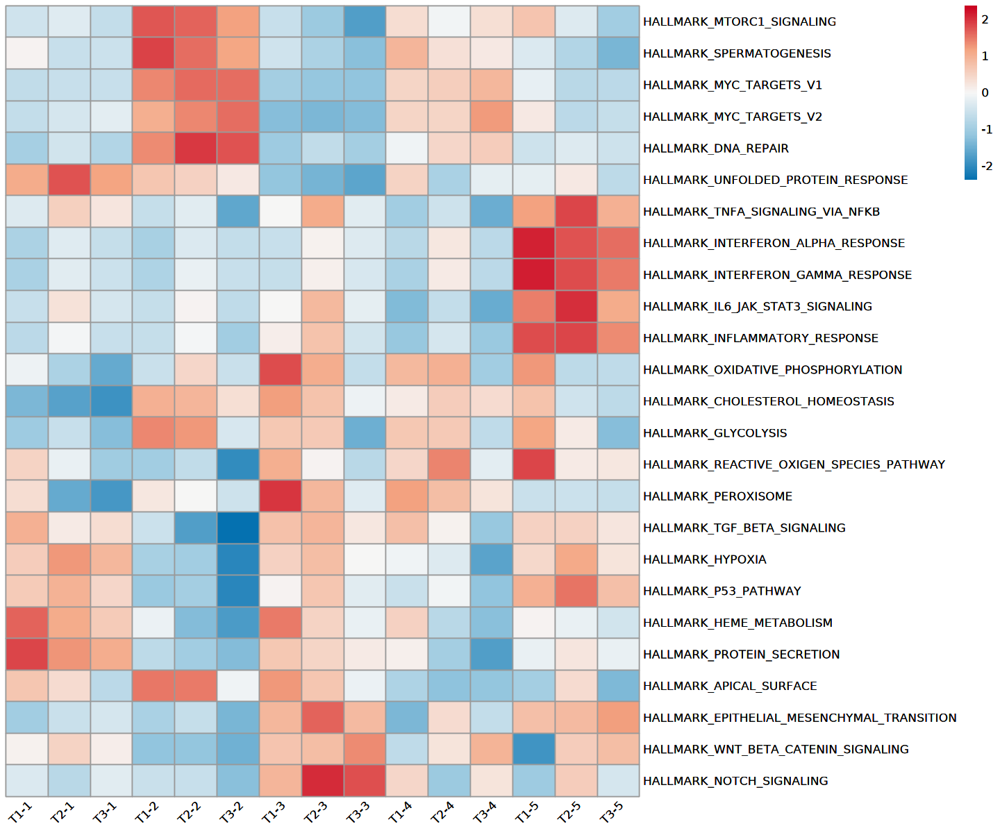

In [50]:
options(repr.plot.width=12, repr.plot.height=10)
library(pheatmap)
plot <- pheatmap(ES, scale = "row",angle_col = "45",cluster_cols = F,cluster_rows = F,
         color = colorRampPalette(rev(brewer.pal(n = 5, name = "RdBu")))(200))
print(plot)
ggsave(plot,file='/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2.sup/hallmark_heatmap_selected.pdf',width=12,height=10)

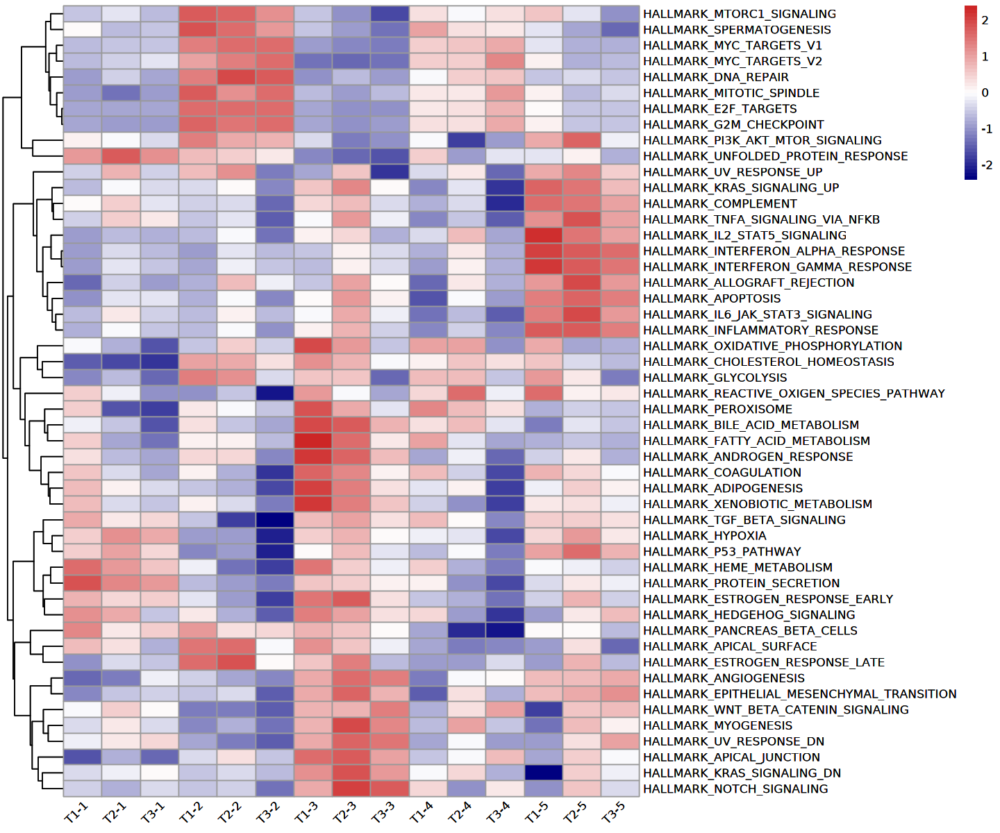

In [452]:
options(repr.plot.width=12, repr.plot.height=10)
library(pheatmap)
plot <- pheatmap(ES, scale = "row",angle_col = "45",cluster_cols = F,
         color = colorRampPalette(c("navy", "white", "firebrick3"))(50))
print(plot)
ggsave(plot,file='/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2.sup/hallmark_heatmap.pdf',width=12,height=10)

In [437]:
sc.all.merge

An object of class Seurat 
32285 features across 91411 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

In [209]:
sc.all.merge@meta.data$seurat_clusters_rename <- factor(sc.all.merge@meta.data$seurat_clusters_rename,levels = c(1:5))

Centering and scaling data matrix

Warning message:
“Removed 50 rows containing missing values or values outside the scale range
(`geom_point()`).”


png 
  2

Warning message:
“Removed 50 rows containing missing values or values outside the scale range
(`geom_point()`).”


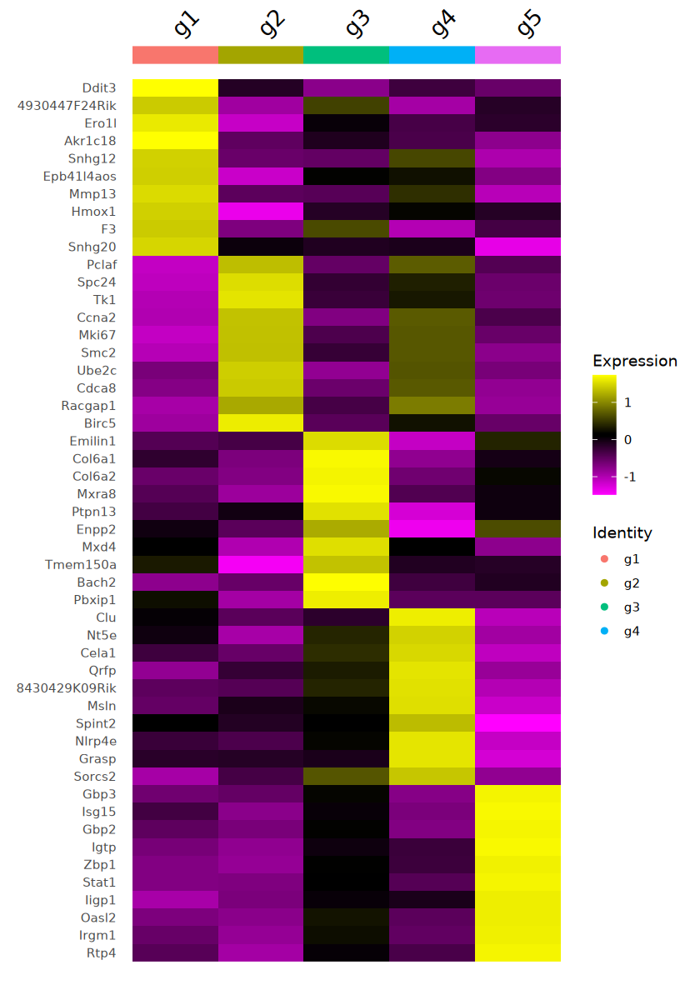

In [213]:
library(dplyr)
sc.all.merge.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 1) %>%
    slice_head(n = 10) %>%
    ungroup() -> top10
top10$cluster <- factor(top10$cluster,levels = c(1:5))
top10 <- top10[order(top10$cluster,decreasing = F),]
cluster.averages <- AggregateExpression(sc.all.merge,features = top10$gene,
                                      group.by = 'seurat_clusters_rename',slot = 'data',return.seurat=TRUE) 
Idents(cluster.averages) <- colnames(cluster.averages)
options(repr.plot.width = 7, repr.plot.height = 10)
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2.sup/cluster_DEGs_top10_heatmap.pdf',width=7,height=10)
plot <- DoHeatmap(cluster.averages,features = top10$gene,draw.lines = F,group.bar.height = 0.02)
print(plot)
dev.off()
print(plot)

Centering and scaling data matrix

Warning message:
“Removed 497 rows containing missing values or values outside the scale range
(`geom_point()`).”


png 
  2

Warning message:
“Removed 497 rows containing missing values or values outside the scale range
(`geom_point()`).”


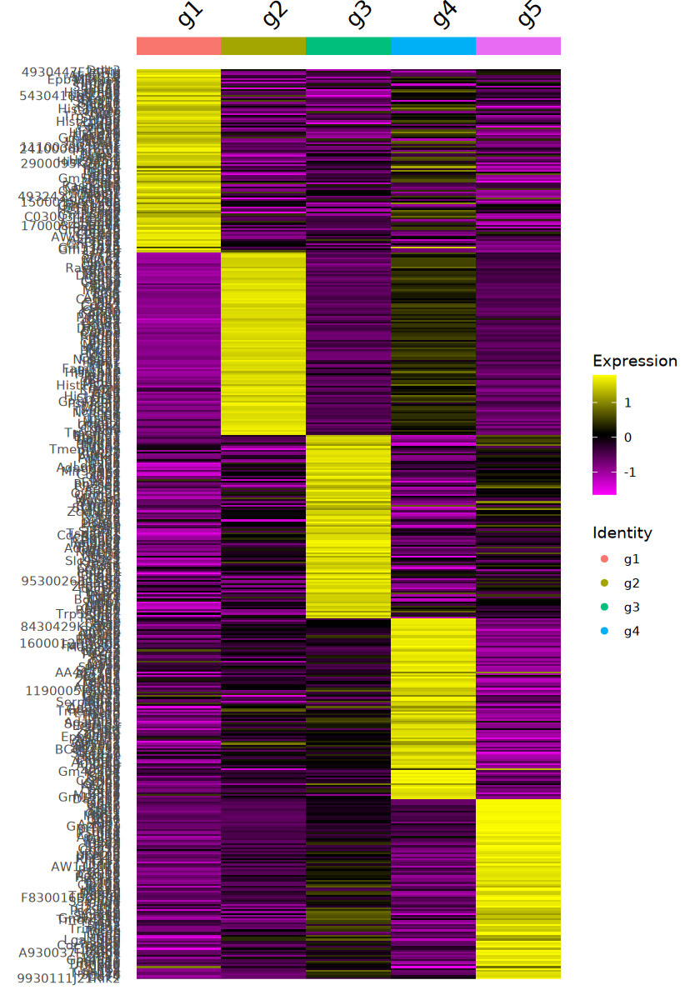

In [212]:
library(dplyr)
sc.all.merge.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 1) %>%
    slice_head(n = 100) %>%
    ungroup() -> top100
top100$cluster <- factor(top100$cluster,levels = c(1:5))
top100 <- top100[order(top100$cluster,decreasing = F),]
cluster.averages <- AggregateExpression(sc.all.merge,features = top100$gene,
                                      group.by = 'seurat_clusters_rename',slot = 'data',return.seurat=TRUE) 
Idents(cluster.averages) <- colnames(cluster.averages)
options(repr.plot.width = 7, repr.plot.height = 10)
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2.sup/cluster_DEGs_top100_heatmap.pdf',width=7,height=10)
plot <- DoHeatmap(cluster.averages,features = top100$gene,draw.lines = F,group.bar.height = 0.02)
print(plot)
dev.off()
print(plot)

In [16]:
sc.all.merge@meta.data$seurat_clusters_rename_time <- paste0(sc.all.merge@meta.data$seurat_clusters_rename,'_',sc.all.merge@meta.data$time)

Centering and scaling data matrix

Warning message:
“Removed 497 rows containing missing values or values outside the scale range
(`geom_point()`).”


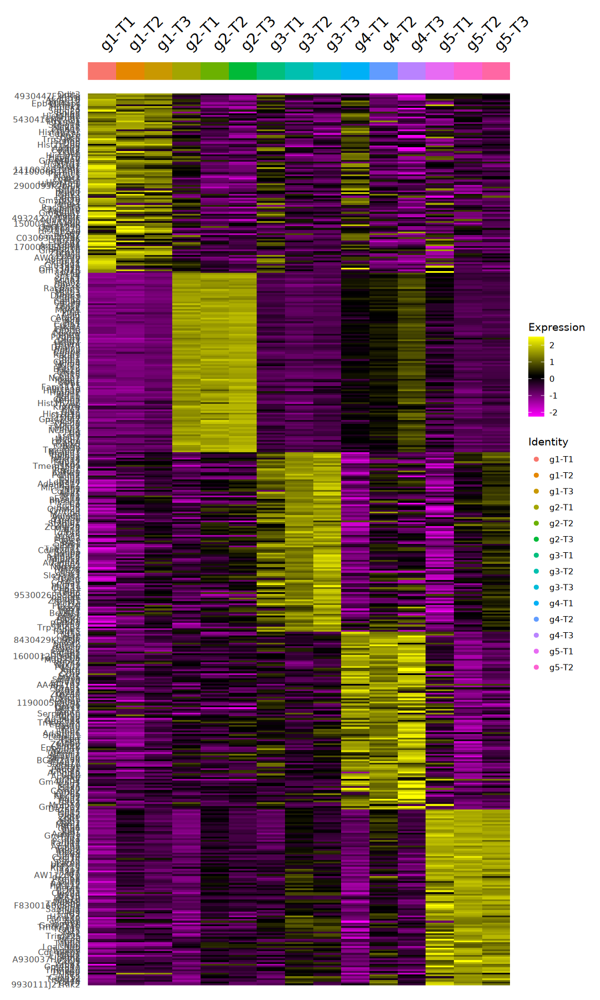

In [151]:
library(dplyr)
sc.all.merge.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 1) %>%
    slice_head(n = 100) %>%
    ungroup() -> top100
top100$cluster <- factor(top100$cluster,levels = c(1:5))
top100 <- top100[order(top100$cluster,decreasing = F),]
cluster.averages <- AggregateExpression(sc.all.merge,features = top100$gene,
                                      group.by = 'seurat_clusters_rename_time',slot = 'data',return.seurat=TRUE) 
Idents(cluster.averages) <- colnames(cluster.averages)
options(repr.plot.width = 9, repr.plot.height = 15)
DoHeatmap(cluster.averages,features = top100$gene,draw.lines = F,group.bar.height = 0.02)

In [152]:
dim(cluster.averages)

[1] 497  15

In [21]:
library(ComplexHeatmap)

Loading required package: grid

ComplexHeatmap version 2.18.0
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite either one:
- Gu, Z. Complex Heatmap Visualization. iMeta 2022.
- Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
    genomic data. Bioinformatics 2016.


The new InteractiveComplexHeatmap package can directly export static 
complex heatmaps into an interactive Shiny app with zero effort. Have a try!

This message can be suppressed by:
  suppressPackageStartupMessages(library(ComplexHeatmap))




png 
  2

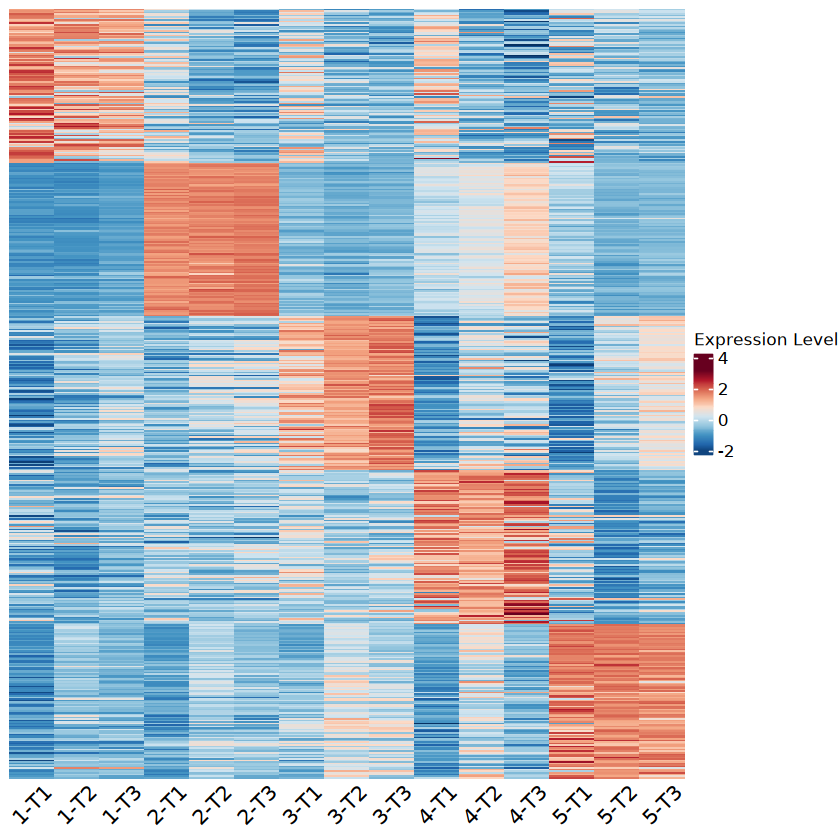

In [197]:
df <- as.matrix(cluster.averages@assays$RNA@layers$scale.data)
colnames(df) <- gsub('g','',colnames(cluster.averages))
rownames(df) <- rownames(cluster.averages)
df <- df[top100$gene,]

library(RColorBrewer)
options(repr.plot.width = 7, repr.plot.height = 7)
pdf(file='/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2/cluster_DEGs_heatmap.pdf',height=7,width=7)
plot <- Heatmap(df,cluster_rows = F,cluster_columns = F,show_row_names = F,column_names_rot = 45,
        column_names_centered = T,heatmap_legend_param = list(title = "Expression Level"),
       col = colorRampPalette(rev(brewer.pal(n = 10, name = "RdBu")))(200))
print(plot)
dev.off()
plot

In [4]:
library(RColorBrewer)

In [5]:
colorRampPalette(rev(brewer.pal(n = 10, name = "RdBu")))(200)

[1] "#053061" "#063264" "#073467" "#08376B" "#0A396E" "#0B3C71" "#0C3E75"
  [8] "#0D4178" "#0F437C" "#10457F" "#114882" "#124A86" "#144D89" "#154F8D"
 [15] "#165290" "#175493" "#195797" "#1A599A" "#1B5B9E" "#1D5EA1" "#1E60A4"
 [22] "#1F63A8" "#2065AB" "#2267AC" "#2369AD" "#256BAF" "#266DB0" "#286FB1"
 [29] "#2A71B2" "#2B74B3" "#2D76B4" "#2E78B5" "#307AB6" "#317CB7" "#337EB8"
 [36] "#3480B9" "#3682BA" "#3784BB" "#3986BC" "#3A88BD" "#3C8ABE" "#3E8CBF"
 [43] "#3F8EC0" "#4190C1" "#4292C2" "#4594C3" "#4997C5" "#4C99C6" "#509BC7"
 [50] "#549DC8" "#57A0CA" "#5BA2CB" "#5EA4CC" "#62A6CD" "#65A9CE" "#69ABD0"
 [57] "#6DADD1" "#70AFD2" "#74B2D3" "#77B4D5" "#7BB6D6" "#7EB8D7" "#82BBD8"
 [64] "#86BDD9" "#89BFDB" "#8DC1DC" "#90C4DD" "#93C5DE" "#96C7DF" "#99C8E0"
 [71] "#9CCAE0" "#9FCBE1" "#A2CDE2" "#A4CEE3" "#A7D0E4" "#AAD1E5" "#ADD2E5"
 [78] "#B0D4E6" "#B3D5E7" "#B6D7E8" "#B8D8E9" "#BBDAE9" "#BEDBEA" "#C1DDEB"
 [85] "#C4DEEC" "#C7E0ED" "#CAE1EE" "#CCE2EE" "#CFE4EF" "#D2E4EE" "#D4E4ED"
 [92] "#D6E3EB" "#D8E3E9" "#DAE2E7" "#DCE2E5" "#DEE2E3" "#E0E1E1" "#E2E1E0"
 [99] "#E4E0DE" "#E6E0DC" "#E7DFDA" "#E9DFD8" "#EBDED6" "#EDDED5" "#EFDDD3"
[106] "#F1DDD1" "#F3DDCF" "#F5DCCD" "#F7DCCB" "#F9DBC9" "#FBDBC8" "#FCD9C5"
[113] "#FCD7C2" "#FCD5BF" "#FBD2BC" "#FBD0B9" "#FACDB6" "#FACBB2" "#F9C8AF"
[120] "#F9C6AC" "#F9C3A9" "#F8C1A6" "#F8BFA3" "#F7BCA0" "#F7BA9D" "#F7B799"
[127] "#F6B596" "#F6B293" "#F5B090" "#F5AD8D" "#F5AB8A" "#F4A987" "#F4A684"
[134] "#F3A381" "#F2A07E" "#F09D7C" "#EF9A7A" "#EE9777" "#EC9475" "#EB9172"
[141] "#EA8E70" "#E88A6E" "#E7876B" "#E58469" "#E48166" "#E37E64" "#E17B62"
[148] "#E0785F" "#DF755D" "#DD725A" "#DC6E58" "#DB6B56" "#D96853" "#D86551"
[155] "#D7624E" "#D55F4C" "#D45C4B" "#D25849" "#D05548" "#CF5246" "#CD4E44"
[162] "#CB4B43" "#CA4841" "#C84540" "#C6413E" "#C53E3D" "#C33B3B" "#C2383A"
[169] "#C03438" "#BE3137" "#BD2E35" "#BB2B34" "#B92732" "#B82430" "#B6212F"
[176] "#B51E2D" "#B31A2C" "#B1172A" "#AE162A" "#AA1529" "#A71429" "#A41328"
[183] "#A01228" "#9D1127" "#991027" "#960F26" "#930E26" "#8F0D25" "#8C0B24"
[190] "#880A24" "#850923" "#820823" "#7E0722" "#7B0622" "#770521" "#740421"
[197] "#710320" "#6D0220" "#6A011F" "#67001F"

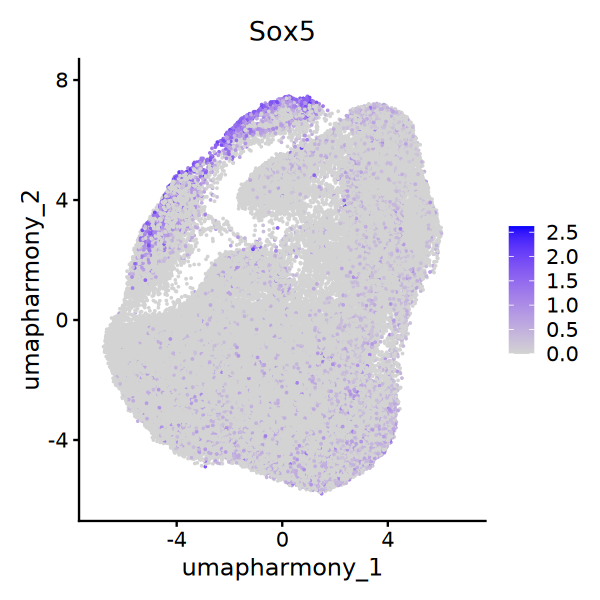

In [66]:
options(repr.plot.width = 5, repr.plot.height = 5) 
FeaturePlot(sc.all.merge, reduction = "umap.harmony",features = 'Sox5')

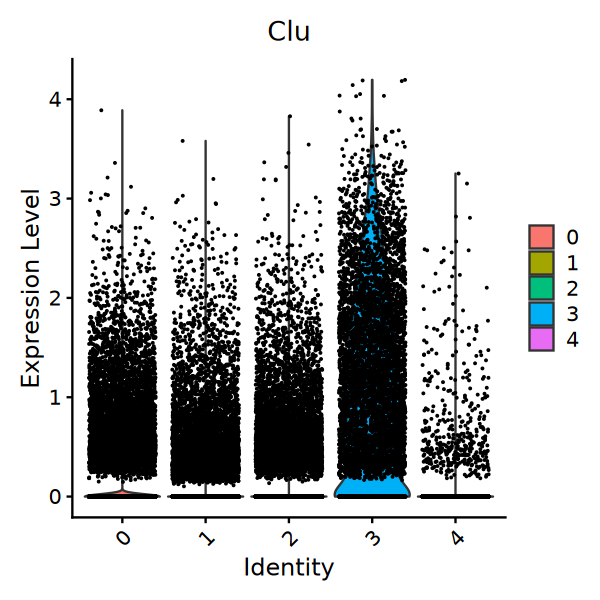

In [69]:
VlnPlot(sc.all.merge, features = 'Clu',group.by = 'seurat_clusters_rename')

In [12]:
options(repr.plot.width = 25, repr.plot.height = 25)
VlnPlot(sc.all.merge,features = top100$gene[top100$cluster==3][51:100],pt.size=0)

ERROR: Error in eval(expr, envir, enclos): object 'top100' not found


In [13]:
genes <- c('Gapdh','Acta1','Hsp90b1','Calr','Rpl39','Cfl1','Myl6','Calm2','Hsp90ab1','Fth1','Hint1','Tpt1','Lgals1','Slc25a3','Calm1','Btf3')

In [12]:
sc.all.merge

An object of class Seurat 
32285 features across 91411 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 19 layers present: counts.T1_a3026, counts.T1_a3028, counts.T1_a3030, counts.T2_a3026, counts.T2_a3028, counts.T2_a3030, counts.T3_a3026, counts.T3_a3028, counts.T3_a3030, scale.data, data.T1_a3026, data.T1_a3028, data.T1_a3030, data.T2_a3026, data.T2_a3028, data.T2_a3030, data.T3_a3026, data.T3_a3028, data.T3_a3030
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

In [15]:
sc.all.merge <- JoinLayers(sc.all.merge)

In [16]:
rownames(sc.all.merge)[rownames(sc.all.merge) %in% genes]

[1] "Gapdh"    "Calr"     "Acta1"    "Hsp90b1"  "Slc25a3"  "Myl6"    
 [7] "Hint1"    "Calm1"    "Btf3"     "Tpt1"     "Lgals1"   "Hsp90ab1"
[13] "Calm2"    "Cfl1"     "Fth1"     "Rpl39"

In [17]:
df <- as.data.frame(t(as.data.frame(as.matrix(sc.all.merge@assays$RNA@layers$data[rownames(sc.all.merge) %in% genes,]))))
df$cellBC <- rownames(df)
colnames(df) <- c(rownames(sc.all.merge)[rownames(sc.all.merge) %in% genes],'cellBC')

In [18]:
library(tidyverse)

Warning message:
“package ‘tidyr’ was built under R version 4.3.3”
Warning message:
“package ‘purrr’ was built under R version 4.3.3”
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.5.0     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


In [19]:
df

,Gapdh,Calr,Acta1,Hsp90b1,Slc25a3,Myl6,Hint1,Calm1,Btf3,Tpt1,Lgals1,Hsp90ab1,Calm2,Cfl1,Fth1,Rpl39,cellBC
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
V1,2.834191,0.8323199,0,1.5884053,1.8912219,2.3939127,2.6066499,2.173827,2.668570,4.457571,4.084951,3.838432,1.5884053,1.9544937,4.055387,3.730282,V1
V2,3.201039,1.5685494,0,1.7155292,2.0591656,1.5685494,1.5685494,2.633249,3.032948,5.106831,2.686408,3.643800,1.1877850,1.9572018,2.236370,3.422225,V2
V3,4.125147,1.8214819,0,1.8214819,1.0793885,2.4302765,2.0117333,2.538232,2.766030,4.979631,3.488405,3.732907,2.3092399,1.4441227,4.224688,3.685313,V3
V4,4.589912,1.6757606,0,1.8696020,1.9211155,2.1583847,2.1041342,2.632916,2.763620,4.799561,3.783540,3.585897,1.4880771,1.9540403,3.721900,3.547151,V4
V5,5.093153,1.5021117,0,2.1304580,1.3998934,2.1304580,2.1304580,3.302618,2.180995,5.015182,4.092900,3.201337,1.5948436,1.9614369,3.717184,3.943945,V5
V6,2.956321,1.5358822,0,1.3957128,1.6587979,1.5358822,2.1151518,1.768246,2.313877,4.698251,2.479581,3.206611,0.7953159,1.6587979,3.230916,4.041233,V6
V7,3.845099,1.4106352,0,1.8690390,1.9400021,1.9736804,2.2345494,2.802923,3.010936,4.778985,3.673117,3.623478,1.9400021,1.6658770,3.834853,3.660936,V7
V8,2.917850,1.6422949,0,1.1260676,1.6422949,2.0898774,3.1391906,3.139191,2.470997,4.076206,3.923704,3.881645,0.6061737,2.3593559,3.971945,3.102422,V8
V9,3.739459,1.1248513,0,1.6408431,1.9049894,2.5617606,1.7368557,2.232059,2.954800,5.008652,3.455573,3.314801,1.2808501,1.4157653,4.115992,3.960318,V9


In [20]:
df.long <- pivot_longer(
  data = df,
  cols = -c(cellBC),  # Specify the columns to pivot
  names_to = "Gene",           # Name of the new column containing the original column names
  values_to = "Expression_Level"          # Name of the new column containing the values
)

In [21]:
library(ggplot2)

In [22]:
df.long$Gene <- factor(df.long$Gene,levels=genes)

In [23]:
df.long

cellBC,Gene,Expression_Level
<chr>,<fct>,<dbl>
V1,Gapdh,2.8341907
V1,Calr,0.8323199
V1,Acta1,0.0000000
V1,Hsp90b1,1.5884053
V1,Slc25a3,1.8912219
V1,Myl6,2.3939127
V1,Hint1,2.6066499
V1,Calm1,2.1738275
V1,Btf3,2.6685698


png 
  2

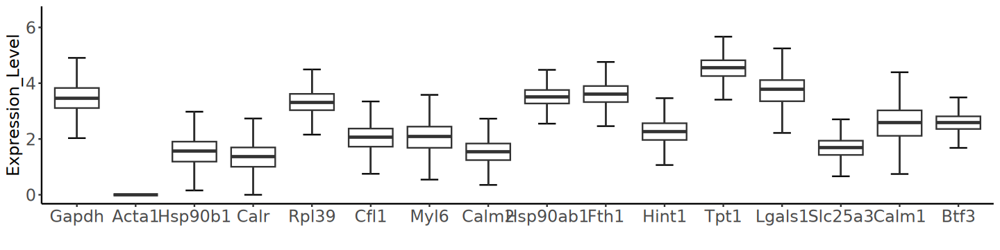

In [31]:
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2/sc_15_gene_exp.pdf',width=12,height=3)
options(repr.plot.width = 12, repr.plot.height = 3)
plot <- ggplot(df.long,aes(x=Gene,y=Expression_Level))+stat_boxplot(geom = "errorbar",width=0.3)+geom_boxplot(outlier.shape = NA)  + xlab('') +theme_classic()+
    theme(axis.title=element_text(size=14),axis.text = element_text(size = 14))
print(plot)
dev.off()
print(plot)

In [571]:
library(dplyr)

# 假设你的 data.frame 叫 df，有两列：group（分组），value（值）
sc_gene_exp <- df.long %>%
  group_by(Gene) %>%
  summarise(median_value = median(Expression_Level, na.rm = TRUE))%>% as.data.frame()

In [572]:
sc_gene_exp

Gene,median_value
<fct>,<dbl>
Gapdh,3.456484
Acta1,0.000000
Hsp90b1,1.559453
Calr,1.367469
Rpl39,3.320943
Cfl1,2.075292
Myl6,2.082785
Calm2,1.555191
Hsp90ab1,3.520245


In [573]:
write.table(sc_gene_exp,file='/syn1/liangzhen/jinhua_jilab_project/result/scRNA/15gene_exp.csv',sep=',',quote=F,row.names = F)

In [176]:
sc.all.merge

An object of class Seurat 
32285 features across 91411 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

In [18]:
gmt <- clusterProfiler::read.gmt('/syn1/liangzhen/fanli_tfseq_project/hisat2_index/mh.all.v2023.2.Mm.symbols.gmt')
h_df = gmt[,c(2,1)]
h_list = unstack(h_df)

In [178]:
h_list$HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION

[1] "Abi3bp"    "Acta2"     "Adam12"    "Anpep"     "Aplp1"     "Areg"     
  [7] "Basp1"     "Bdnf"      "Bgn"       "Bmp1"      "Cadm1"     "Cald1"    
 [13] "Calu"      "Cap2"      "Capg"      "Ccn1"      "Ccn2"      "Cd44"     
 [19] "Cdh11"     "Cdh2"      "Cdh6"      "Col11a1"   "Col12a1"   "Col16a1"  
 [25] "Col1a1"    "Col1a2"    "Col3a1"    "Col4a1"    "Col4a2"    "Col5a1"   
 [31] "Col5a2"    "Col5a3"    "Col6a2"    "Col6a3"    "Col7a1"    "Col8a2"   
 [37] "Colgalt1"  "Comp"      "Copa"      "Crlf1"     "Cthrc1"    "Cxcl12"   
 [43] "Cxcl15"    "Cxcl5"     "Dab2"      "Dcn"       "Dkk1"      "Dpysl3"   
 [49] "Dst"       "Ecm1"      "Ecm2"      "Edil3"     "Efemp2"    "Eln"      
 [55] "Emp3"      "Eno2"      "Fap"       "Fas"       "Fbln1"     "Fbln2"    
 [61] "Fbln5"     "Fbn1"      "Fbn2"      "Fermt2"    "Fgf2"      "Flna"     
 [67] "Fmod"      "Fn1"       "Foxc2"     "Fstl1"     "Fstl3"     "Fuca1"    
 [73] "Fzd8"      "Gadd45a"   "Gadd45b"   "Gas1"      "Gem"       "Gja1"     
 [79] "Glipr1"    "Gm21451"   "Gpc1"      "Gpx7"      "Grem1"     "Htra1"    
 [85] "Id2"       "Igfbp2"    "Igfbp3"    "Igfbp4"    "Il15"      "Il6"      
 [91] "Inhba"     "Itga2"     "Itga5"     "Itgav"     "Itgb1"     "Itgb3"    
 [97] "Itgb5"     "Jun"       "Lama1"     "Lama2"     "Lama3"     "Lamc1"    
[103] "Lamc2"     "Lgals1"    "Lox"       "Loxl1"     "Lrp1"      "Lrrc15"   
[109] "Lum"       "Magee1"    "Matn2"     "Matn3"     "Mcm7"      "Mest"     
[115] "Mfap5"     "Mgp"       "Mmp14"     "Mmp2"      "Mmp3"      "Msx1"     
[121] "Myl9"      "Mylk"      "Nid2"      "Nnmt"      "Notch2"    "Nt5e"     
[127] "Ntm"       "Oxtr"      "P3h1"      "Pcolce"    "Pcolce2"   "Pdgfrb"   
[133] "Pdlim4"    "Pfn2"      "Plaur"     "Plod1"     "Plod2"     "Plod3"    
[139] "Pmepa1"    "Pmp22"     "Postn"     "Ppib"      "Prrx1"     "Pthlh"    
[145] "Ptx3"      "Pvr"       "Qsox1"     "Rgs4"      "Rhob"      "Sat1"     
[151] "Scg2"      "Sdc1"      "Sdc4"      "Serpine1"  "Serpine2"  "Serpinh1" 
[157] "Sfrp1"     "Sfrp4"     "Sgcb"      "Sgcd"      "Sgcg"      "Slc6a8"   
[163] "Slit2"     "Slit3"     "Snai2"     "Sntb1"     "Sparc"     "Spock1"   
[169] "Spp1"      "Tagln"     "Tfpi2"     "Tgfb1"     "Tgfbi"     "Tgfbr3"   
[175] "Tgm2"      "Thbs1"     "Thbs2"     "Thy1"      "Timp1"     "Timp3"    
[181] "Tnc"       "Tnfaip3"   "Tnfrsf11b" "Tnfrsf12a" "Tpm1"      "Tpm2"     
[187] "Tpm4"      "Vcam1"     "Vcan"      "Vegfa"     "Vegfc"     "Vim"      
[193] "Wipf1"     "Wnt5a"

In [179]:
sc.all.merge <- AddModuleScore(
  object = sc.all.merge,
  features = list(h_list$HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION),
  name = 'EMT'
) 

Warning message:
“The following features are not present in the object: Gm21451, not searching for symbol synonyms”


In [13]:
sc.all.merge@meta.data$time_cluster <- paste0(sc.all.merge@meta.data$time,'_',sc.all.merge@meta.data$seurat_clusters_rename)
sc.all.merge@meta.data$time_cluster <- factor(sc.all.merge@meta.data$time_cluster,
                                              levels = c('T1_1','T2_1','T3_1','T1_2','T2_2','T3_2',
                                                        'T1_3','T2_3','T3_3','T1_4','T2_4','T3_4','T1_5','T2_5','T3_5'))

In [14]:
sc.all.merge@meta.data$

An object of class Seurat 
32285 features across 91411 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 19 layers present: counts.T1_a3026, counts.T1_a3028, counts.T1_a3030, counts.T2_a3026, counts.T2_a3028, counts.T2_a3030, counts.T3_a3026, counts.T3_a3028, counts.T3_a3030, scale.data, data.T1_a3026, data.T1_a3028, data.T1_a3030, data.T2_a3026, data.T2_a3028, data.T2_a3030, data.T3_a3026, data.T3_a3028, data.T3_a3030
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

Centering and scaling data matrix

Warning message:
“Removed 15 rows containing missing values or values outside the scale range
(`geom_point()`).”


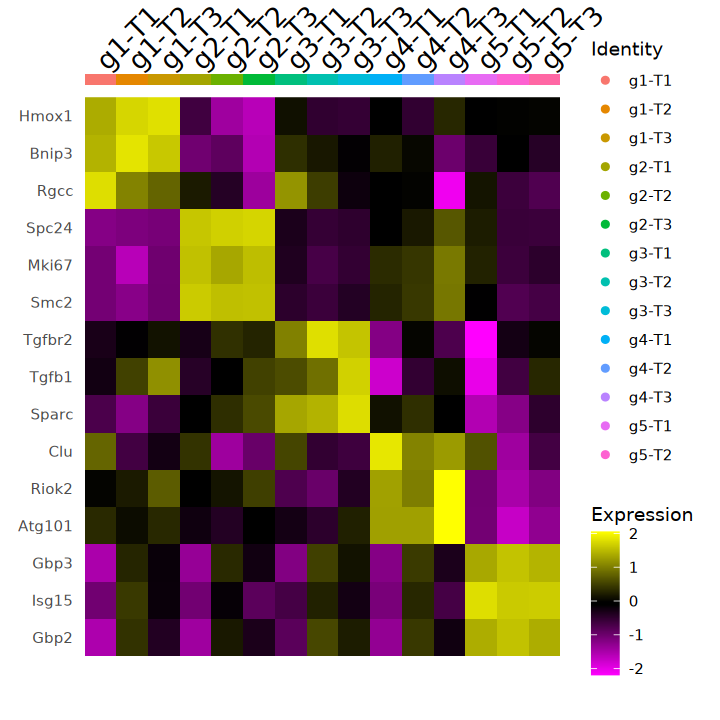

In [23]:
state_genes <- c('Hmox1','Bnip3','Rgcc','Spc24','Mki67','Smc2','Tgfbr2','Tgfb1','Sparc','Clu','Riok2','Atg101','Gbp3','Isg15','Gbp2')
cluster.averages <- AggregateExpression(sc.all.merge,features = state_genes,
                                      group.by = 'seurat_clusters_rename_time',slot = 'data',return.seurat=TRUE) 
Idents(cluster.averages) <- colnames(cluster.averages)
options(repr.plot.width = 6, repr.plot.height = 6)
DoHeatmap(cluster.averages,features = state_genes,draw.lines = F,group.bar.height = 0.02)

Centering and scaling data matrix

Warning message:
“Removed 15 rows containing missing values or values outside the scale range
(`geom_point()`).”


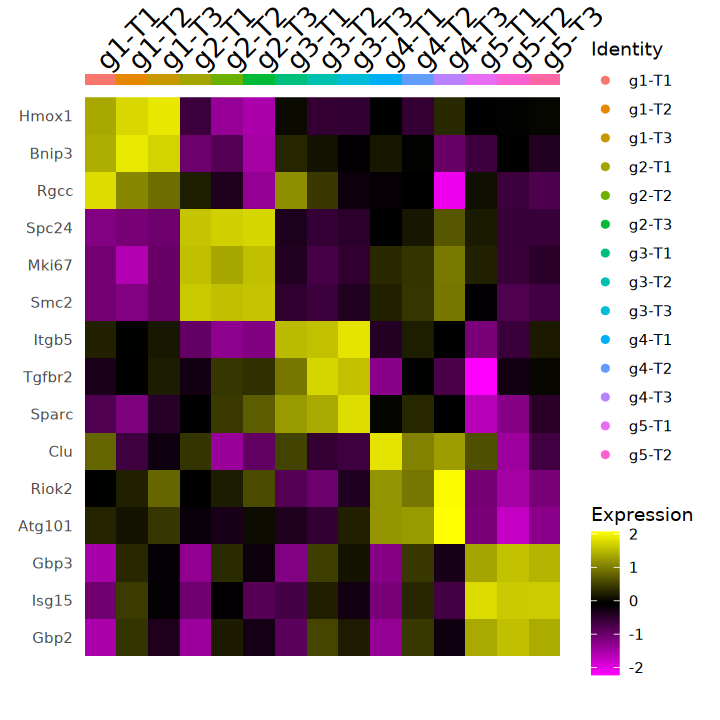

In [26]:
state_genes <- c('Hmox1','Bnip3','Rgcc','Spc24','Mki67','Smc2','Itgb5','Tgfbr2','Sparc','Clu','Riok2','Atg101','Gbp3','Isg15','Gbp2')
cluster.averages <- AggregateExpression(sc.all.merge,features = state_genes,
                                      group.by = 'seurat_clusters_rename_time',slot = 'data',return.seurat=TRUE) 
Idents(cluster.averages) <- colnames(cluster.averages)
options(repr.plot.width = 6, repr.plot.height = 6)
DoHeatmap(cluster.averages,features = state_genes,draw.lines = F,group.bar.height = 0.02)

png 
  2

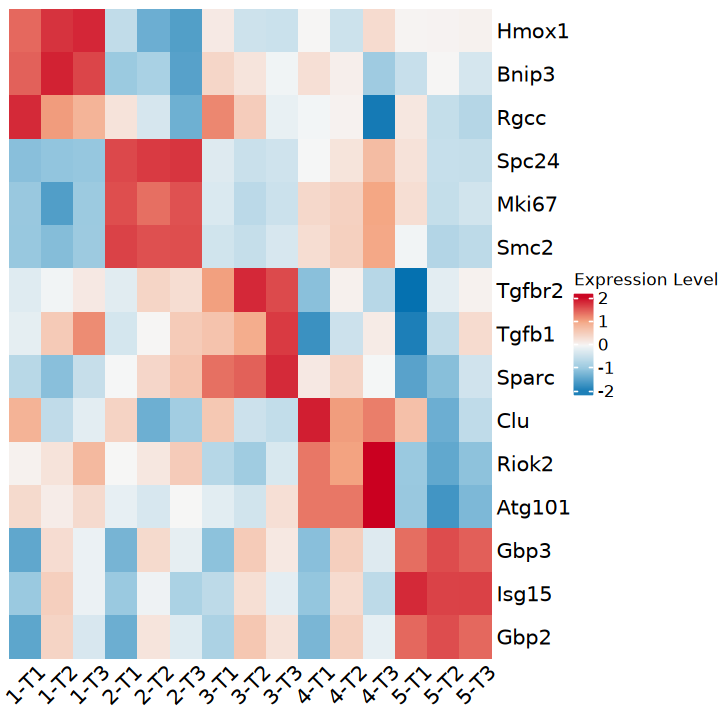

In [24]:
df <- as.matrix(cluster.averages@assays$RNA@layers$scale.data)
colnames(df) <- gsub('g','',colnames(cluster.averages))
rownames(df) <- rownames(cluster.averages)
df <- df[state_genes,]

library(RColorBrewer)
options(repr.plot.width = 6, repr.plot.height = 6)
pdf(file='/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2/cluster_DEGs_heatmap_selected.pdf',height=7,width=7)
plot <- Heatmap(df,cluster_rows = F,cluster_columns = F,show_row_names = T,column_names_rot = 45,
        column_names_centered = T,heatmap_legend_param = list(title = "Expression Level"),
       col = colorRampPalette(rev(brewer.pal(n = 5, name = "RdBu")))(200))
print(plot)
dev.off()
plot

In [20]:
library(RColorBrewer)

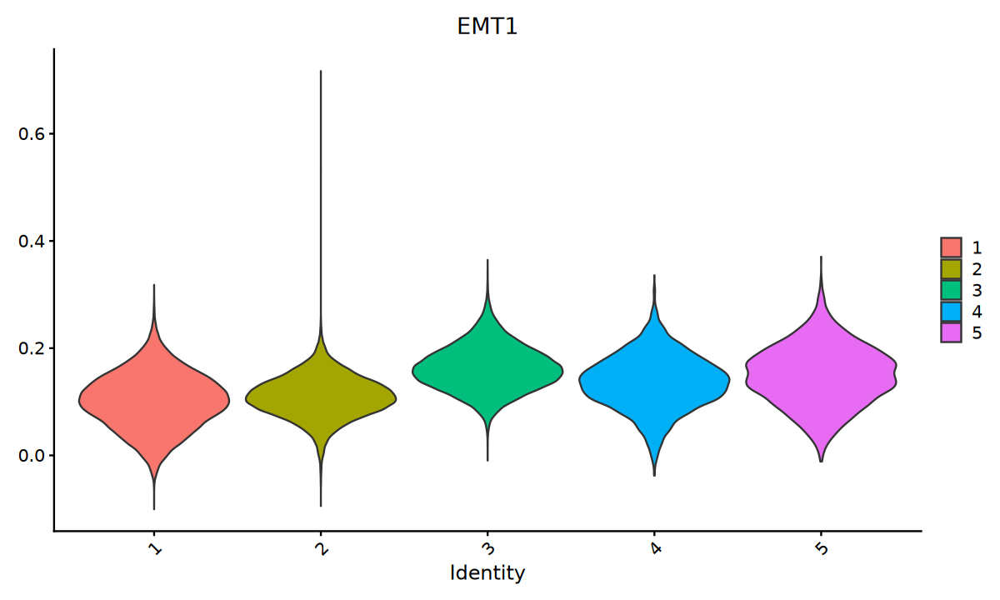

In [182]:
options(repr.plot.width = 10, repr.plot.height = 6)
VlnPlot(sc.all.merge,features = 'EMT1',group.by = 'seurat_clusters_rename',pt.size=0)

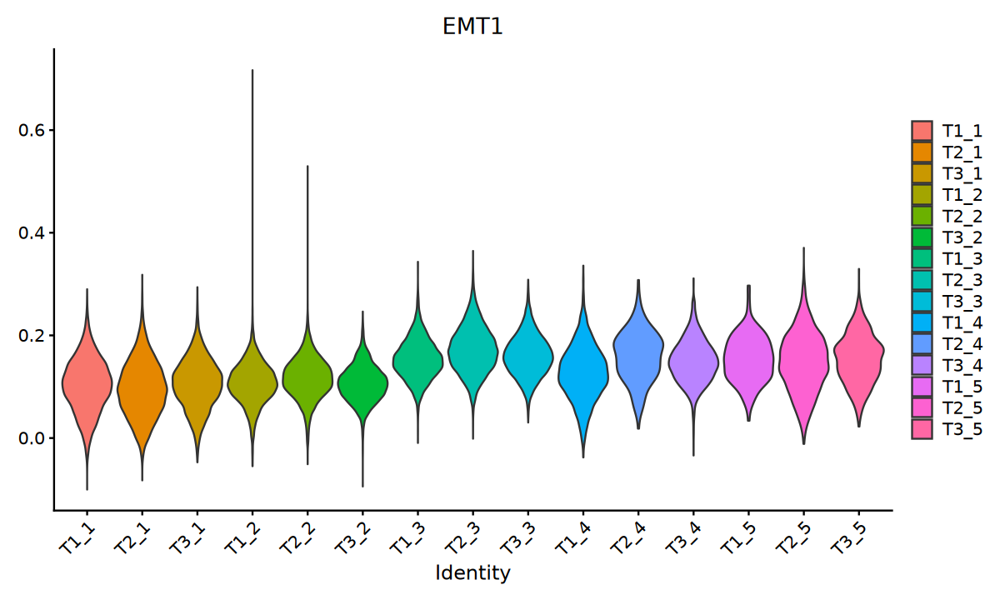

In [183]:
options(repr.plot.width = 10, repr.plot.height = 6)
VlnPlot(sc.all.merge,features = 'EMT1',group.by = 'time_cluster',pt.size=0)

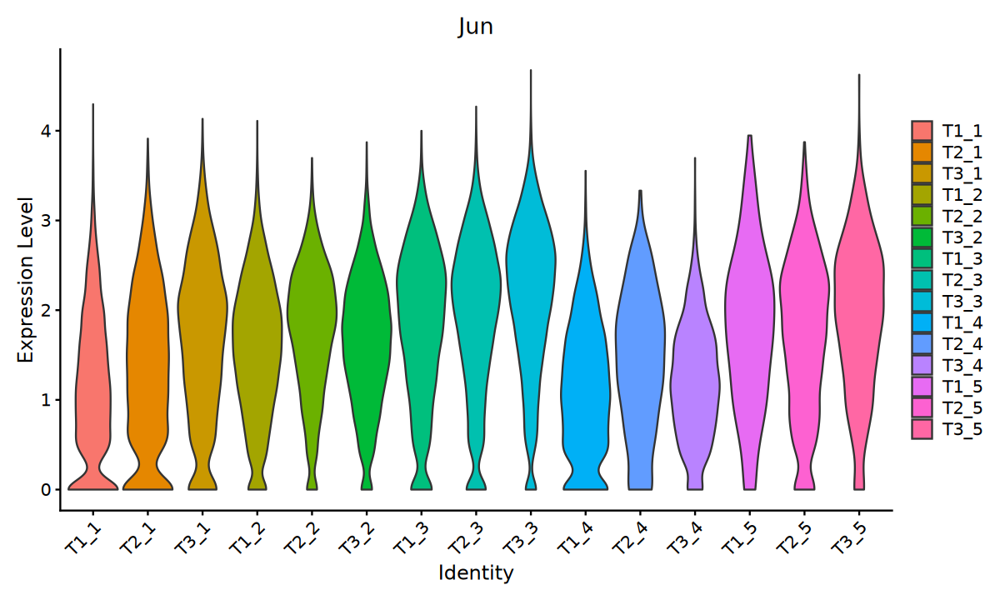

In [184]:
options(repr.plot.width = 10, repr.plot.height = 6)
VlnPlot(sc.all.merge,features = 'Jun',group.by = 'time_cluster',pt.size=0)

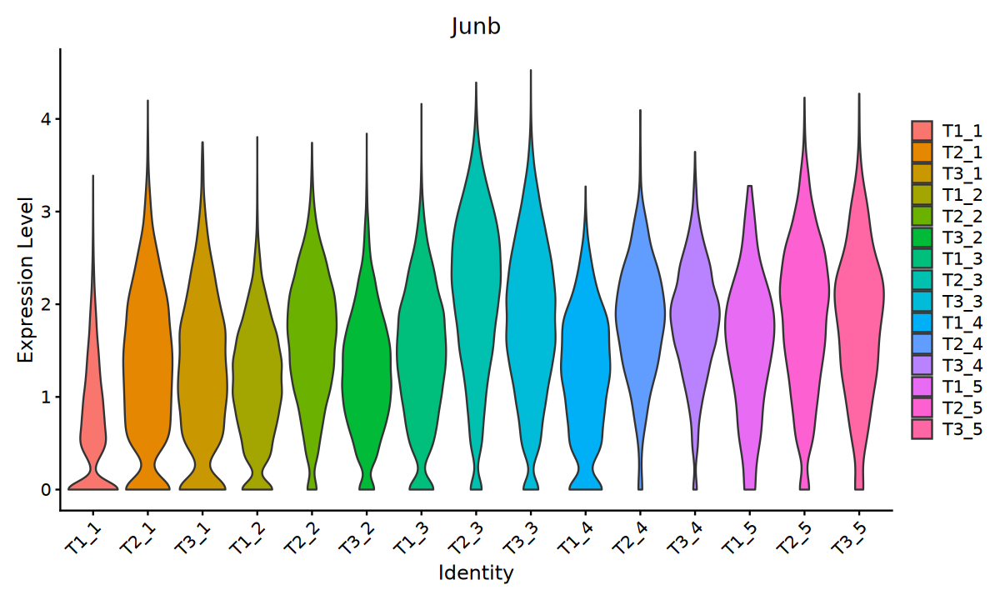

In [189]:
options(repr.plot.width = 10, repr.plot.height = 6)
VlnPlot(sc.all.merge,features = 'Junb',group.by = 'time_cluster',pt.size=0)

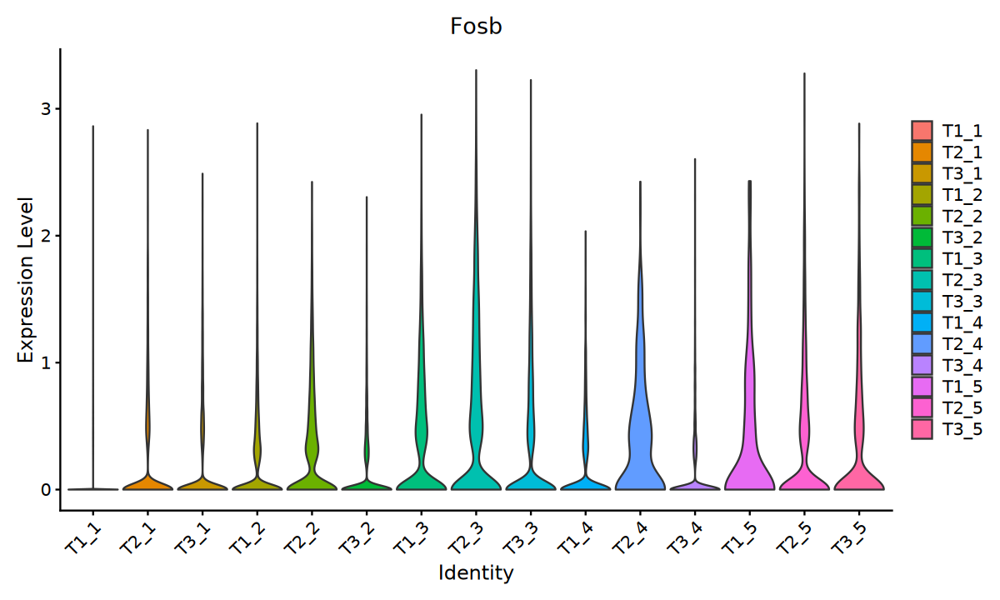

In [185]:
options(repr.plot.width = 10, repr.plot.height = 6)
VlnPlot(sc.all.merge,features = 'Fosb',group.by = 'time_cluster',pt.size=0)

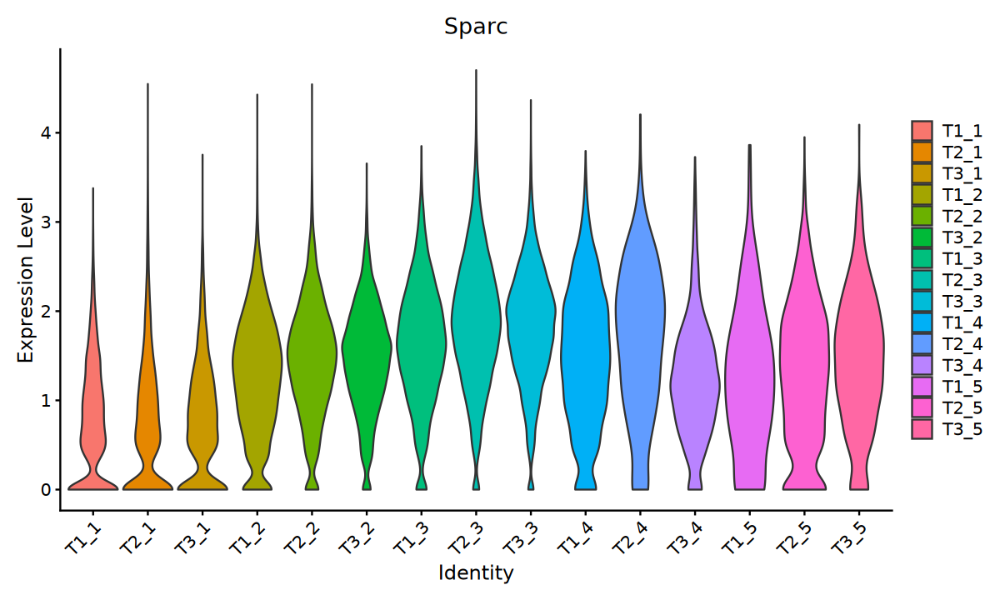

In [291]:
options(repr.plot.width = 10, repr.plot.height = 6)
VlnPlot(sc.all.merge,features = 'Sparc',group.by = 'time_cluster',pt.size=0)

In [25]:
sc.all.merge

An object of class Seurat 
32285 features across 91411 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 19 layers present: counts.T1_a3026, counts.T1_a3028, counts.T1_a3030, counts.T2_a3026, counts.T2_a3028, counts.T2_a3030, counts.T3_a3026, counts.T3_a3028, counts.T3_a3030, scale.data, data.T1_a3026, data.T1_a3028, data.T1_a3030, data.T2_a3026, data.T2_a3028, data.T2_a3030, data.T3_a3026, data.T3_a3028, data.T3_a3030
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

In [34]:
df <- FetchData(sc.all.merge, vars=c('Fosb','Jun','Hmga1','Irf1','seurat_clusters_rename','time'))
df <- df[df$seurat_clusters_rename %in% c('1','2','3'),]
df[df$time=='T1','time'] <- 'BL'
df[df$time %in% c('T2','T3'),'time'] <- 'EELE'
df$time_cluster <- paste0(df$seurat_clusters_rename,'_',df$time)
df

,Fosb,Jun,Hmga1,Irf1,seurat_clusters_rename,time,time_cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
T1_T1_a3026_AAACCCAAGACTAGAT-1,0.0000000,1.2801808,0.3596876,0.3596876,2,BL,2_BL
T1_T1_a3026_AAACCCACATGAGATA-1,0.0000000,0.5652775,0.0000000,0.0000000,1,BL,1_BL
T1_T1_a3026_AAACCCAGTCGCTGCA-1,0.0000000,0.0000000,0.0000000,0.0000000,1,BL,1_BL
T1_T1_a3026_AAACCCAGTCTCGCGA-1,0.0000000,1.6757606,0.4519851,0.0000000,1,BL,1_BL
T1_T1_a3026_AAACCCATCACGGGAA-1,0.0000000,1.2860243,0.0000000,0.0000000,1,BL,1_BL
T1_T1_a3026_AAACCCATCGCTTACC-1,0.0000000,0.0000000,0.4747239,0.0000000,1,BL,1_BL
T1_T1_a3026_AAACGAAAGATGAAGG-1,0.0000000,1.7521541,0.2137803,0.0000000,2,BL,2_BL
T1_T1_a3026_AAACGAAAGATGGCGT-1,0.3483312,2.3979710,0.9808813,0.0000000,2,BL,2_BL
T1_T1_a3026_AAACGAAAGGATACAT-1,1.1248513,1.6408431,0.0000000,0.0000000,3,BL,3_BL


In [38]:
library(ggplot2)
library(ggpubr)

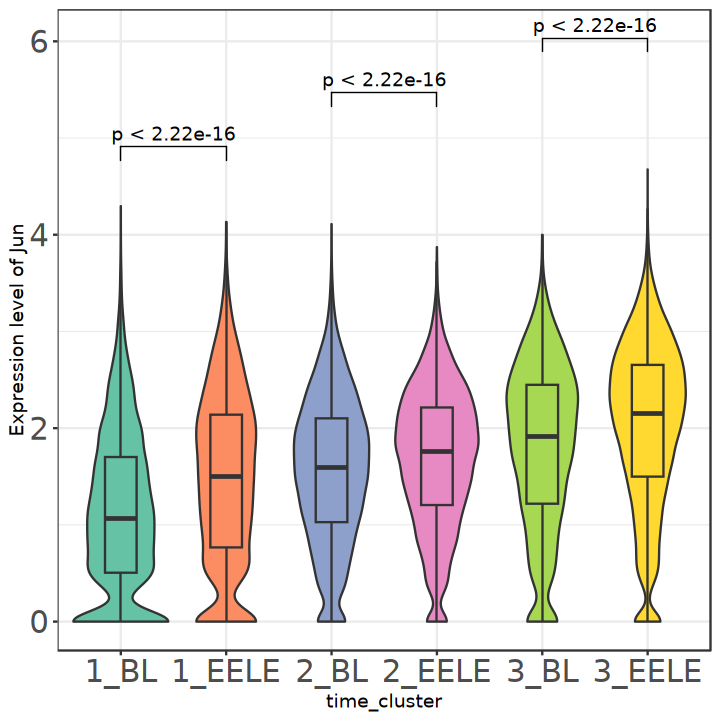

In [40]:
#pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure5/sc_state_Jun_exp_BLEELE.pdf',width=10,height=10)
options(repr.plot.width = 6, repr.plot.height = 6)
plot <- ggplot(df,aes(x=time_cluster,y=Jun,fill=time_cluster))+geom_violin(trim = T) +  # 小提琴图
  geom_boxplot(width = 0.3, outlier.shape = NA) +
  scale_fill_brewer(palette = "Set2") +  
  ylab('Expression level of Jun')+
  theme_bw()+
  theme(
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18)
  )+
  stat_compare_means(comparisons = list(c("1_EELE", "1_BL"), c("2_EELE", "2_BL"), c("3_EELE", "3_BL")),
                     method = "wilcox.test",label = "p.format") 
#print(plot)
#dev.off()
print(plot)

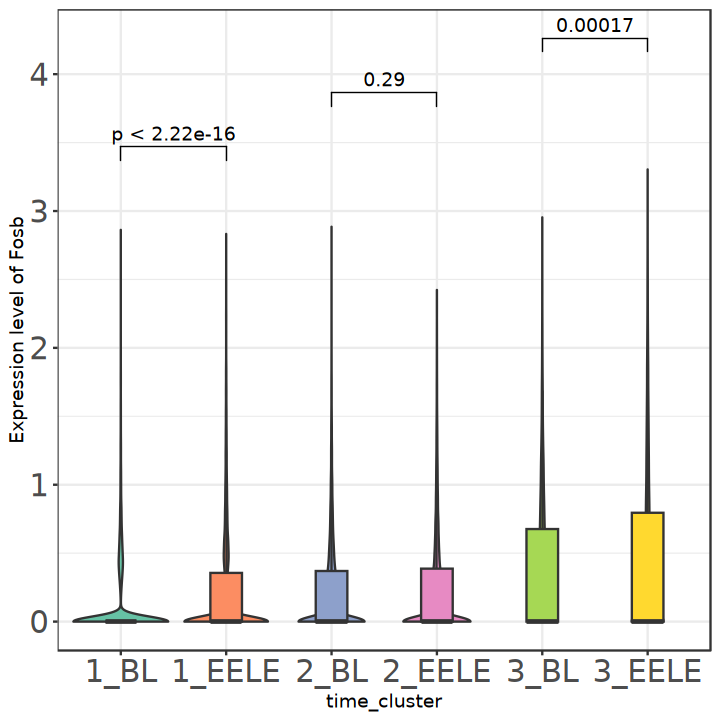

In [42]:
#pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure5/sc_state_Jun_exp_BLEELE.pdf',width=10,height=10)
options(repr.plot.width = 6, repr.plot.height = 6)
plot <- ggplot(df,aes(x=time_cluster,y=Fosb,fill=time_cluster))+geom_violin(trim = T) +  # 小提琴图
  geom_boxplot(width = 0.3, outlier.shape = NA) +
  scale_fill_brewer(palette = "Set2") +  
  ylab('Expression level of Fosb')+
  theme_bw()+
  theme(
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18)
  )+
  stat_compare_means(comparisons = list(c("1_EELE", "1_BL"), c("2_EELE", "2_BL"), c("3_EELE", "3_BL")),
                     method = "wilcox.test",label = "p.format") 
#print(plot)
#dev.off()
print(plot)

In [28]:
library(tidyr)

Warning message:
“package ‘tidyr’ was built under R version 4.3.3”

Attaching package: ‘tidyr’


The following object is masked from ‘package:S4Vectors’:

    expand




In [460]:
df <- pivot_longer(data = df,cols = -c(seurat_clusters_rename),names_to = 'gene',values_to = 'Expression_Level')

In [461]:
df

seurat_clusters_rename,gene,Expression_Level
<chr>,<chr>,<dbl>
2,Fosb,0.0000000
2,Jun,1.2801808
2,Hmga1,0.3596876
2,Irf1,0.3596876
1,Fosb,0.0000000
1,Jun,0.5652775
1,Hmga1,0.0000000
1,Irf1,0.0000000
1,Fosb,0.0000000


png 
  2

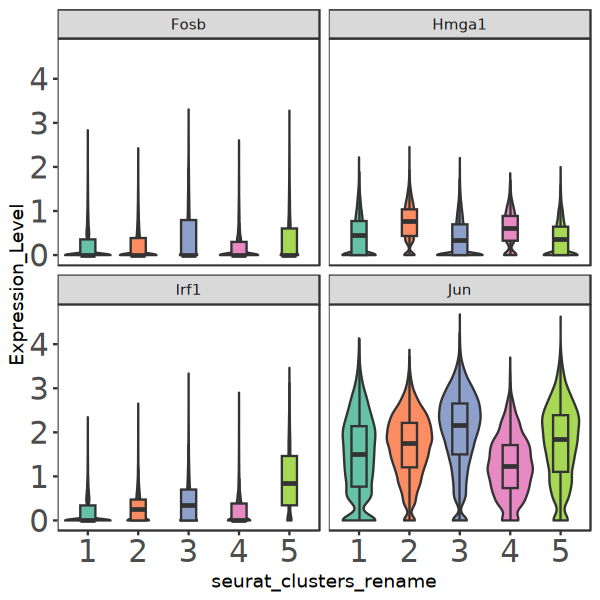

In [457]:
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure5/scRNA_gene_exp_EEandLE.pdf',width=5,height=5)
options(repr.plot.width = 5, repr.plot.height = 5)
plot <- ggplot(df,aes(x=seurat_clusters_rename,y=Expression_Level,fill=seurat_clusters_rename))+geom_violin(trim = T) +  # 小提琴图
  geom_boxplot(width = 0.3, outlier.shape = NA) +  # 盒型图
  scale_fill_brewer(palette = "Set2") +  facet_wrap(~gene)+
  theme_bw()+
  theme(panel.grid = element_blank(),
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18)
  )
print(plot)
dev.off()
print(plot)

png 
  2

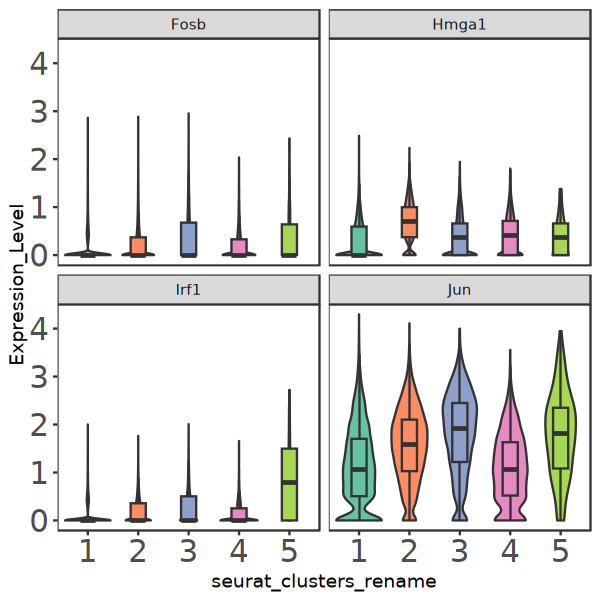

In [462]:
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure5/scRNA_gene_exp_BL.pdf',width=5,height=5)
options(repr.plot.width = 5, repr.plot.height = 5)
plot <- ggplot(df,aes(x=seurat_clusters_rename,y=Expression_Level,fill=seurat_clusters_rename))+geom_violin(trim = T) +  # 小提琴图
  geom_boxplot(width = 0.3, outlier.shape = NA) +  # 盒型图
  scale_fill_brewer(palette = "Set2") +  facet_wrap(~gene)+
  theme_bw()+
  theme(panel.grid = element_blank(),
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18)
  )
print(plot)
dev.off()
print(plot)

png 
  2

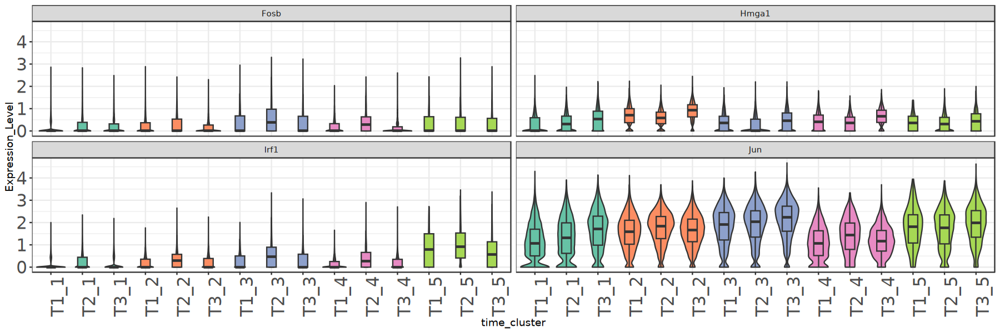

In [428]:
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure5/scRNA_gene_exp_time.pdf',width=15,height=5)
options(repr.plot.width = 15, repr.plot.height = 5)
plot <- ggplot(df,aes(x=time_cluster,y=Expression_Level,fill=time_cluster))+geom_violin(trim = T) +  # 小提琴图
  geom_boxplot(width = 0.3, outlier.shape = NA) +  # 盒型图
  scale_fill_manual(values = c(
  "#66c2a5", "#66c2a5", "#66c2a5", "#fc8d62","#fc8d62","#fc8d62",
  "#8da0cb","#8da0cb","#8da0cb", "#e78ac3","#e78ac3","#e78ac3","#a6d854","#a6d854","#a6d854"
)) +  facet_wrap(~gene)+
  theme_bw()+
  theme(
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18),
    axis.text.x = element_text(face = "bold",size = 18,angle = 90)
  )
print(plot)
dev.off()
print(plot)

png 
  2

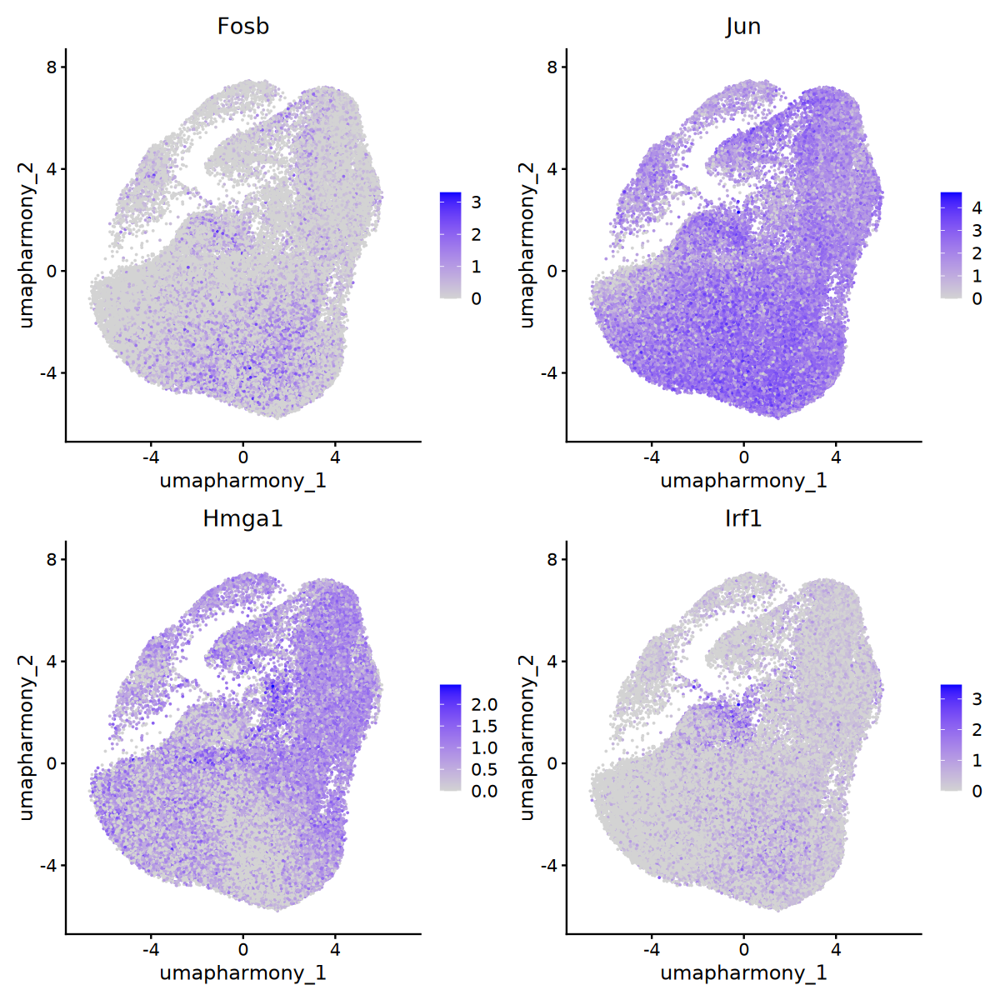

In [331]:
pdf('/syn1/liangzhen/jinhua_jilab_project/result/scRNA/sc_TF_gene_exp_T23.pdf',width=10,height=10)
sc.all.merge.T23 <- subset(sc.all.merge,time %in% c('T2','T3'))
options(repr.plot.width = 10, repr.plot.height = 10)
plot <- FeaturePlot(sc.all.merge.T23,features = c('Fosb','Jun','Hmga1','Irf1'),reduction = "umap.harmony")
print(plot)
dev.off()
print(plot)


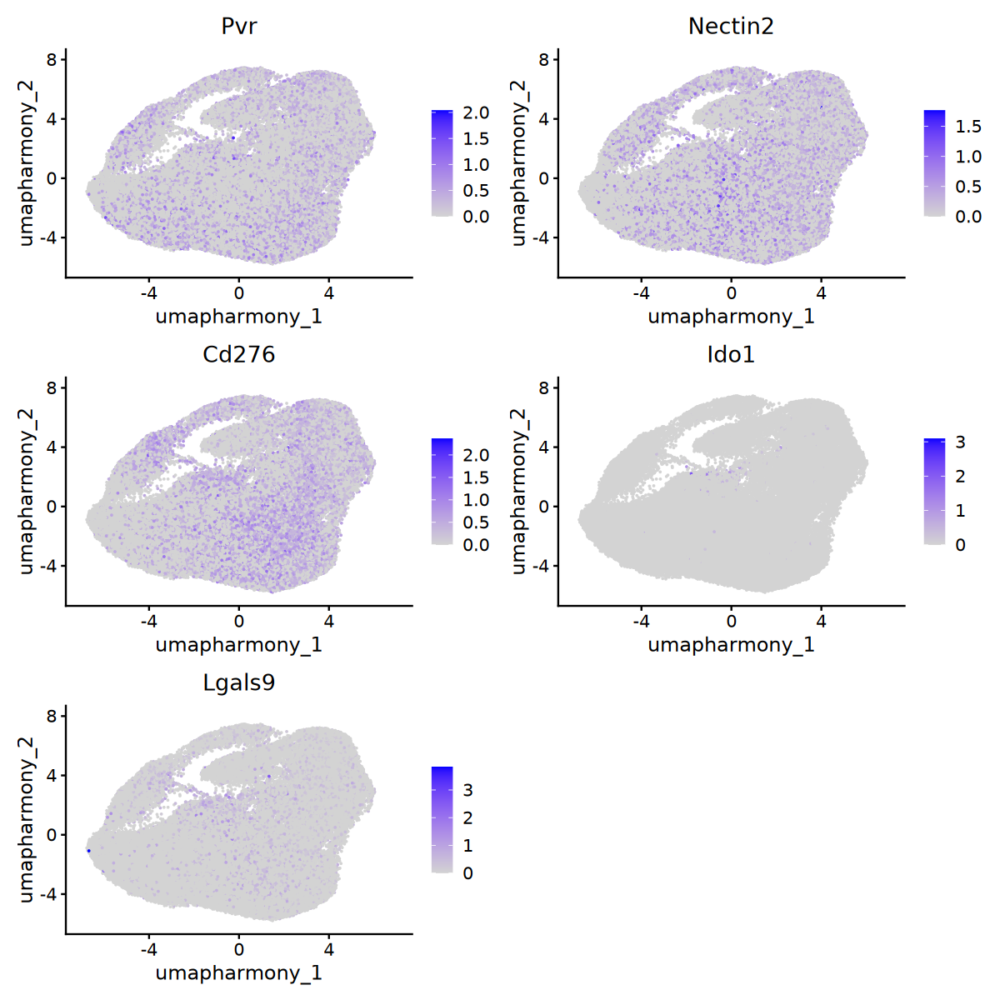

In [201]:
options(repr.plot.width = 10, repr.plot.height = 10)
FeaturePlot(sc.all.merge,features = c('Pvr','Nectin2','Cd276','Ido1','Lgals9'),reduction = "umap.harmony")

In [2]:
library(Seurat)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect




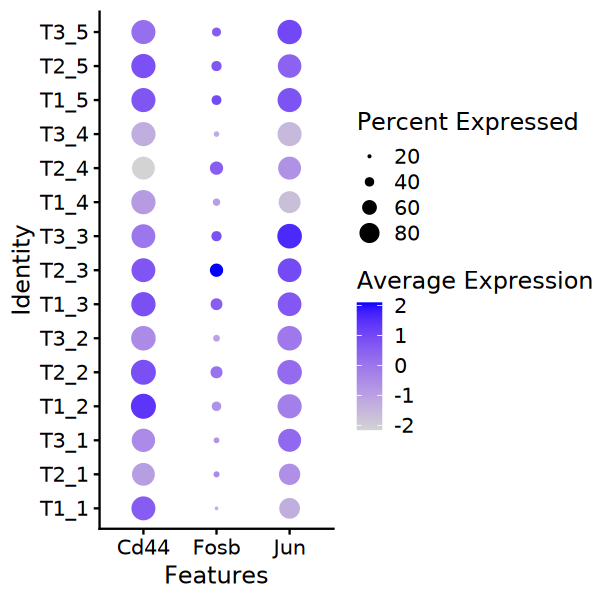

In [8]:
options(repr.plot.width = 5, repr.plot.height = 5)
DotPlot(object = sc.all.merge, features = c('Cd44','Fosb','Jun'),group.by = 'time_cluster')

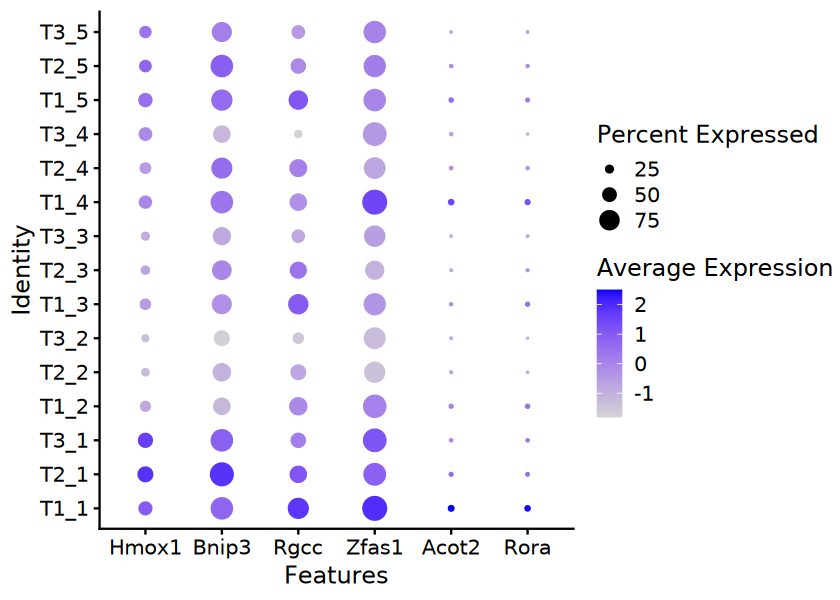

In [8]:
options(repr.plot.width = 7, repr.plot.height = 5)
DotPlot(object = sc.all.merge, features = c('Hmox1','Bnip3','Rgcc','Zfas1','Acot2','Rora'),group.by = 'time_cluster')

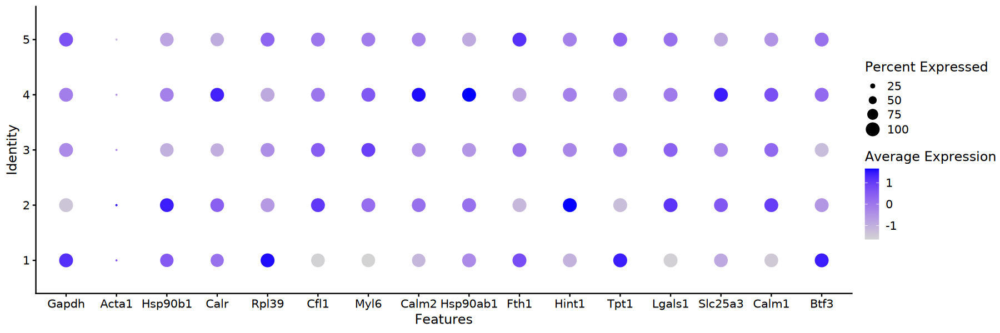

In [10]:
options(repr.plot.width = 15, repr.plot.height = 5)
DotPlot(object = sc.all.merge, features = c('Gapdh','Acta1','Hsp90b1','Calr','Rpl39','Cfl1','Myl6','Calm2','Hsp90ab1','Fth1','Hint1','Tpt1','Lgals1','Slc25a3','Calm1','Btf3'),group.by = 'seurat_clusters_rename')

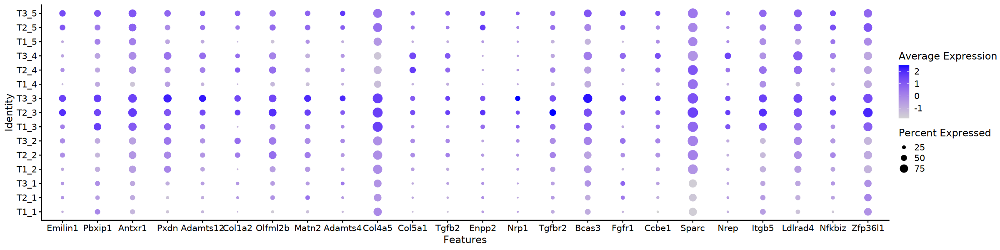

In [13]:
options(repr.plot.width = 20, repr.plot.height = 5)
DotPlot(object = sc.all.merge, features = c('Emilin1','Pbxip1','Antxr1','Pxdn','Adamts12','Col1a2','Olfml2b','Matn2','Adamts4','Col4a5','Col5a1','Tgfb2','Enpp2','Nrp1','Tgfbr2','Bcas3','Fgfr1','Ccbe1','Sparc','Nrep','Itgb5','Ldlrad4','Nfkbiz','Zfp36l1'),group.by = 'time_cluster')

Warning message:
“The following requested variables were not found: Gaa ”


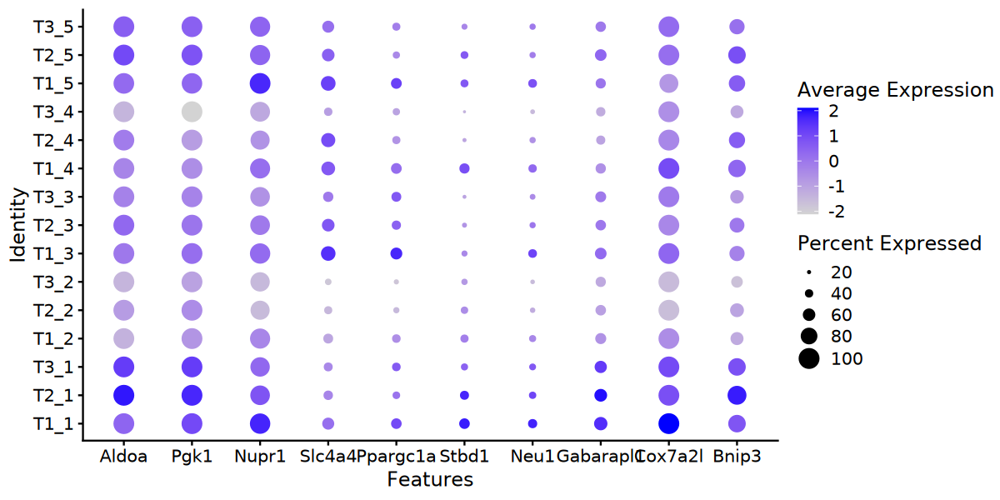

In [10]:
options(repr.plot.width = 10, repr.plot.height = 5)
DotPlot(object = sc.all.merge, features = c('Aldoa','Pgk1','Nupr1','Slc4a4','Ppargc1a','Stbd1','Neu1','Gabarapl1','Gaa ','Cox7a2l','Bnip3'),group.by = 'time_cluster')

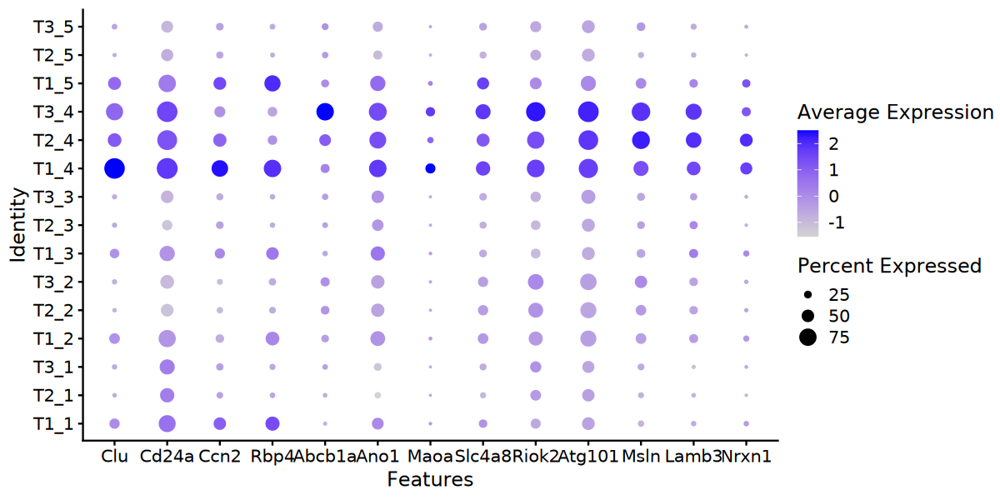

In [15]:
options(repr.plot.width = 10, repr.plot.height = 5)
DotPlot(object = sc.all.merge, features = c('Clu','Cd24a','Ccn2', 'Rbp4','Abcb1a','Ano1', 'Maoa','Slc4a8', 'Riok2','Atg101', 'Msln','Lamb3','Nrxn1'),group.by = 'time_cluster')

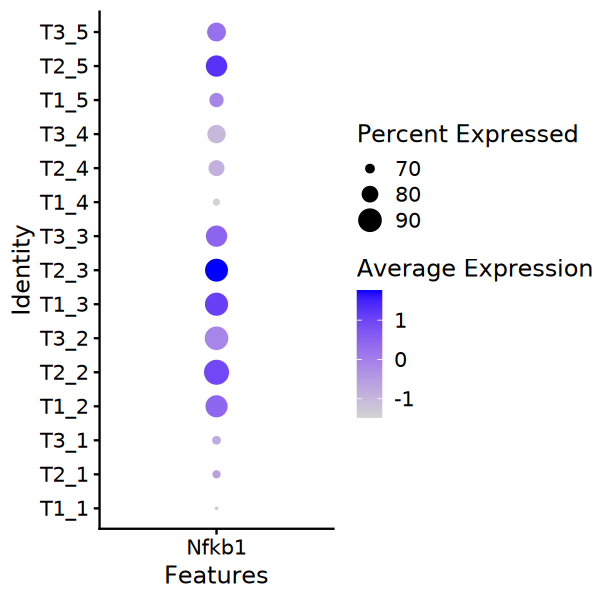

In [411]:
options(repr.plot.width = 5, repr.plot.height = 5)
DotPlot(object = sc.all.merge, features = c('Nfkb1'),group.by = 'time_cluster')

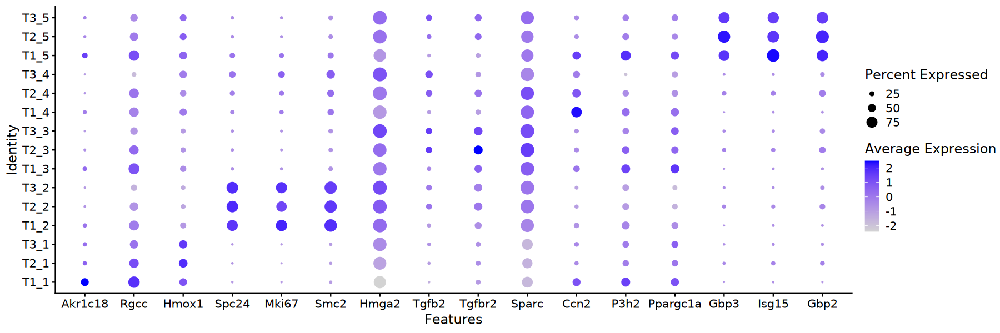

In [479]:
options(repr.plot.width = 15, repr.plot.height = 5)
DotPlot(object = sc.all.merge, features = c('Akr1c18','Rgcc','Hmox1','Spc24','Mki67','Smc2','Hmga2','Tgfb2','Tgfbr2','Sparc','Ccn2','P3h2','Ppargc1a','Gbp3','Isg15','Gbp2'),group.by = 'time_cluster')

In [205]:
Mm.gmt <- read.gmt('/syn1/liangzhen/GO_database/m5.all.v2024.1.Mm.symbols.gmt')
Mm.gmt

term,gene
<fct>,<chr>
GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,Aasdhppt
GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,Aldh1l1
GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,Aldh1l2
GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,Mthfd1
GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,Mthfd1l
GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,Mthfd2l
GOBP_2FE_2S_CLUSTER_ASSEMBLY,Fdx2
GOBP_2FE_2S_CLUSTER_ASSEMBLY,Fxn
GOBP_2FE_2S_CLUSTER_ASSEMBLY,Glrx3


In [206]:
grep('PRESENTATION',Mm.gmt$term,value = T)

[1] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
  [2] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
  [3] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
  [4] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
  [5] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
  [6] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
  [7] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
  [8] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
  [9] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [10] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [11] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [12] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [13] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [14] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [15] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [16] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [17] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [18] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [19] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [20] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [21] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [22] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [23] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [24] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [25] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [26] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [27] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [28] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [29] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [30] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [31] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [32] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [33] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [34] "GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION"                                                                    
 [35] "GOBP_ANTIGEN_PROC

In [210]:
Mm.gmt[Mm.gmt$term=='GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION','gene']

[1] "2410137M14Rik" "Ap3b1"         "Ap3d1"         "Arl8b"        
  [5] "Atg5"          "B2m"           "Bag6"          "Calr"         
  [9] "Ccl19"         "Ccl21a"        "Ccr7"          "Cd1d1"        
 [13] "Cd1d2"         "Cd68"          "Cd74"          "Clec4b2"      
 [17] "Ctse"          "Ctsl"          "Ctss"          "Ext1"         
 [21] "Fcer1g"        "Fcer2a"        "Fcgr1"         "Fcgr2b"       
 [25] "Fcgr3"         "Fcgr4"         "Fgl2"          "Flt3"         
 [29] "Gba1"          "H2-Aa"         "H2-Ab1"        "H2-Bl"        
 [33] "H2-D1"         "H2-DMa"        "H2-DMb1"       "H2-DMb2"      
 [37] "H2-Ea"         "H2-Eb1"        "H2-Eb2"        "H2-K1"        
 [41] "H2-M1"         "H2-M10.1"      "H2-M10.2"      "H2-M10.3"     
 [45] "H2-M10.4"      "H2-M10.5"      "H2-M10.6"      "H2-M11"       
 [49] "H2-M2"         "H2-M3"         "H2-M5"         "H2-M9"        
 [53] "H2-Oa"         "H2-Ob"         "H2-Q1"         "H2-Q10"       
 [57] "H2-Q2"         "H2-Q4"         "H2-Q6"         "H2-Q7"        
 [61] "H2-T10"        "H2-T22"        "H2-T23"        "H2-T24"       
 [65] "H2-T26"        "H2-T27"        "H2-T3"         "H60b"         
 [69] "H60c"          "Hfe"           "Icam1"         "Ide"          
 [73] "Ifi30"         "Ifng"          "Ighe"          "Ighm"         
 [77] "Iglc4"         "Kdm5d"         "Lgmn"          "Marchf1"      
 [81] "Marchf8"       "Mfsd6"         "Mill1"         "Mill2"        
 [85] "Mpeg1"         "Mr1"           "Nod1"          "Nod2"         
 [89] "Pdia3"         "Pikfyve"       "Psap"          "Psmb8"        
 [93] "Psmb9"         "Psme1"         "Psme2"         "Ptpn22"       
 [97] "Pycard"        "Rab10"         "Rab27a"        "Rab32"        
[101] "Rab33a"        "Rab34"         "Rab35"         "Rab3b"        
[105] "Rab3c"         "Rab4a"         "Rab5b"         "Rab6a"        
[109] "Rab8b"         "Raet1d"        "Raet1e"        "Relb"         
[113] "Rftn1"         "Slc11a1"       "Tap1"          "Tap2"         
[117] "Tapbp"         "Tapbpl"        "Thbs1"         "Traf6"        
[121] "Trem2"         "Treml4"        "Trex1"         "Ulbp1"        
[125] "Unc93b1"       "Was"           "Washc1"        "Wdfy4"        
[129] "Ythdf1"

In [212]:
sc.all.merge <- AddModuleScore(
  object = sc.all.merge,
  features = list(Mm.gmt[Mm.gmt$term=='GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION','gene']),
  name = 'GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION'
) 

Warning message:
“The following features are not present in the object: Cd1d2, Gba1, H2-Bl, H2-Ea, H2-T10, H2-T26, H2-T27, Marchf1, Marchf8, not searching for symbol synonyms”


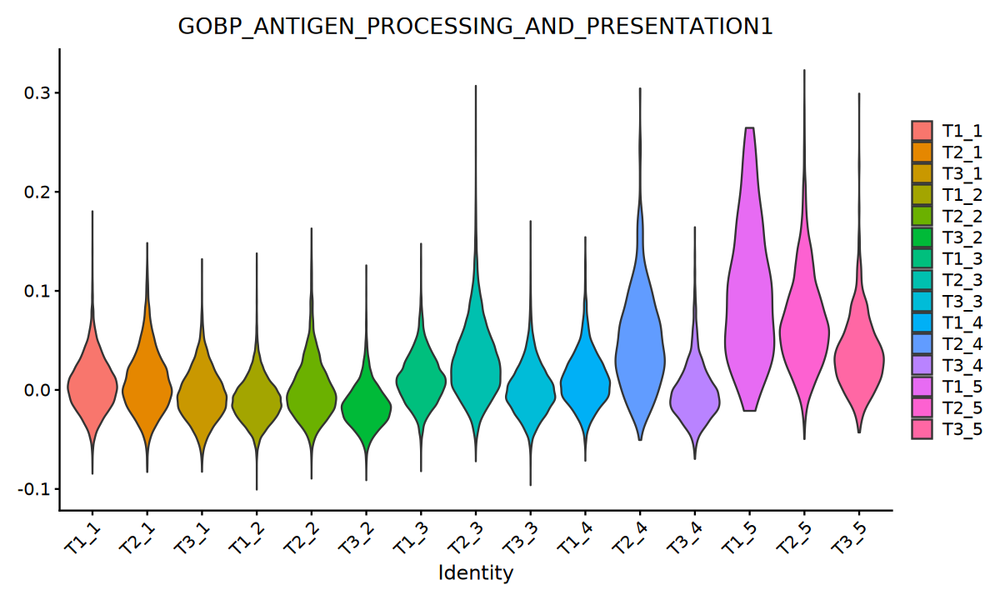

In [213]:
options(repr.plot.width = 10, repr.plot.height = 6)
VlnPlot(sc.all.merge,features = 'GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION1',group.by = 'time_cluster',pt.size=0)

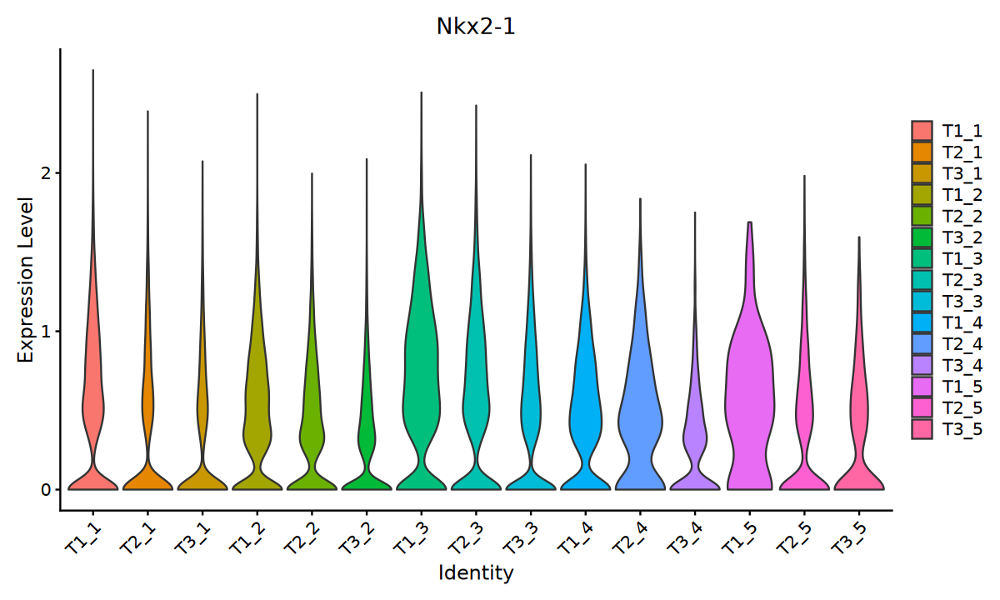

In [431]:
options(repr.plot.width = 10, repr.plot.height = 6)
VlnPlot(sc.all.merge,features = 'Nkx2-1',group.by = 'time_cluster',pt.size=0)

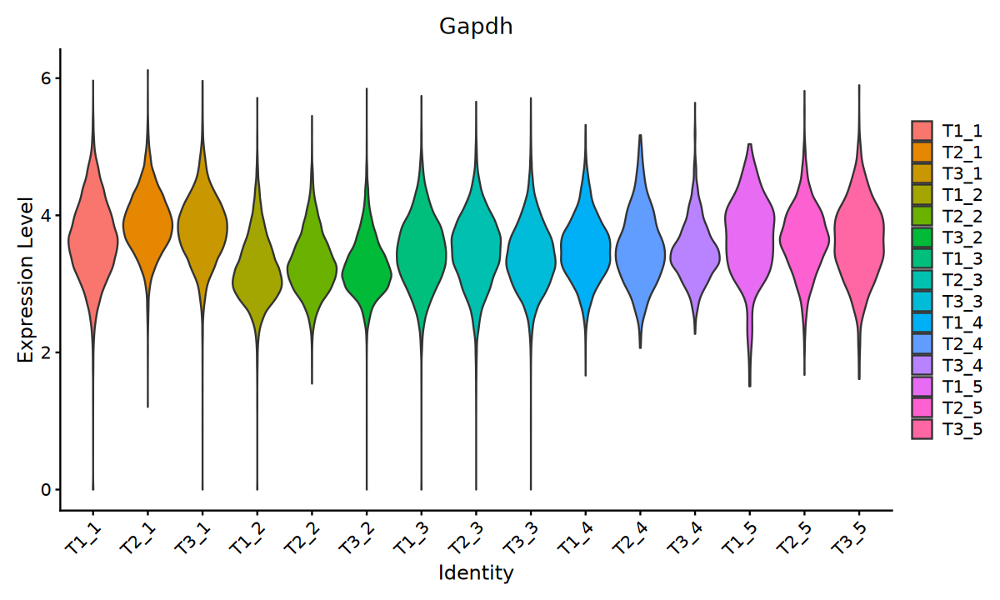

In [464]:
options(repr.plot.width = 10, repr.plot.height = 6)
VlnPlot(sc.all.merge,features = 'Gapdh',group.by = 'time_cluster',pt.size=0)

In [433]:
options(repr.plot.width = 10, repr.plot.height = 6)
VlnPlot(sc.all.merge,features = 'GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION1',group.by = 'seurat_clusters_rename',pt.size=0)

ERROR: [1m[33mError[39m in `FetchData()`:[22m
[33m![39m None of the requested variables were found: GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION1


In [294]:
top100 <- read.table('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2.sup/cluster_DEGs_top100.csv',sep=',',header=T)
top100

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>
1,0,4.275370,0.897,0.129,0,2,Pclaf
2,0,3.757732,0.773,0.103,0,2,Spc24
3,0,3.679177,0.855,0.185,0,2,Tk1
4,0,4.155450,0.729,0.062,0,2,Ccna2
5,0,4.063172,0.747,0.081,0,2,Mki67
6,0,3.109348,0.862,0.198,0,2,Smc2
7,0,3.921812,0.812,0.155,0,2,Ube2c
8,0,3.268513,0.792,0.142,0,2,Cdca8
9,0,2.861734,0.822,0.173,0,2,Racgap1


In [297]:
top100[top100$cluster=='3' & top100$gene== 'Tgfb2',]

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>
263,0,1.483485,0.326,0.192,0,3,Tgfb2


In [300]:
top100[top100$cluster=='3' & top100$pct.1 > 0.5,]

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>
172,0,1.931435,0.544,0.234,0,3,Emilin1
173,0,1.739913,0.867,0.597,0,3,Col6a1
175,0,1.416856,0.802,0.542,0,3,Mxra8
176,0,1.497322,0.750,0.492,0,3,Ptpn13
178,0,1.435814,0.519,0.276,0,3,Mxd4
179,0,1.212658,0.641,0.398,0,3,Tmem150a
181,0,1.263983,0.652,0.413,0,3,Pbxip1
183,0,1.302179,0.775,0.541,0,3,Antxr1
184,0,1.365297,0.747,0.513,0,3,Pdlim2


# annotation cluster4

In [32]:
library(Seurat)

In [33]:
sc.all.merge <- readRDS('/syn1/liangzhen/jinhua_jilab_project/result/scRNA/cellranger/sc.all.merge.T1T2T3a.harmony.final.refine.rds')

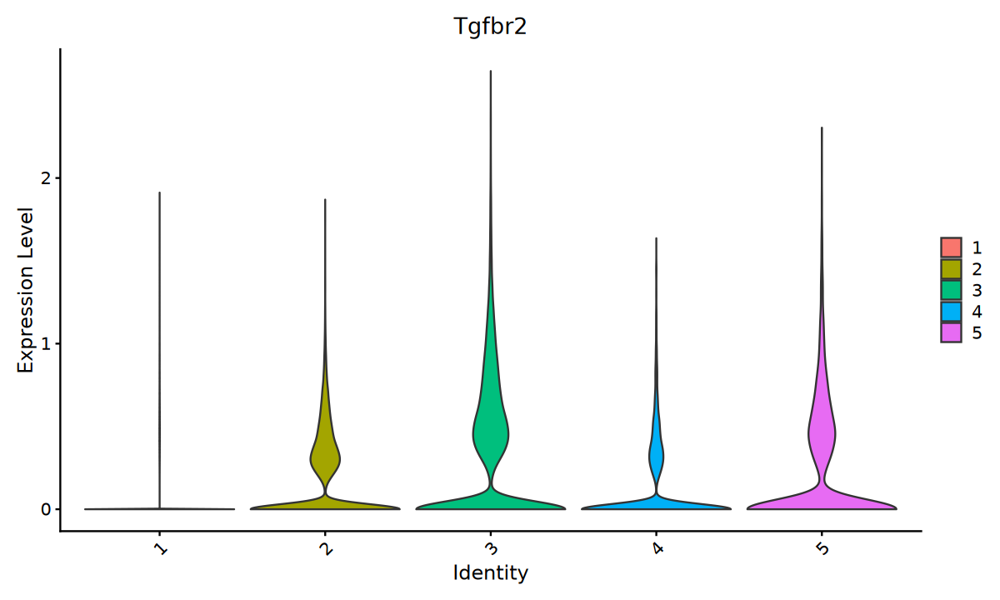

In [34]:
options(repr.plot.width = 10, repr.plot.height = 6)
VlnPlot(sc.all.merge,features = 'Tgfbr2',group.by = 'seurat_clusters_rename',pt.size=0)

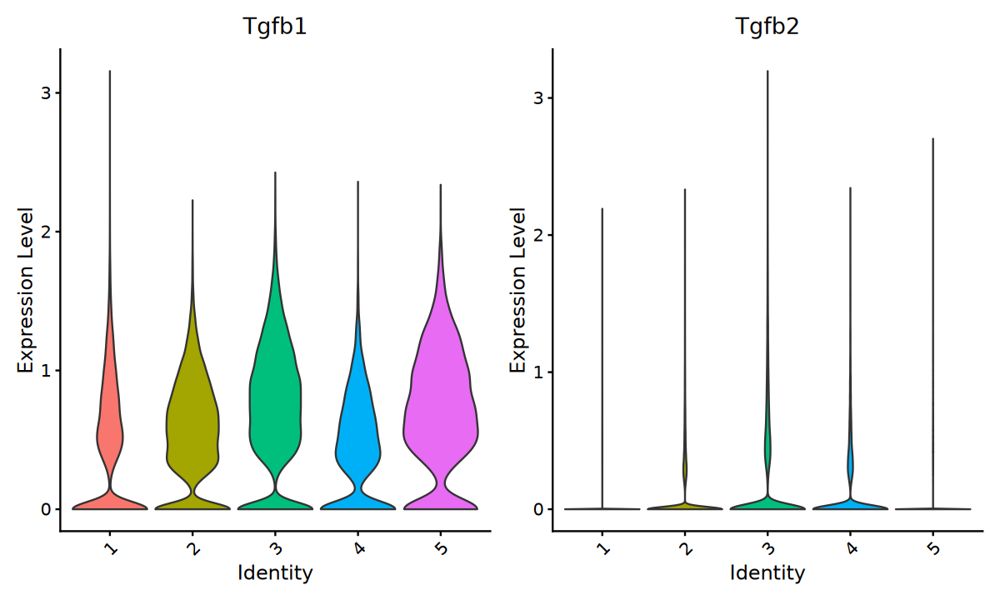

In [12]:
options(repr.plot.width = 10, repr.plot.height = 6)
VlnPlot(sc.all.merge,features = c('Tgfb1','Tgfb2'),group.by = 'seurat_clusters_rename',pt.size=0)

In [13]:
grep('H2-',rownames(sc.all.merge),value = T)

[1] "H2-K1"    "H2-Ke6"   "H2-Oa"    "H2-DMa"   "H2-DMb2"  "H2-DMb1" 
 [7] "H2-Ab1"   "H2-Aa"    "H2-Eb1"   "H2-D1"    "H2-Q4"    "H2-T24"  
[13] "H2-T23"   "H2-T22"   "H2-M5"    "H2-M3"    "H2-Q7"    "H2-Q10"  
[19] "H2-Ob"    "H2-Eb2"   "H2-Q1"    "H2-Q2"    "H2-Q6"    "H2-T3"   
[25] "H2-M10.2" "H2-M10.1" "H2-M10.3" "H2-M10.4" "H2-M11"   "H2-M9"   
[31] "H2-M1"    "H2-M10.5" "H2-M10.6" "H2-M2"

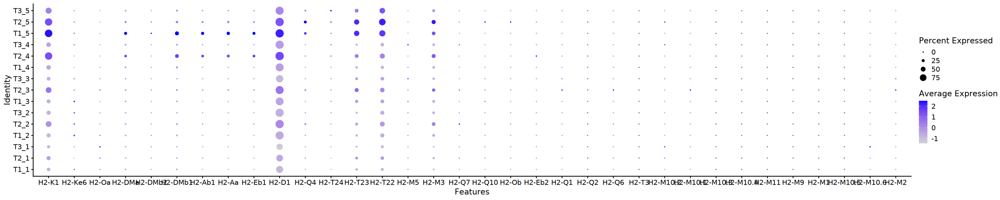

In [18]:
options(repr.plot.width = 25, repr.plot.height = 5)
DotPlot(object = sc.all.merge, features = grep('H2-',rownames(sc.all.merge),value = T),group.by = 'time_cluster')

Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of H2-Q2.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of H2-T3.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of H2-M10.3.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of H2-M10.4.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of H2-M11.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of H2-M9.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of H2-M1.”
Warning message in S

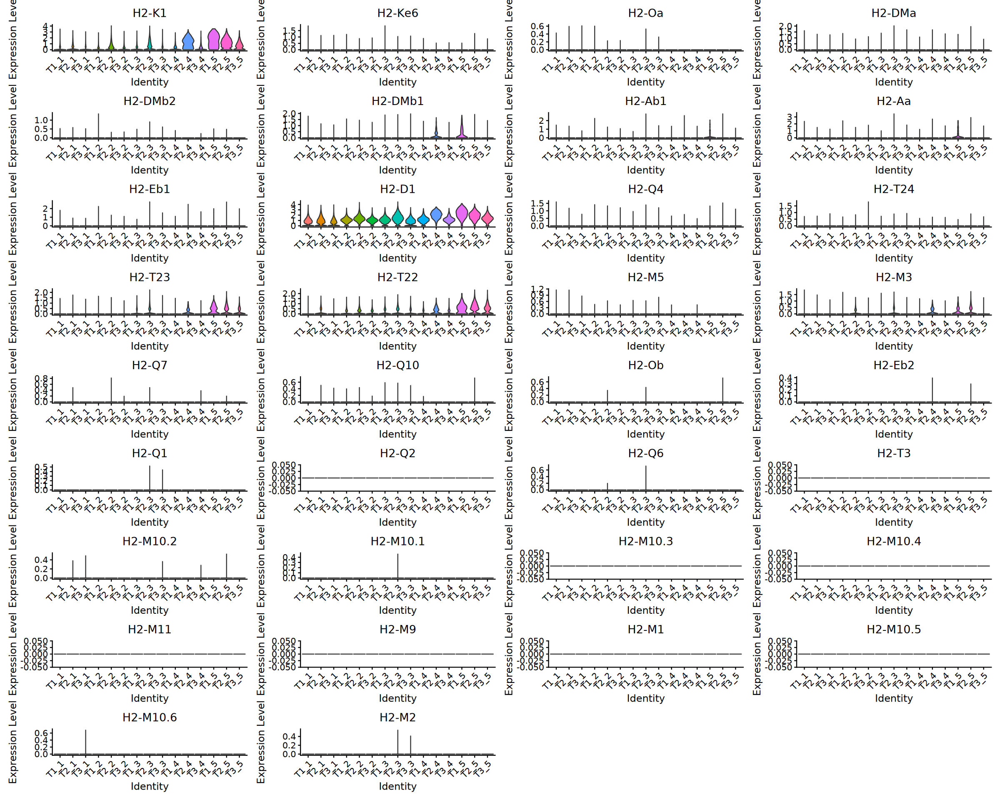

In [14]:
options(repr.plot.width = 20, repr.plot.height = 16)
VlnPlot(sc.all.merge,features = grep('H2-',rownames(sc.all.merge),value = T),group.by = 'time_cluster',pt.size=0)

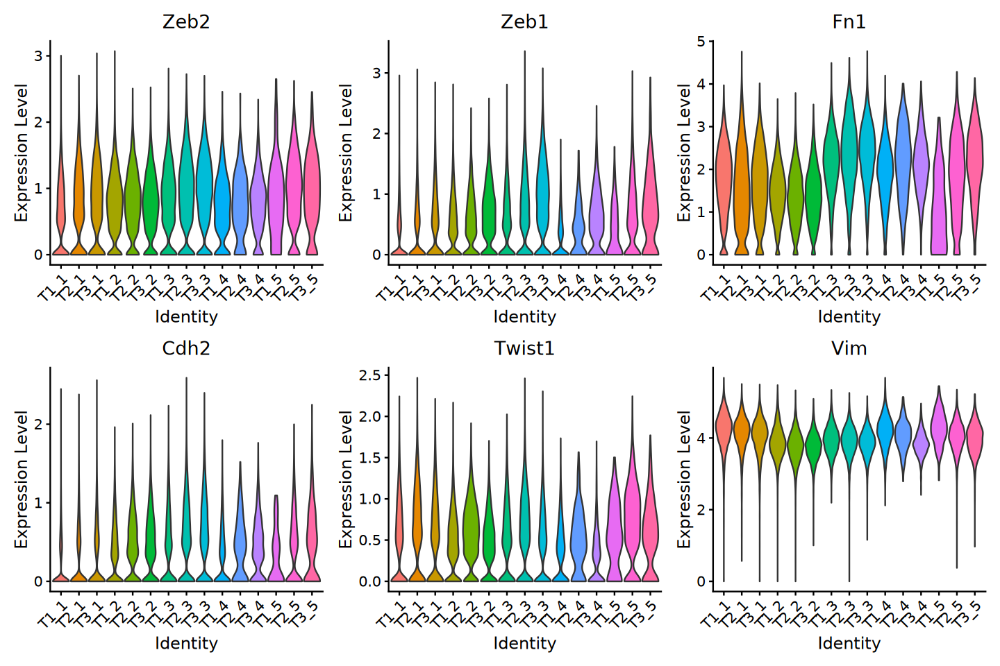

In [7]:
options(repr.plot.width = 12, repr.plot.height = 8)
VlnPlot(sc.all.merge,features = c('Zeb2','Zeb1','Fn1','Cdh2','Twist1','Vim'),group.by = 'time_cluster',pt.size=0)

In [35]:
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO301','orig.ident'] <- 'T2_a3026_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO302','orig.ident'] <- 'T2_a3026_2'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO303','orig.ident'] <- 'T2_a3028_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO304','orig.ident'] <- 'T2_a3028_2'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO305','orig.ident'] <- 'T2_a3030_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO306','orig.ident'] <- 'T2_a3030_2'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO301','orig.ident'] <- 'T3_a3026_1_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO307','orig.ident'] <- 'T3_a3026_2_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO303','orig.ident'] <- 'T3_a3028_1_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO304','orig.ident'] <- 'T3_a3028_2_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO305','orig.ident'] <- 'T3_a3030_1_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO306','orig.ident'] <- 'T3_a3030_2_1'


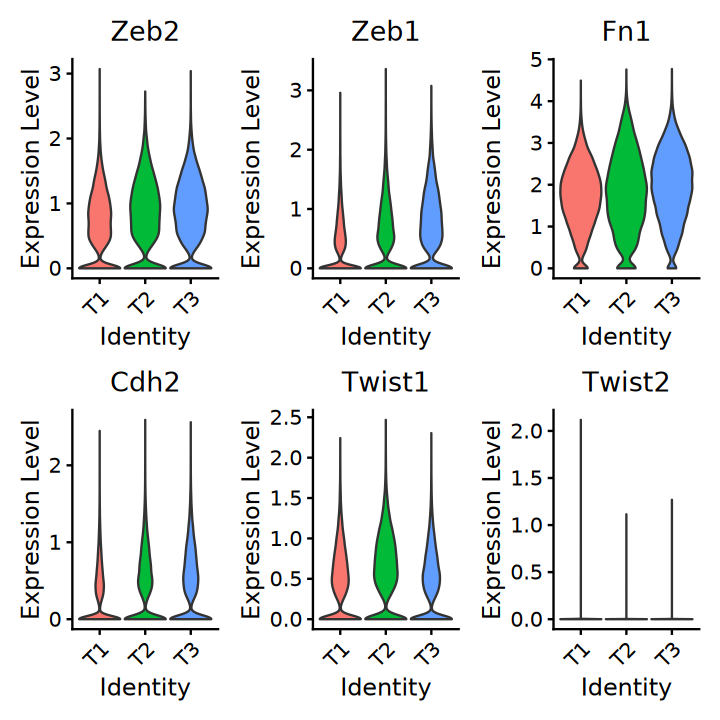

In [170]:
VlnPlot(sc.all.merge,features = c('Zeb2','Zeb1','Fn1','Cdh2','Twist1','Vim'),group.by = 'time',pt.size=0)

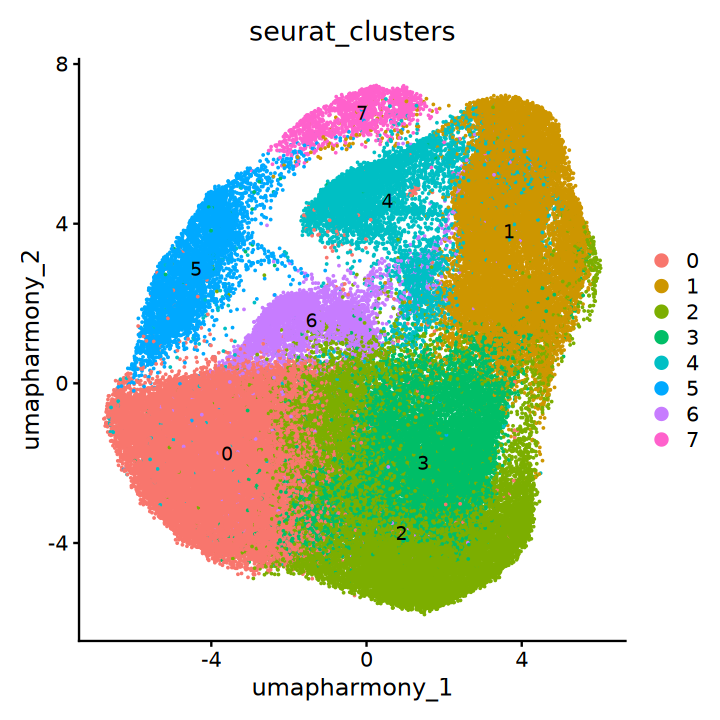

In [108]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(sc.all.merge, reduction = "umap.harmony",group.by = 'seurat_clusters',raster=FALSE,label = T)

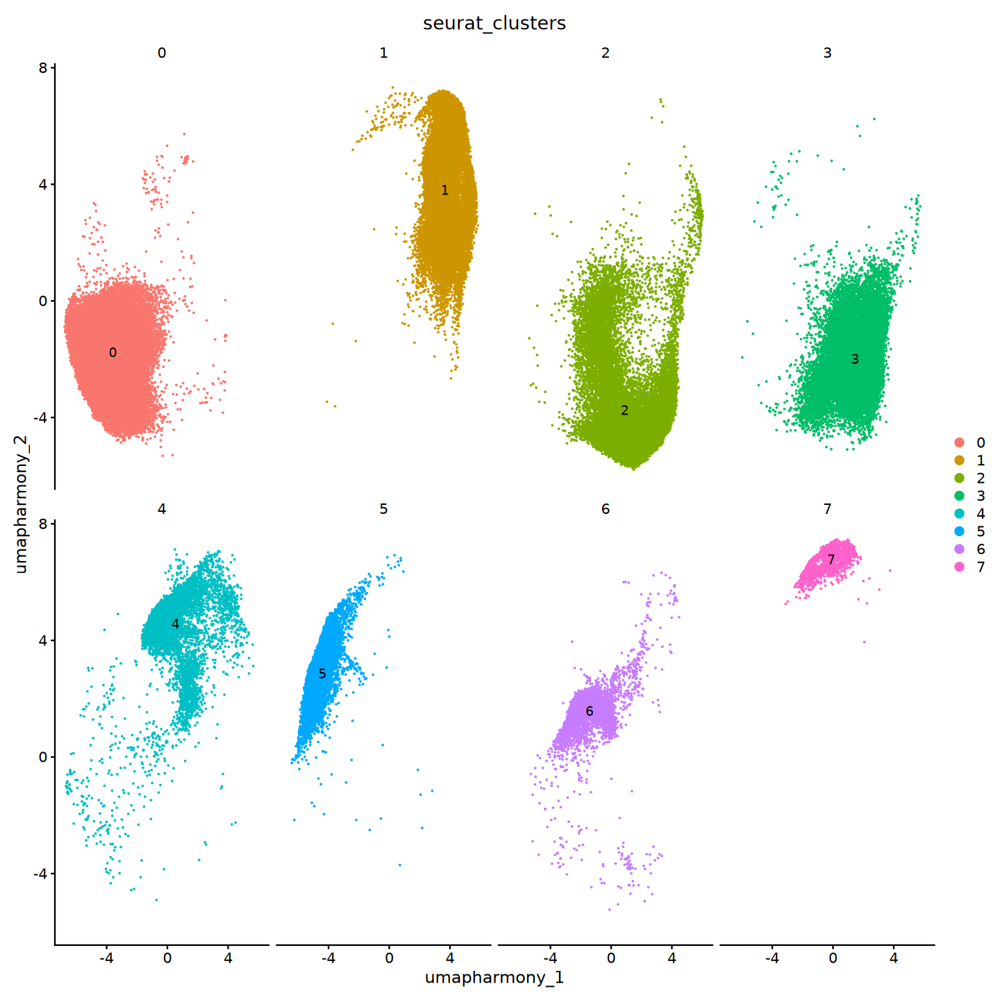

In [110]:
options(repr.plot.width = 12, repr.plot.height = 12)
DimPlot(sc.all.merge, reduction = "umap.harmony",group.by = 'seurat_clusters',raster=FALSE,label = T,split.by = 'seurat_clusters',ncol=4)

In [63]:
sc.all.merge@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.2,seurat_clusters,pANN_0.25_0.12_592,Doublet_or_Singlet,pANN_0.25_0.21_600,pANN_0.25_0.19_742,⋯,pANN_0.25_0.17_630,pANN_0.25_0.29_759,pANN_0.25_0.28_612,pANN_0.25_0.14_771,pANN_0.25_0.07_798,RNA_snn_res.0.3,harmony_clusters,seurat_clusters_rename,umapharmony_1,umapharmony_2
,<chr>,<dbl>,<int>,<dbl>,<chr>,<fct>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<chr>,<dbl>,<dbl>
T1_T1_a3026_AAACCCAAGACTAGAT-1,T1_a3026,23101,4348,5.6534349,1,1,0.31401210,Singlet,NA,NA,⋯,NA,NA,NA,NA,NA,1,1,2,3.9604470,5.4197859
T1_T1_a3026_AAACCCACATGAGATA-1,T1_a3026,13159,3546,2.0290296,0,2,0.35635081,Singlet,NA,NA,⋯,NA,NA,NA,NA,NA,0,2,1,-4.3216055,-2.7615321
T1_T1_a3026_AAACCCAGTCGCTGCA-1,T1_a3026,15441,3362,5.9840684,0,2,0.25604839,Singlet,NA,NA,⋯,NA,NA,NA,NA,NA,0,2,1,-2.2831264,-2.0551043
T1_T1_a3026_AAACCCAGTCTCGCGA-1,T1_a3026,87500,7440,4.8742857,0,2,0.45211694,Singlet,NA,NA,⋯,NA,NA,NA,NA,NA,0,2,1,-2.3479148,-1.7235541
T1_T1_a3026_AAACCCATCACGGGAA-1,T1_a3026,22915,3939,4.2330351,0,2,0.25000000,Singlet,NA,NA,⋯,NA,NA,NA,NA,NA,0,2,1,-2.8805269,-2.3351765
T1_T1_a3026_AAACCCATCGCTTACC-1,T1_a3026,16459,4443,1.6951212,0,2,0.35584677,Singlet,NA,NA,⋯,NA,NA,NA,NA,NA,0,2,1,-3.2611917,-3.7758344
T1_T1_a3026_AAACGAAAGATGAAGG-1,T1_a3026,41955,5372,2.9293290,0,1,0.34274194,Singlet,NA,NA,⋯,NA,NA,NA,NA,NA,5,1,2,-3.9233058,-2.5635064
T1_T1_a3026_AAACGAAAGATGGCGT-1,T1_a3026,23998,4543,3.2752729,1,1,0.32409274,Singlet,NA,NA,⋯,NA,NA,NA,NA,NA,1,1,2,2.9485046,2.2712824
T1_T1_a3026_AAACGAAAGGATACAT-1,T1_a3026,19233,3932,3.7227682,0,0,0.35181452,Singlet,NA,NA,⋯,NA,NA,NA,NA,NA,0,0,3,-1.1678324,-2.1568299


In [36]:
sc.all.merge.cluster4 <- subset(sc.all.merge,seurat_clusters_rename=='4')
sc.all.merge.cluster4

An object of class Seurat 
32285 features across 6190 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 19 layers present: counts.T1_a3026, counts.T1_a3028, counts.T1_a3030, counts.T2_a3026, counts.T2_a3028, counts.T2_a3030, counts.T3_a3026, counts.T3_a3028, counts.T3_a3030, scale.data, data.T1_a3026, data.T1_a3028, data.T1_a3030, data.T2_a3026, data.T2_a3028, data.T2_a3030, data.T3_a3026, data.T3_a3028, data.T3_a3030
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

In [37]:
sc.all.merge.cluster4

An object of class Seurat 
32285 features across 6190 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 19 layers present: counts.T1_a3026, counts.T1_a3028, counts.T1_a3030, counts.T2_a3026, counts.T2_a3028, counts.T2_a3030, counts.T3_a3026, counts.T3_a3028, counts.T3_a3030, scale.data, data.T1_a3026, data.T1_a3028, data.T1_a3030, data.T2_a3026, data.T2_a3028, data.T2_a3030, data.T3_a3026, data.T3_a3028, data.T3_a3030
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

In [38]:
sc.all.merge.cluster4 <- FindNeighbors(sc.all.merge.cluster4, dims = 1:30,reduction = "harmony")
sc.all.merge.cluster4 <- FindClusters(sc.all.merge.cluster4, resolution = 0.1)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 6190
Number of edges: 233679

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9311
Number of communities: 2
Elapsed time: 0 seconds


In [39]:
library(ggplot2)

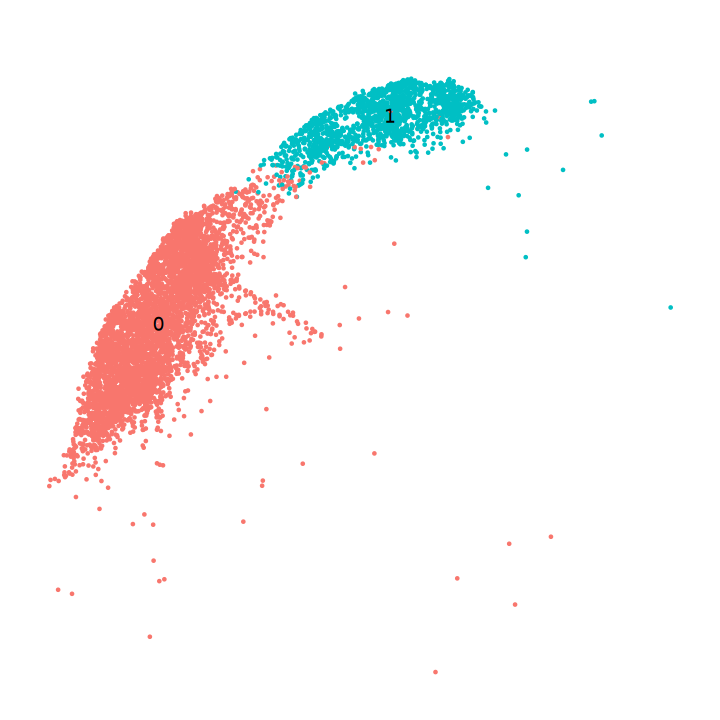

In [40]:
options(repr.plot.width = 6, repr.plot.height = 6)
plot <- DimPlot(sc.all.merge.cluster4, raster=FALSE,label = T,reduction = "umap.harmony")+ NoLegend()+ ggtitle('')+theme_bw()+
theme(panel.grid.major = element_blank(),panel.grid.minor = element_blank(),axis.ticks.length = unit(0, "pt"),
           panel.border = element_blank(),axis.text = element_blank(),axis.title = element_blank())+ theme(legend.position = 'none')
plot

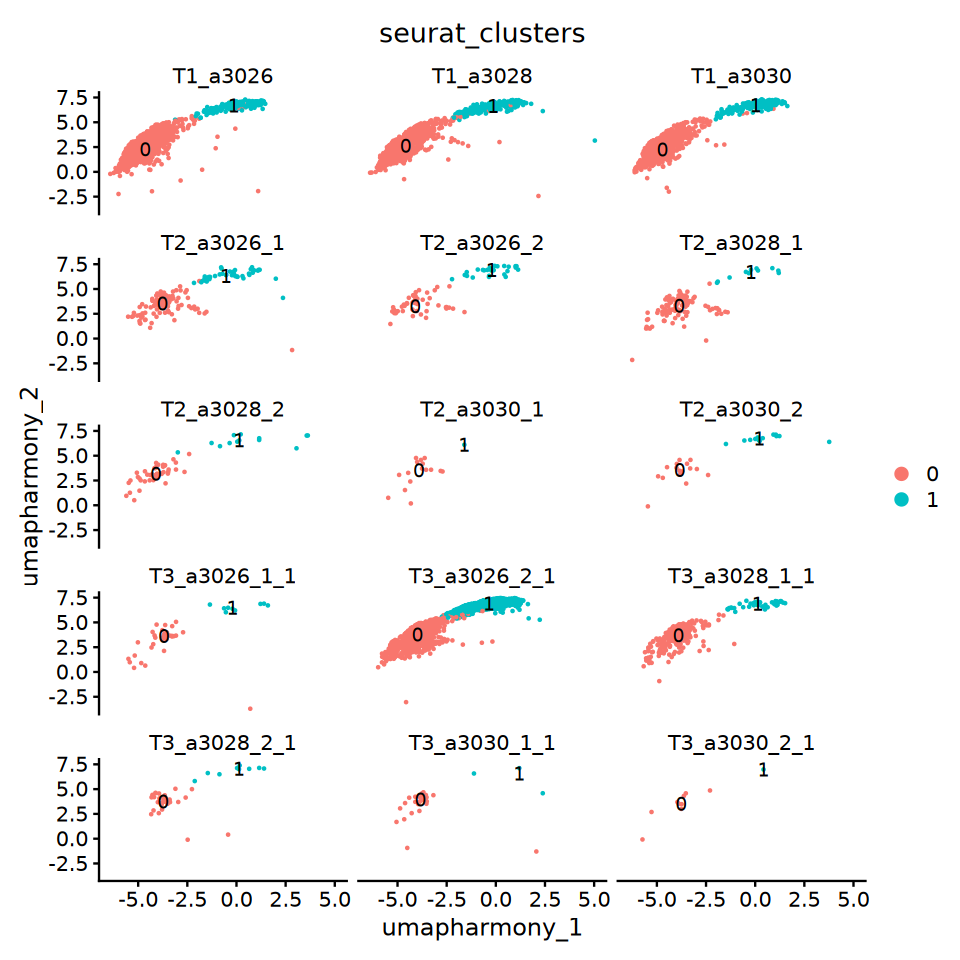

In [34]:
options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(sc.all.merge.cluster4, reduction = "umap.harmony",split.by = "orig.ident",label = T,raster=FALSE,ncol =3,group.by = c("seurat_clusters"))

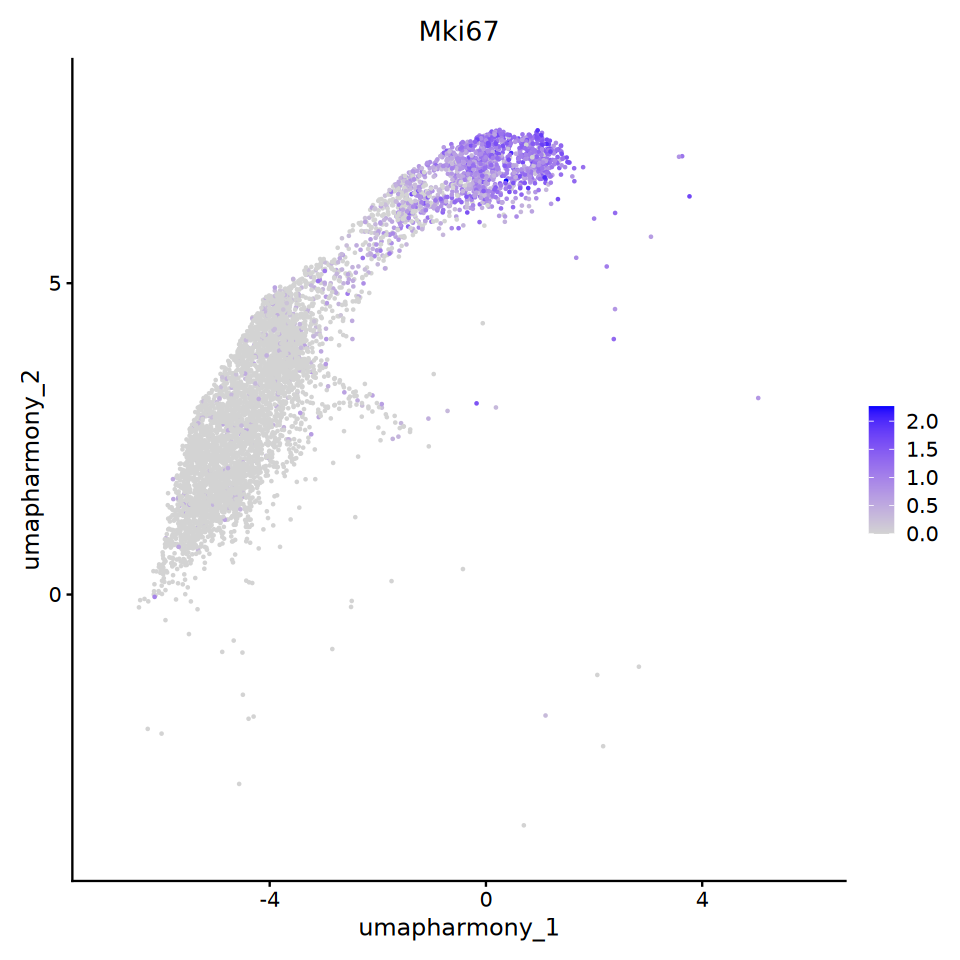

In [35]:
FeaturePlot(sc.all.merge.cluster4,reduction = "umap.harmony",features = 'Mki67')

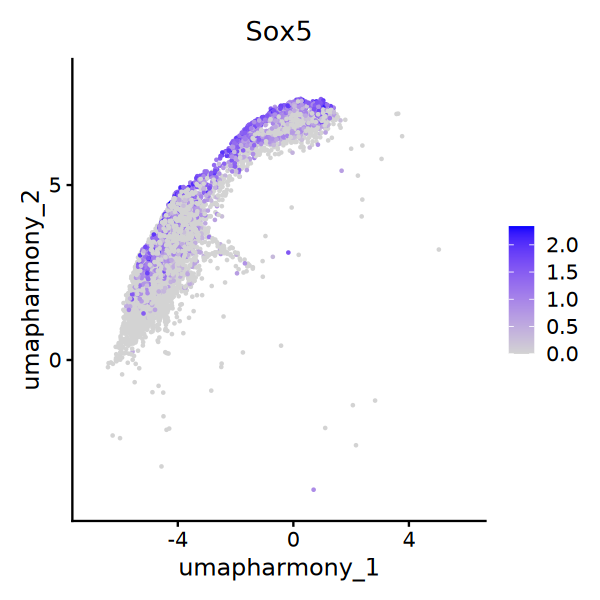

In [36]:
options(repr.plot.width = 5, repr.plot.height = 5)
FeaturePlot(sc.all.merge.cluster4,reduction = "umap.harmony",features = 'Sox5')

In [41]:
sc.all.merge.cluster4 <- JoinLayers(sc.all.merge.cluster4)

In [42]:
sc.all.merge.cluster4.markers <- FindAllMarkers(sc.all.merge.cluster4, only.pos = TRUE)

Calculating cluster 0

Calculating cluster 1



In [43]:
library(dplyr)

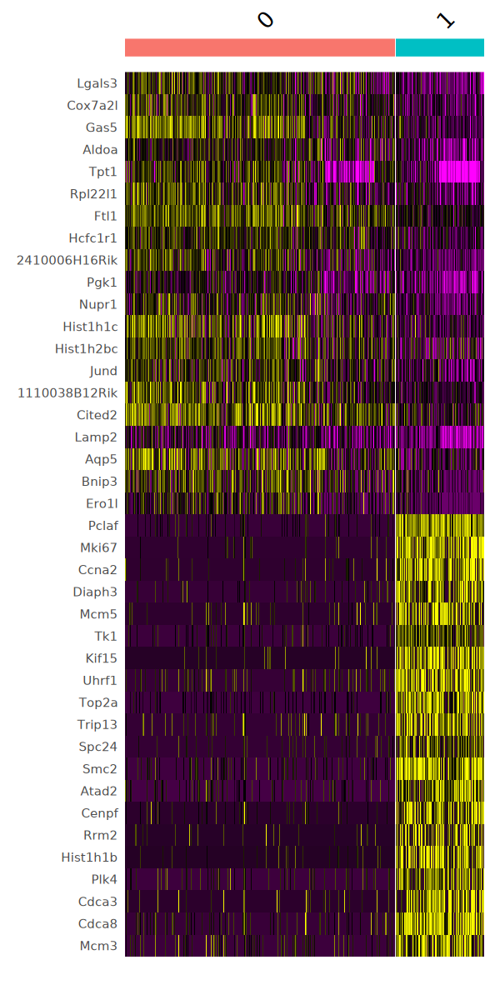

In [44]:
options(repr.plot.width = 5, repr.plot.height = 10)
sc.all.merge.cluster4.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 1) %>%
    slice_head(n = 20) %>%
    ungroup() -> top10
DoHeatmap(sc.all.merge.cluster4, features = top10$gene) + NoLegend()

In [45]:
unique(sc.all.merge.cluster4@meta.data$time)

[1] "T1" "T2" "T3"

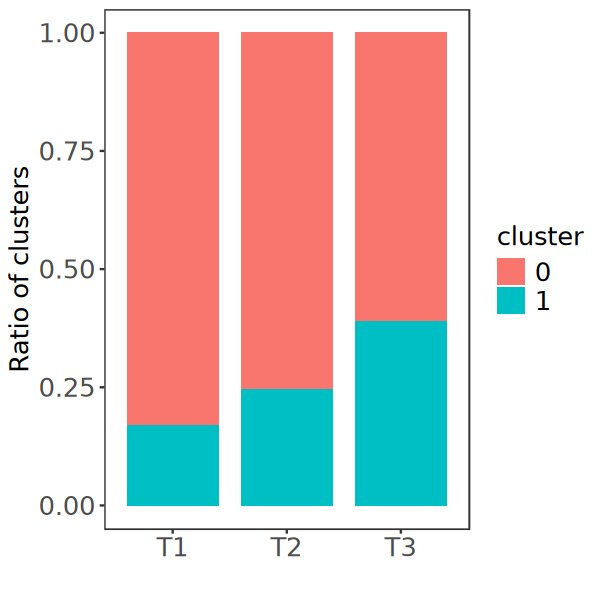

In [101]:
library(ggplot2)
options(repr.plot.width = 5, repr.plot.height = 5)
sc.all.merge.cluster4@meta.data$Num <- 1
plot <- ggplot(data=sc.all.merge.cluster4@meta.data,aes(time,Num,fill=seurat_clusters)) + geom_bar(stat="identity",position="fill",width=0.8) +
    xlab('') + ylab('Ratio of clusters')+ labs(fill='cluster')+
    theme_bw() + theme(panel.grid=element_blank(),
                  axis.text = element_text(size=15),axis.title = element_text(size=15),
                  legend.text=element_text(size=15),legend.title=element_text(size=15))
print(plot)

In [54]:
sc.all.merge.cluster4.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 1) %>%
    slice_head(n = 100) %>%
    ungroup() -> top100

In [103]:
library('clusterProfiler')
library("org.Mm.eg.db")

In [5]:
select_genes <- select(org.Mm.eg.db,
                    keys = "GO:0030198",
                    columns = c("SYMBOL"),
                    keytype = "GO")
select_genes

'select()' returned 1:many mapping between keys and columns



GO,EVIDENCE,ONTOLOGY,SYMBOL
<chr>,<chr>,<chr>,<chr>
GO:0030198,IBA,BP,Adamts1
GO:0030198,IMP,BP,Agt
GO:0030198,TAS,BP,Ambn
GO:0030198,IGI,BP,Apbb1
GO:0030198,IGI,BP,Apbb2
GO:0030198,IGI,BP,Aplp1
GO:0030198,IGI,BP,Aplp2
GO:0030198,IGI,BP,App
GO:0030198,IMP,BP,Atp7a


In [47]:
cluster.markers <- read.table('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2.sup/cluster_DEGs_top100.csv',sep=',')
cluster.markers

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>
1,0,4.275370,0.897,0.129,0,2,Pclaf
2,0,3.757732,0.773,0.103,0,2,Spc24
3,0,3.679177,0.855,0.185,0,2,Tk1
4,0,4.155450,0.729,0.062,0,2,Ccna2
5,0,4.063172,0.747,0.081,0,2,Mki67
6,0,3.109348,0.862,0.198,0,2,Smc2
7,0,3.921812,0.812,0.155,0,2,Ube2c
8,0,3.268513,0.792,0.142,0,2,Cdca8
9,0,2.861734,0.822,0.173,0,2,Racgap1


In [48]:
top100$gene[top100$cluster==0]

[1] "Lgals3"        "Cox7a2l"       "Gas5"          "Aldoa"        
  [5] "Tpt1"          "Rpl22l1"       "Ftl1"          "Hcfc1r1"      
  [9] "2410006H16Rik" "Pgk1"          "Nupr1"         "Hist1h1c"     
 [13] "Hist1h2bc"     "Jund"          "1110038B12Rik" "Cited2"       
 [17] "Lamp2"         "Aqp5"          "Bnip3"         "Ero1l"        
 [21] "Snhg12"        "Zfas1"         "Ypel5"         "Hilpda"       
 [25] "Mt1"           "Ndrg1"         "Epb41l4aos"    "P4ha1"        
 [29] "Ptpra"         "Malat1"        "Creg1"         "Lima1"        
 [33] "Ccn2"          "F11r"          "Slc4a4"        "Acot13"       
 [37] "Snhg6"         "Eif4a2"        "Sat1"          "Thbs1"        
 [41] "Snhg8"         "Ddit3"         "Rgcc"          "Dhrs3"        
 [45] "Chmp2b"        "Cebpb"         "Crebrf"        "Atp6v1b2"     
 [49] "Gadd45a"       "Igfbp7"        "Ramp1"         "Ppargc1a"     
 [53] "Dusp1"         "E030030I06Rik" "Stbd1"         "Tcn2"         
 [57] "Ankrd37"       "Ypel3"         "Col4a1"        "Clu"          
 [61] "Cdh1"          "Itgb5"         "Hmox1"         "Fam129a"      
 [65] "P3h2"          "Clic5"         "Bmp4"          "Mgst1"        
 [69] "Lmo7"          "Tpp1"          "Slc2a1"        "Ifi207"       
 [73] "Tmem150a"      "Neu1"          "Klhl30"        "Id3"          
 [77] "Dusp4"         "Mxd4"          "Ncoa4"         "Tcp11l2"      
 [81] "Pmm1"          "Mcpt1"         "Gstm1"         "Cp"           
 [85] "Amhr2"         "Gabarapl1"     "Maff"          "Mmp13"        
 [89] "Jup"           "Gaa"           "AU021092"      "Vldlr"        
 [93] "Snhg20"        "Uap1l1"        "Dbp"           "Ctsh"         
 [97] "Klf4"          "Akr1c18"       "Clybl"         "Serpinb1a"

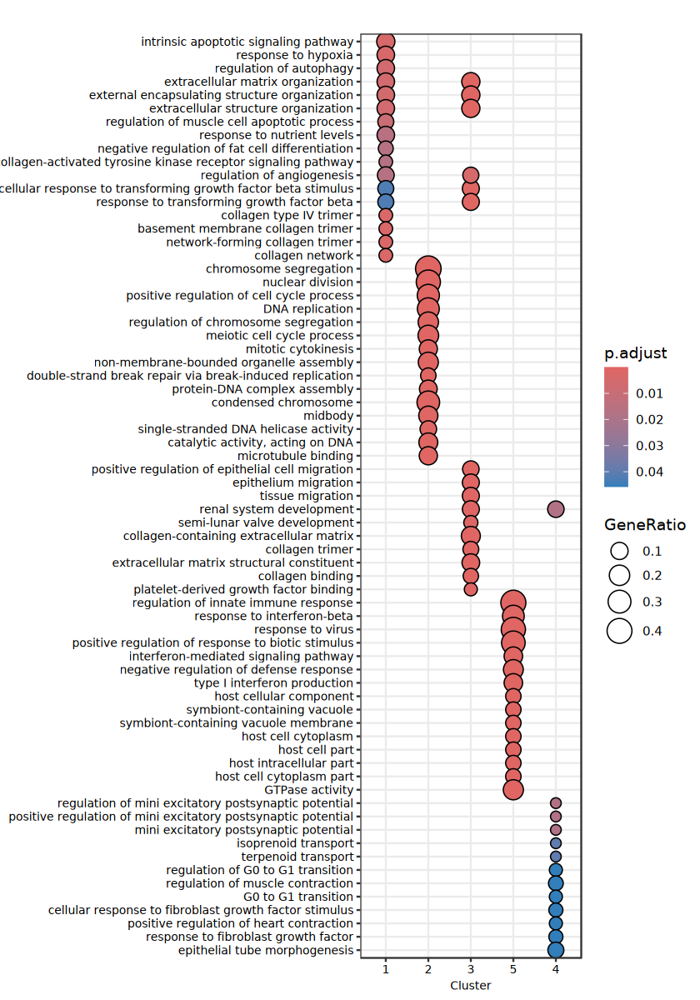

In [58]:
enrich_gene_list_for_test <- list("1"=cluster.markers$gene[cluster.markers$cluster==1],"2"=cluster.markers$gene[cluster.markers$cluster==2],
                                  "3"=cluster.markers$gene[cluster.markers$cluster==3],"5"=cluster.markers$gene[cluster.markers$cluster==5],
                                  "4"=cluster.markers$gene[cluster.markers$cluster==4]
                                )

compare_enrich <- compareCluster(geneCluster = enrich_gene_list_for_test,
                              keyType = 'SYMBOL',
                                   ont = "ALL",
                                   OrgDb = 'org.Mm.eg.db',
                                   pAdjustMethod = "BH",
                                    minGSSize = 2,
                                   fun =  enrichGO)
compare_enrich <- simplify(compare_enrich,cutoff=0.6)
options(repr.plot.width = 7, repr.plot.height = 10)
plot <- dotplot(compare_enrich,label_format = 100 ,showCategory=15, font.size=8)
print(plot)

In [57]:
df <- data.frame('state' = c(rep('state 1',length(cluster.markers$gene[cluster.markers$cluster==1])),
                            rep('state 2',length(cluster.markers$gene[cluster.markers$cluster==2])),
                            rep('state 3',length(cluster.markers$gene[cluster.markers$cluster==3])),
                            rep('state 4',length(top100$gene[top100$cluster==0])), 
                            rep('state 5',length(cluster.markers$gene[cluster.markers$cluster==5]))
                            ),
                 'genes' = c(cluster.markers$gene[cluster.markers$cluster==1],
                            cluster.markers$gene[cluster.markers$cluster==2],
                             cluster.markers$gene[cluster.markers$cluster==3],
                             top100$gene[top100$cluster==0],
                             cluster.markers$gene[cluster.markers$cluster==5]
                            )
                            )
df

state,genes
<chr>,<chr>
state 1,Ddit3
state 1,4930447F24Rik
state 1,Ero1l
state 1,Akr1c18
state 1,Snhg12
state 1,Epb41l4aos
state 1,Mmp13
state 1,Hmox1
state 1,F3


In [58]:
table(df$state)


state 1 state 2 state 3 state 4 state 5 
     71     100     100     100     100 

In [59]:
write.table(df,file='/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2.sup/top100_state-markers_seleced.csv',sep=',',quote=F,row.names=F,col.names=T)

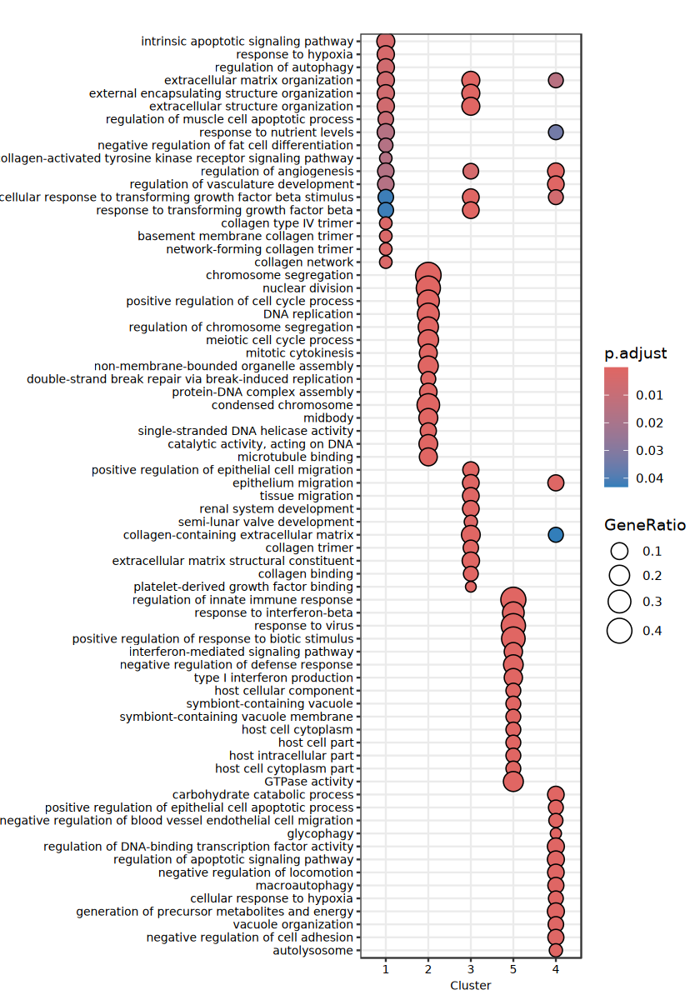

In [107]:
enrich_gene_list_for_test <- list("1"=cluster.markers$gene[cluster.markers$cluster==1],"2"=cluster.markers$gene[cluster.markers$cluster==2],
                                  "3"=cluster.markers$gene[cluster.markers$cluster==3],"5"=cluster.markers$gene[cluster.markers$cluster==5],
                                  "4"=top100$gene[top100$cluster==0]
                                )

compare_enrich <- compareCluster(geneCluster = enrich_gene_list_for_test,
                              keyType = 'SYMBOL',
                                   ont = "ALL",
                                   OrgDb = 'org.Mm.eg.db',
                                   pAdjustMethod = "BH",
                                    minGSSize = 3,
                                   fun =  enrichGO)
compare_enrich <- simplify(compare_enrich,cutoff=0.6)
options(repr.plot.width = 7, repr.plot.height = 10)
#pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2.sup/GO_plot_cluster.pdf',width = 7,height = 10)
plot <- dotplot(compare_enrich,label_format = 100 ,showCategory=15, font.size=8)
print(plot)
#dev.off()
#print(plot)

In [ ]:
write.table(compare_enrich@compareClusterResult,file='/syn1/liangzhen/jinhua_jilab_project/result/scRNA/cluster_GO.csv',sep=',',col.names = NA,quote=F)

In [153]:
compareClusterResult_selected <- compare_enrich@compareClusterResult[ compare_enrich@compareClusterResult$ID %in%c('GO:0097193',
'GO:0001666',
'GO:0010506',
'GO:0030198',
'GO:0045229',
'GO:0071560',
'GO:0007059',
'GO:0000280',
'GO:0090068',
'GO:0006260',
'GO:1905005',
'GO:1905007', 
'GO:0002053',                                                                                                                  
'GO:0051983',
'GO:0010634',
'GO:0016052',
'GO:0061723',
'GO:0051090',
'GO:2001233',
'GO:0006091',
'GO:0045088',
'GO:0035456',
'GO:0009615',
'GO:0002833',
'GO:0140888'                                                                                                                  
),]

In [154]:
compareClusterResult_selected 

,Cluster,ONTOLOGY,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>
1,1,BP,GO:0097193,intrinsic apoptotic signaling pathway,7/55,327/28891,2.842026e-06,3.752035e-03,2.568879e-03,Ddit3/Hmox1/Bnip3/Cdkn1a/Trib3/Zfas1/Nupr1,7
2,1,BP,GO:0001666,response to hypoxia,6/55,233/28891,5.375408e-06,3.752035e-03,2.568879e-03,Hmox1/Bnip3/Rgcc/Zfas1/Acot2/Rora,6
4,1,BP,GO:0010506,regulation of autophagy,6/55,300/28891,2.254309e-05,6.050915e-03,4.142837e-03,Ddit3/Hmox1/Bnip3/Trib3/Nupr1/Rragd,6
5,1,BP,GO:0030198,extracellular matrix organization,6/55,322/28891,3.349867e-05,6.050915e-03,4.142837e-03,Mmp13/Col4a1/Rgcc/Col4a2/Lgals3/Mmp3,6
6,1,BP,GO:0045229,external encapsulating structure organization,6/55,323/28891,3.408312e-05,6.050915e-03,4.142837e-03,Mmp13/Col4a1/Rgcc/Col4a2/Lgals3/Mmp3,6
41,1,BP,GO:0071560,cellular response to transforming growth factor beta stimulus,4/55,248/28891,1.282108e-03,4.218190e-02,2.888038e-02,Akr1c18/Amhr2/Col4a2/Cited1,4
113,2,BP,GO:0007059,chromosome segregation,42/96,416/28891,8.294740e-52,8.062487e-49,4.732367e-49,Spc24/Mki67/Smc2/Ube2c/Cdca8/Racgap1/Birc5/Top2a/Cdk1/Cenpf/Cenpe/Ect2/Tpx2/Prc1/Cenpm/Kif4/Ccnb1/Cenpw/Pmf1/Ccnb2/Trip13/Sgo2a/Cenpk/Cenpq/Knl1/Bub1/Cenph/Kif23/Bub1b/Tacc3/Nusap1/Kif11/Incenp/Brip1/Cenpp/Knstrn/Psmc3ip/Cdc20/Ncapg2/Cit/Mybl2/Ncapd3,42
310,2,BP,GO:0000280,nuclear division,35/96,450/28891,1.144311e-38,3.707569e-36,2.176199e-36,Spc24/Mki67/Smc2/Ube2c/Cdca8/Racgap1/Birc5/Top2a/Cdk1/Cenpe/Tpx2/Prc1/Ccnb1/Ccnb2/Trip13/Sgo2a/Cenpk/Rad51/Knl1/Bub1/Kif23/Bub1b/Nusap1/Fignl1/Kif11/Incenp/Brip1/Knstrn/Psmc3ip/Cdc20/Topbp1/Ncapg2/Cit/Mybl2/Ncapd3,35
76,2,BP,GO:0090068,positive regulation of cell cycle process,26/96,276/28891,1.043092e-30,1.448408e-28,8.501593e-29,Smc2/Ube2c/Cdca8/Racgap1/Birc5/Cdk1/Cenpe/Ect2/Plk4/Ccnb1/Kif20b/Sgo2a/Bub1/Kif23/Rrm2/Nusap1/Rrm1/Incenp/Dbf4/Fen1/Cdc20/Ncapg2/Cit/Dtl/Lmnb1/Ncapd3,26


In [155]:
#compareClusterResult_selected <- compareClusterResult_selected[!duplicated(compareClusterResult_selected$Description,keep='first'),]

In [156]:
compareClusterResult_selected$GeneRatio_numeric <- sapply(strsplit(as.character(compareClusterResult_selected$GeneRatio), "/"), function(x) {
  as.numeric(x[1]) / as.numeric(x[2])
})

In [157]:
library(ggplot2)

In [165]:
compareClusterResult_selected$Description <- factor(compareClusterResult_selected$Description,levels = rev(c(
    compareClusterResult_selected$Description[!duplicated(compareClusterResult_selected$Description,keep='first')][1:5],
    compareClusterResult_selected$Description[!duplicated(compareClusterResult_selected$Description,keep='first')][7:11],
    compareClusterResult_selected$Description[!duplicated(compareClusterResult_selected$Description,keep='first')][6],
    compareClusterResult_selected$Description[!duplicated(compareClusterResult_selected$Description,keep='first')][12:15],
    compareClusterResult_selected$Description[!duplicated(compareClusterResult_selected$Description,keep='first')][21:25],
    compareClusterResult_selected$Description[!duplicated(compareClusterResult_selected$Description,keep='first')][16:20]
)))

In [166]:
compareClusterResult_selected$Cluster <- factor(compareClusterResult_selected$Cluster,levels = c(1,2,3,4,5))

png 
  2

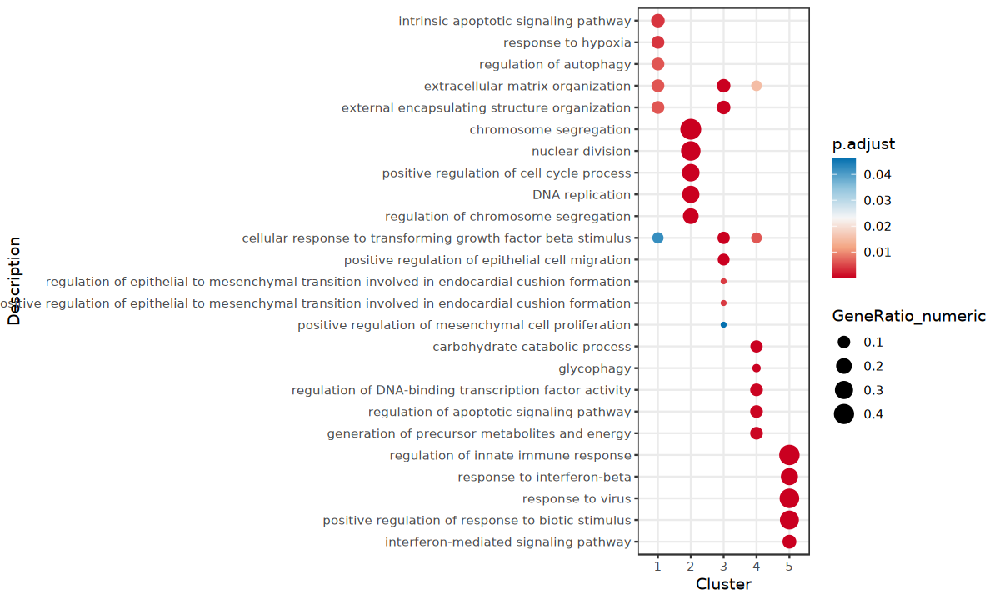

In [167]:
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2.sup/GO_plot_cluster_selected_new.pdf',width = 10,height = 6)
options(repr.plot.width = 10, repr.plot.height = 6)
plot <- ggplot(compareClusterResult_selected) + geom_point(aes(x=Cluster,y=Description,color=p.adjust,size=GeneRatio_numeric))+scale_color_gradientn(colors = rev(colorRampPalette(rev(brewer.pal(n = 5, name = "RdBu")))(100)))+theme_bw()
print(plot)
dev.off()
print(plot)

png 
  2

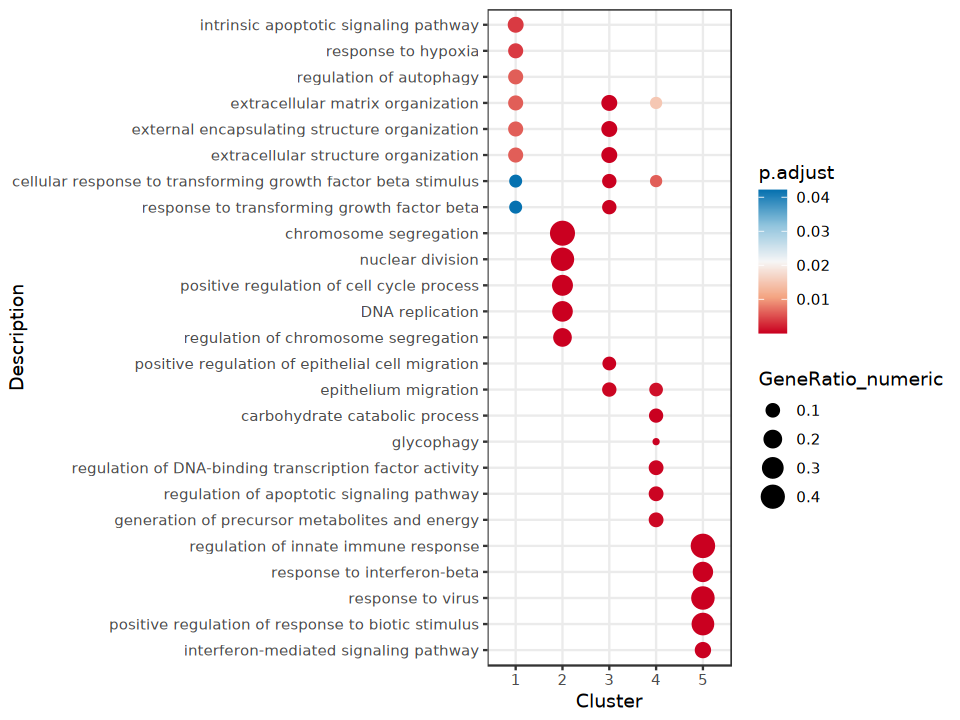

In [129]:
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2.sup/GO_plot_cluster_selected.pdf',width = 8,height = 6)
options(repr.plot.width = 8, repr.plot.height = 6)
plot <- ggplot(compareClusterResult_selected) + geom_point(aes(x=Cluster,y=Description,color=p.adjust,size=GeneRatio_numeric))+scale_color_gradientn(colors = rev(colorRampPalette(rev(brewer.pal(n = 5, name = "RdBu")))(100)))+theme_bw()
print(plot)
dev.off()
print(plot)

png 
  2

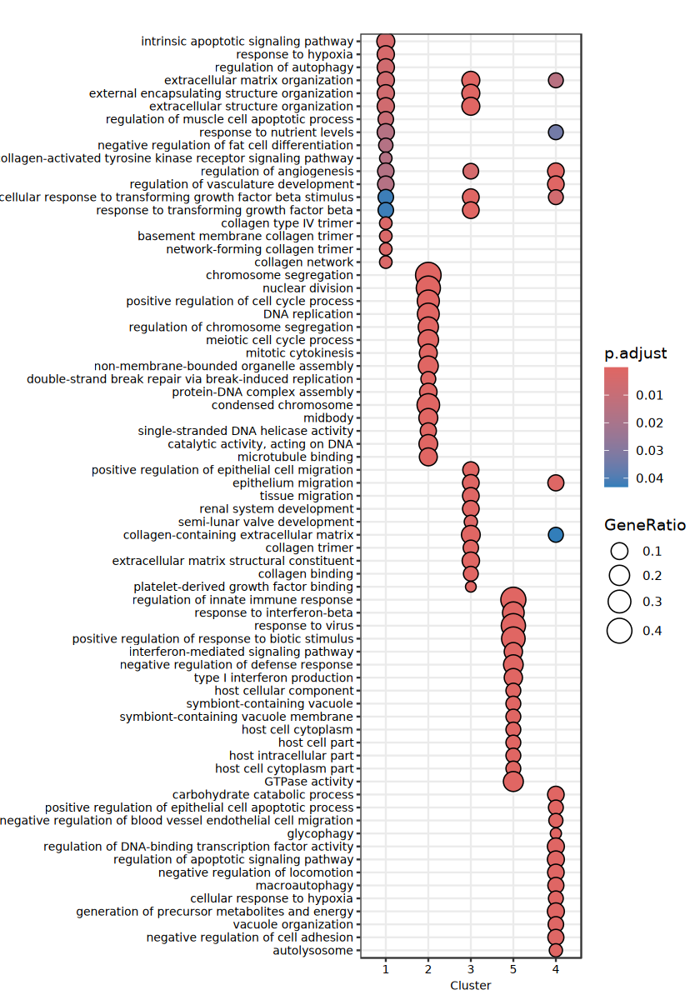

In [325]:
enrich_gene_list_for_test <- list("1"=cluster.markers$gene[cluster.markers$cluster==1],"2"=cluster.markers$gene[cluster.markers$cluster==2],
                                  "3"=cluster.markers$gene[cluster.markers$cluster==3],"5"=cluster.markers$gene[cluster.markers$cluster==5],
                                  "4"=top100$gene[top100$cluster==0]
                                )

compare_enrich <- compareCluster(geneCluster = enrich_gene_list_for_test,
                              keyType = 'SYMBOL',
                                   ont = "ALL",
                                   OrgDb = 'org.Mm.eg.db',
                                   pAdjustMethod = "BH",
                                    minGSSize = 3,
                                   fun =  enrichGO)
compare_enrich <- simplify(compare_enrich,cutoff=0.6)
options(repr.plot.width = 7, repr.plot.height = 10)
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure2.sup/GO_plot_cluster.pdf',width = 7,height = 10)
plot <- dotplot(compare_enrich,label_format = 100 ,showCategory=15, font.size=8)
print(plot)
dev.off()
print(plot)

In [328]:
compare_enrich@compareClusterResult

,Cluster,ONTOLOGY,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>
1,1,BP,GO:0097193,intrinsic apoptotic signaling pathway,7/55,327/28891,2.842026e-06,0.003752035,0.002568879,Ddit3/Hmox1/Bnip3/Cdkn1a/Trib3/Zfas1/Nupr1,7
2,1,BP,GO:0001666,response to hypoxia,6/55,233/28891,5.375408e-06,0.003752035,0.002568879,Hmox1/Bnip3/Rgcc/Zfas1/Acot2/Rora,6
4,1,BP,GO:0010506,regulation of autophagy,6/55,300/28891,2.254309e-05,0.006050915,0.004142837,Ddit3/Hmox1/Bnip3/Trib3/Nupr1/Rragd,6
5,1,BP,GO:0030198,extracellular matrix organization,6/55,322/28891,3.349867e-05,0.006050915,0.004142837,Mmp13/Col4a1/Rgcc/Col4a2/Lgals3/Mmp3,6
6,1,BP,GO:0045229,external encapsulating structure organization,6/55,323/28891,3.408312e-05,0.006050915,0.004142837,Mmp13/Col4a1/Rgcc/Col4a2/Lgals3/Mmp3,6
7,1,BP,GO:0043062,extracellular structure organization,6/55,324/28891,3.467573e-05,0.006050915,0.004142837,Mmp13/Col4a1/Rgcc/Col4a2/Lgals3/Mmp3,6
9,1,BP,GO:0010660,regulation of muscle cell apoptotic process,4/55,109/28891,5.637100e-05,0.008743769,0.005986535,Hmox1/Bnip3/Zfas1/Nupr1,4
14,1,BP,GO:0031667,response to nutrient levels,6/55,427/28891,1.581924e-04,0.015774044,0.010799903,Ddit3/Slc2a1/Cdkn1a/Clic5/Cd68/Rragd,6
16,1,BP,GO:0045599,negative regulation of fat cell differentiation,3/55,60/28891,2.068647e-04,0.016203622,0.011094020,Ddit3/Trib3/Rora,3


In [329]:
write.table(compare_enrich@compareClusterResult,file='/syn1/liangzhen/jinhua_jilab_project/result/scRNA/GO_scRNA.csv',sep=',',col.names=NA,quote=F)

In [352]:
Mm.gmt <- read.gmt('/syn1/liangzhen/GO_database/m5.all.v2024.1.Mm.symbols.gmt')
Mm.gmt

term,gene
<fct>,<chr>
GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,Aasdhppt
GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,Aldh1l1
GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,Aldh1l2
GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,Mthfd1
GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,Mthfd1l
GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,Mthfd2l
GOBP_2FE_2S_CLUSTER_ASSEMBLY,Fdx2
GOBP_2FE_2S_CLUSTER_ASSEMBLY,Fxn
GOBP_2FE_2S_CLUSTER_ASSEMBLY,Glrx3


In [354]:
cluster.markers <- cluster.markers[order(cluster.markers$avg_log2FC,decreasing = T),]
cluster.markers

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>
422,0,7.914994,0.326,0.004,0,5,Ifit3b
388,0,7.803465,0.573,0.016,0,5,Ifit3
391,0,7.791548,0.527,0.013,0,5,Ifit1
398,0,6.988892,0.471,0.064,0,5,Cxcl10
461,0,6.382937,0.203,0.005,0,5,Gm4841
427,0,6.205920,0.320,0.011,0,5,F830016B08Rik
458,0,6.200739,0.220,0.010,0,5,Cxcl9
378,0,5.951493,0.736,0.058,0,5,Iigp1
397,0,5.793439,0.426,0.017,0,5,Ifi44


In [ ]:
geneID <- bitr(cluster.markers$gene[cluster.markers$cluster=='3'], fromType = "SYMBOL", toType = "ENTREZID", OrgDb=org.Mm.eg.db)

In [365]:
cluster.markers_3 <- cluster.markers[cluster.markers$cluster=='3',]
rownames(cluster.markers_3) <- cluster.markers_3$gene

In [366]:
cluster.markers_3 <- cluster.markers_3[geneID$SYMBOL,]

In [380]:
cluster.markers$avg_log2FC[cluster.markers$cluster=='2']

[1] 4.602092 4.275370 4.236445 4.155450 4.114490 4.063172 4.052490 4.049637
  [9] 4.030117 4.000978 3.967455 3.947205 3.927086 3.921812 3.917356 3.905102
 [17] 3.889309 3.857245 3.854035 3.844517 3.844221 3.762824 3.757732 3.714622
 [25] 3.679177 3.653574 3.632321 3.624920 3.623147 3.584405 3.529011 3.481207
 [33] 3.374068 3.326584 3.322655 3.311324 3.299628 3.268513 3.257068 3.255748
 [41] 3.239131 3.231001 3.215607 3.210666 3.179329 3.163537 3.138473 3.133682
 [49] 3.109348 3.070881 3.005295 2.988150 2.969089 2.955231 2.948069 2.873870
 [57] 2.861734 2.841903 2.838312 2.837816 2.769366 2.736310 2.726207 2.704494
 [65] 2.703631 2.697123 2.666141 2.645177 2.635656 2.587545 2.549035 2.511058
 [73] 2.497810 2.483452 2.475731 2.393706 2.392126 2.387334 2.356196 2.331079
 [81] 2.291051 2.289177 2.281765 2.245776 2.229905 2.130880 2.109017 2.029595
 [89] 2.006411 1.951281 1.935283 1.913746 1.908990 1.903358 1.787033 1.743820
 [97] 1.733340 1.716127 1.679187 1.599204

In [418]:
avg_log2FC <- cluster.markers$avg_log2FC[cluster.markers$cluster=='4']
names(avg_log2FC) <- cluster.markers$gene[cluster.markers$cluster=='4']

In [419]:
GSEA_result <- gseGO(geneList=avg_log2FC, 
             ont ="ALL", 
             keyType = "SYMBOL", 
             nPerm = 10000, 
             minGSSize = 3, 
             maxGSSize = 800, 
             pvalueCutoff = 0.05, 
             verbose = TRUE, 
             OrgDb = 'org.Mm.eg.db',, 
             pAdjustMethod = "none")

preparing geneSet collections...

GSEA analysis...

Warning message in .GSEA(geneList = geneList, exponent = exponent, minGSSize = minGSSize, :
“We do not recommend using nPerm parameter incurrent and future releases”
Warning message in fgsea(pathways = geneSets, stats = geneList, nperm = nPerm, minSize = minGSSize, :
“You are trying to run fgseaSimple. It is recommended to use fgseaMultilevel. To run fgseaMultilevel, you need to remove the nperm argument in the fgsea function call.”
Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“All values in the stats vector are greater than zero and scoreType is "std", maybe you should switch to scoreType = "pos".”
leading edge analysis...

done...



In [420]:
write.table(GSEA_result@result,file='/syn1/liangzhen/jinhua_jilab_project/result/scRNA/cluster4_gseGO.csv',sep=',',col.names = NA,quote=F)

# Cd44 VS Fosb/Jun

In [130]:
library(Seurat)

In [131]:
sc.all.merge <- readRDS('/syn1/liangzhen/jinhua_jilab_project/result/scRNA/cellranger/sc.all.merge.T1T2T3a.harmony.final.refine.rds')

In [43]:
sc.all.merge

An object of class Seurat 
32285 features across 91411 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 19 layers present: counts.T1_a3026, counts.T1_a3028, counts.T1_a3030, counts.T2_a3026, counts.T2_a3028, counts.T2_a3030, counts.T3_a3026, counts.T3_a3028, counts.T3_a3030, scale.data, data.T1_a3026, data.T1_a3028, data.T1_a3030, data.T2_a3026, data.T2_a3028, data.T2_a3030, data.T3_a3026, data.T3_a3028, data.T3_a3030
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

In [44]:
grep("Cd44",rownames(sc.all.merge))

[1] 2076

In [61]:
df <- FetchData(sc.all.merge, vars=c("Cd44",'Fosb','Jun','seurat_clusters_rename','time'))
#df <- df[df$time!='T1',]
df

,Cd44,Fosb,Jun,seurat_clusters_rename,time
,<dbl>,<dbl>,<dbl>,<chr>,<chr>
T1_T1_a3026_AAACCCAAGACTAGAT-1,0.6236703,0.0000000,1.2801808,2,T1
T1_T1_a3026_AAACCCACATGAGATA-1,1.7155292,0.0000000,0.5652775,1,T1
T1_T1_a3026_AAACCCAGTCGCTGCA-1,2.1715098,0.0000000,0.0000000,1,T1
T1_T1_a3026_AAACCCAGTCTCGCGA-1,1.6320377,0.0000000,1.6757606,1,T1
T1_T1_a3026_AAACCCATCACGGGAA-1,1.2860243,0.0000000,1.2860243,1,T1
T1_T1_a3026_AAACCCATCGCTTACC-1,2.0390457,0.0000000,0.0000000,1,T1
T1_T1_a3026_AAACGAAAGATGAAGG-1,1.6197764,0.0000000,1.7521541,2,T1
T1_T1_a3026_AAACGAAAGATGGCGT-1,1.2528225,0.3483312,2.3979710,2,T1
T1_T1_a3026_AAACGAAAGGATACAT-1,1.4157653,1.1248513,1.6408431,3,T1


In [62]:
df

,Cd44,Fosb,Jun,seurat_clusters_rename,time
,<dbl>,<dbl>,<dbl>,<chr>,<chr>
T1_T1_a3026_AAACCCAAGACTAGAT-1,0.6236703,0.0000000,1.2801808,2,T1
T1_T1_a3026_AAACCCACATGAGATA-1,1.7155292,0.0000000,0.5652775,1,T1
T1_T1_a3026_AAACCCAGTCGCTGCA-1,2.1715098,0.0000000,0.0000000,1,T1
T1_T1_a3026_AAACCCAGTCTCGCGA-1,1.6320377,0.0000000,1.6757606,1,T1
T1_T1_a3026_AAACCCATCACGGGAA-1,1.2860243,0.0000000,1.2860243,1,T1
T1_T1_a3026_AAACCCATCGCTTACC-1,2.0390457,0.0000000,0.0000000,1,T1
T1_T1_a3026_AAACGAAAGATGAAGG-1,1.6197764,0.0000000,1.7521541,2,T1
T1_T1_a3026_AAACGAAAGATGGCGT-1,1.2528225,0.3483312,2.3979710,2,T1
T1_T1_a3026_AAACGAAAGGATACAT-1,1.4157653,1.1248513,1.6408431,3,T1


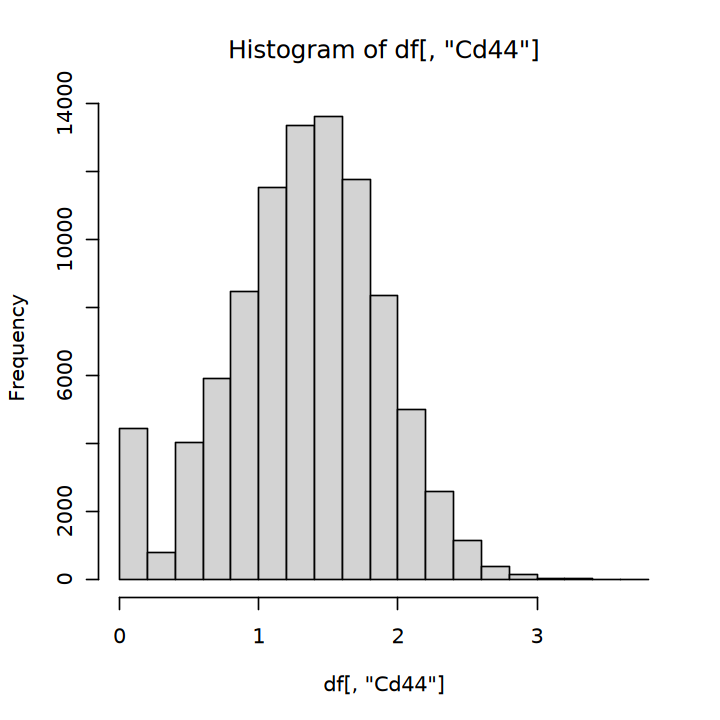

In [63]:
hist(df[,'Cd44'])

In [64]:
df$Cd44_level <- 'High'
df[df$Cd44 > 1 & df$Cd44 < 2,'Cd44_level'] <- 'Mid'
df[df$Cd44 < 1,'Cd44_level'] <- 'Low'
df$Cd44_level <- factor(df$Cd44_level,level=c('Low','Mid','High'))

In [58]:
df

,Cd44,Fosb,Jun,seurat_clusters_rename,time,Cd44_level
,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<fct>
T1_T1_a3026_AAACCCAAGACTAGAT-1,0.6236703,0.0000000,1.2801808,2,T1,Low
T1_T1_a3026_AAACCCACATGAGATA-1,1.7155292,0.0000000,0.5652775,1,T1,Mid
T1_T1_a3026_AAACCCAGTCGCTGCA-1,2.1715098,0.0000000,0.0000000,1,T1,High
T1_T1_a3026_AAACCCAGTCTCGCGA-1,1.6320377,0.0000000,1.6757606,1,T1,Mid
T1_T1_a3026_AAACCCATCACGGGAA-1,1.2860243,0.0000000,1.2860243,1,T1,Mid
T1_T1_a3026_AAACCCATCGCTTACC-1,2.0390457,0.0000000,0.0000000,1,T1,High
T1_T1_a3026_AAACGAAAGATGAAGG-1,1.6197764,0.0000000,1.7521541,2,T1,Mid
T1_T1_a3026_AAACGAAAGATGGCGT-1,1.2528225,0.3483312,2.3979710,2,T1,Mid
T1_T1_a3026_AAACGAAAGGATACAT-1,1.4157653,1.1248513,1.6408431,3,T1,Mid


In [59]:
table(df$Cd44_level)


  Low   Mid  High 
23621 58572  9218 

png 
  2

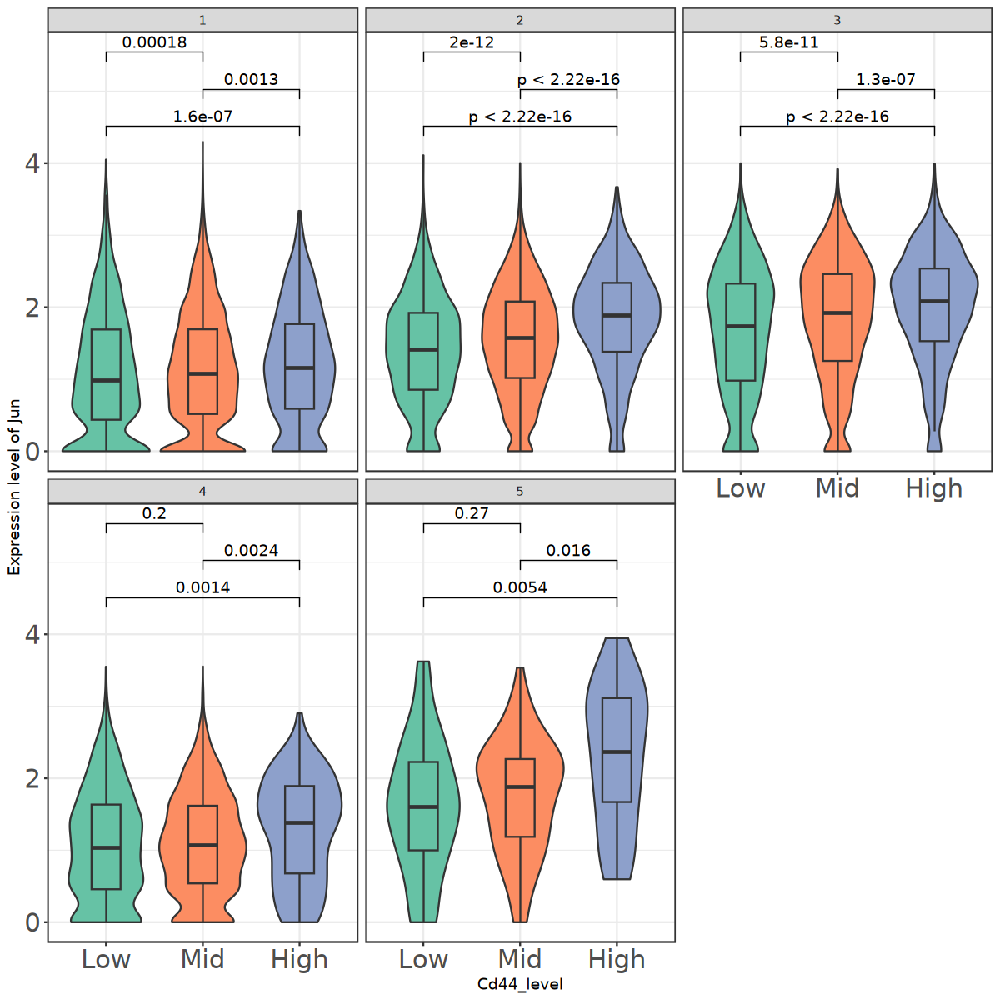

In [473]:
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure5/sc_state_Jun_exp_BL.pdf',width=10,height=10)
options(repr.plot.width = 10, repr.plot.height = 10)
plot <- ggplot(df,aes(x=Cd44_level,y=Jun,fill=Cd44_level))+geom_violin(trim = T) +  # 小提琴图
  geom_boxplot(width = 0.3, outlier.shape = NA) +  facet_wrap(~seurat_clusters_rename)+
  scale_fill_brewer(palette = "Set2") +  
  ylab('Expression level of Jun')+
  theme_bw()+
  theme(
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18)
  )+
  stat_compare_means(comparisons = list(c("High", "Low"), c("High", "Mid"), c("Mid", "Low")),
                     method = "wilcox.test",label = "p.format") 
print(plot)
dev.off()
print(plot)

png 
  2

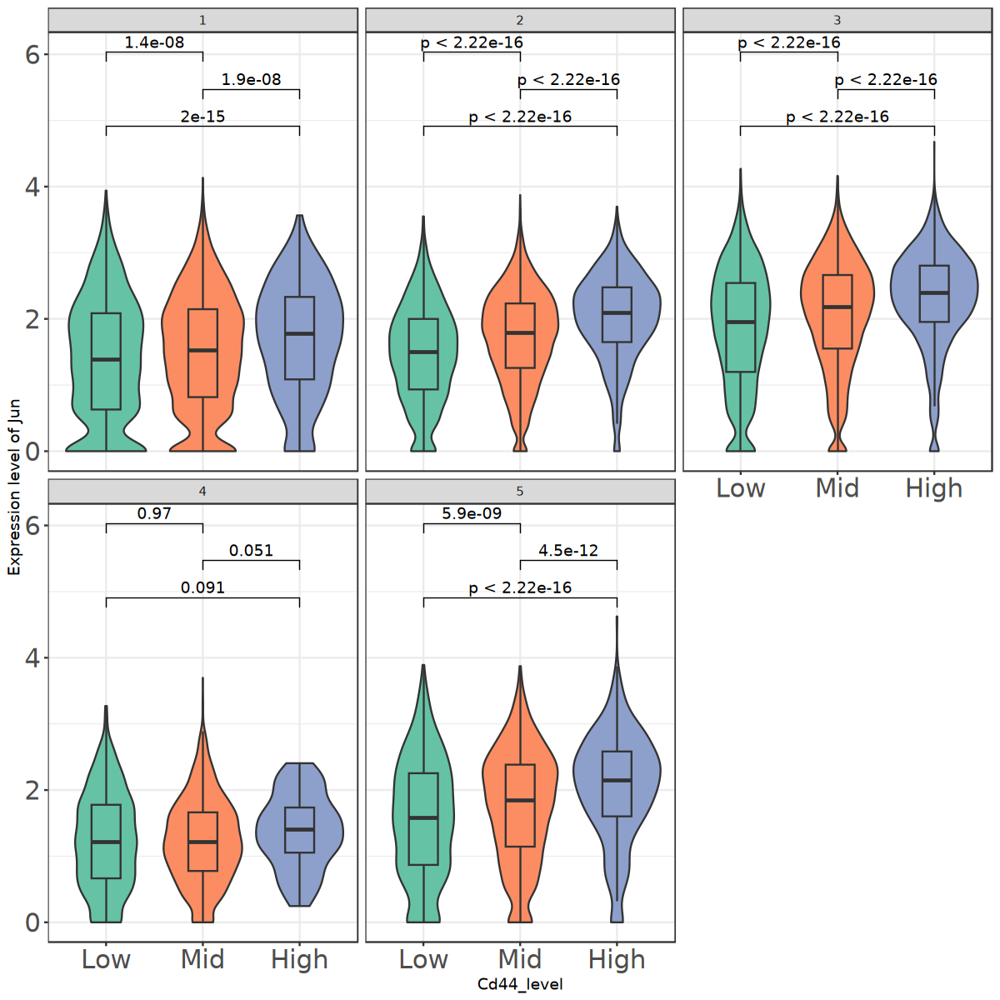

In [481]:
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure5/sc_state_Jun_exp_EEandLE.pdf',width=10,height=10)
options(repr.plot.width = 10, repr.plot.height = 10)
plot <- ggplot(df,aes(x=Cd44_level,y=Jun,fill=Cd44_level))+geom_violin(trim = T) +  # 小提琴图
  geom_boxplot(width = 0.3, outlier.shape = NA) +  facet_wrap(~seurat_clusters_rename)+
  scale_fill_brewer(palette = "Set2") +  
  ylab('Expression level of Jun')+
  theme_bw()+
  theme(
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18)
  )+
  stat_compare_means(comparisons = list(c("High", "Low"), c("High", "Mid"), c("Mid", "Low")),
                     method = "wilcox.test",label = "p.format") 
print(plot)
dev.off()
print(plot)

png 
  2

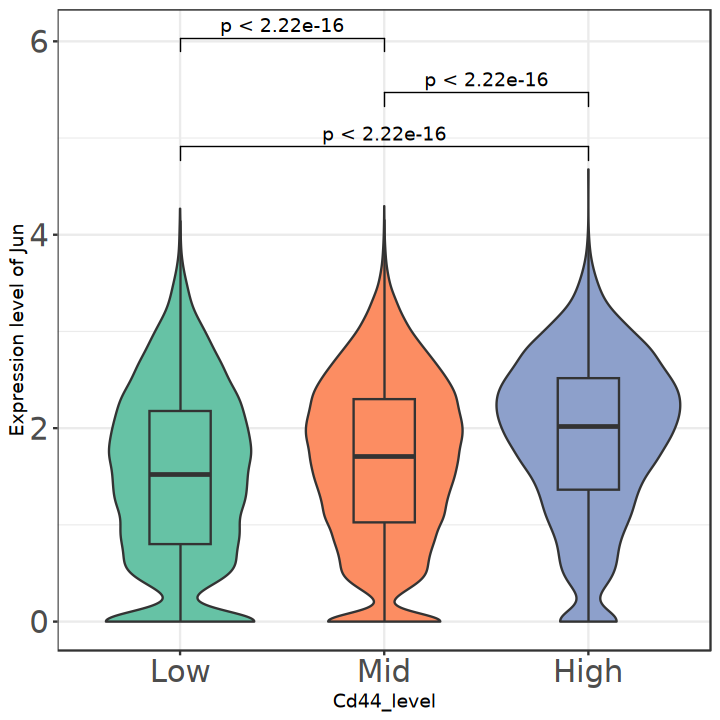

In [239]:
library(ggpubr)
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure5/Cd44_vs_Jun.pdf',width=6,height=6)
options(repr.plot.width = 6, repr.plot.height = 6)
plot <- ggplot(df,aes(x=Cd44_level,y=Jun,fill=Cd44_level))+geom_violin(trim = T) +  # 小提琴图
  geom_boxplot(width = 0.3, outlier.shape = NA) +  # 盒型图
  scale_fill_brewer(palette = "Set2") +  
  ylab('Expression level of Jun')+
  theme_bw()+
  theme(
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18)
  )+
  stat_compare_means(comparisons = list(c("High", "Low"), c("High", "Mid"), c("Mid", "Low")),
                     method = "wilcox.test",label = "p.format") 
print(plot)
dev.off()
print(plot)

png 
  2

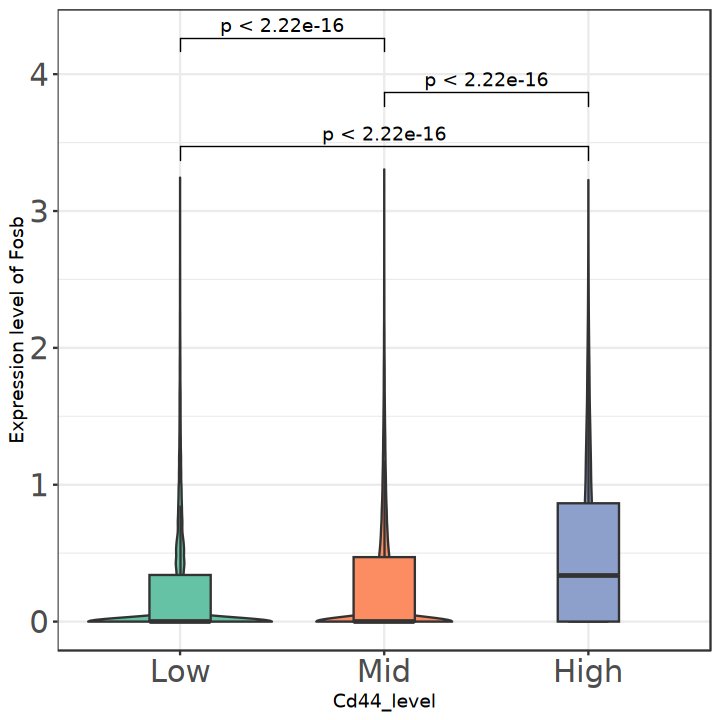

In [238]:
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure5/Cd44_vs_Fosb.pdf',width=6,height=6)
options(repr.plot.width = 6, repr.plot.height = 6)
plot <- ggplot(df,aes(x=Cd44_level,y=Fosb,fill=Cd44_level))+geom_violin(trim = T) +  # 小提琴图
  geom_boxplot(width = 0.3, outlier.shape = NA) +  # 盒型图
  scale_fill_brewer(palette = "Set2") +  
  ylab('Expression level of Fosb')+
  theme_bw()+
  theme(
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18)
  )+
  stat_compare_means(comparisons = list(c("High", "Low"), c("High", "Mid"), c("Mid", "Low")),
                     method = "wilcox.test",label = "p.format") 
print(plot)
dev.off()
print(plot)

png 
  2

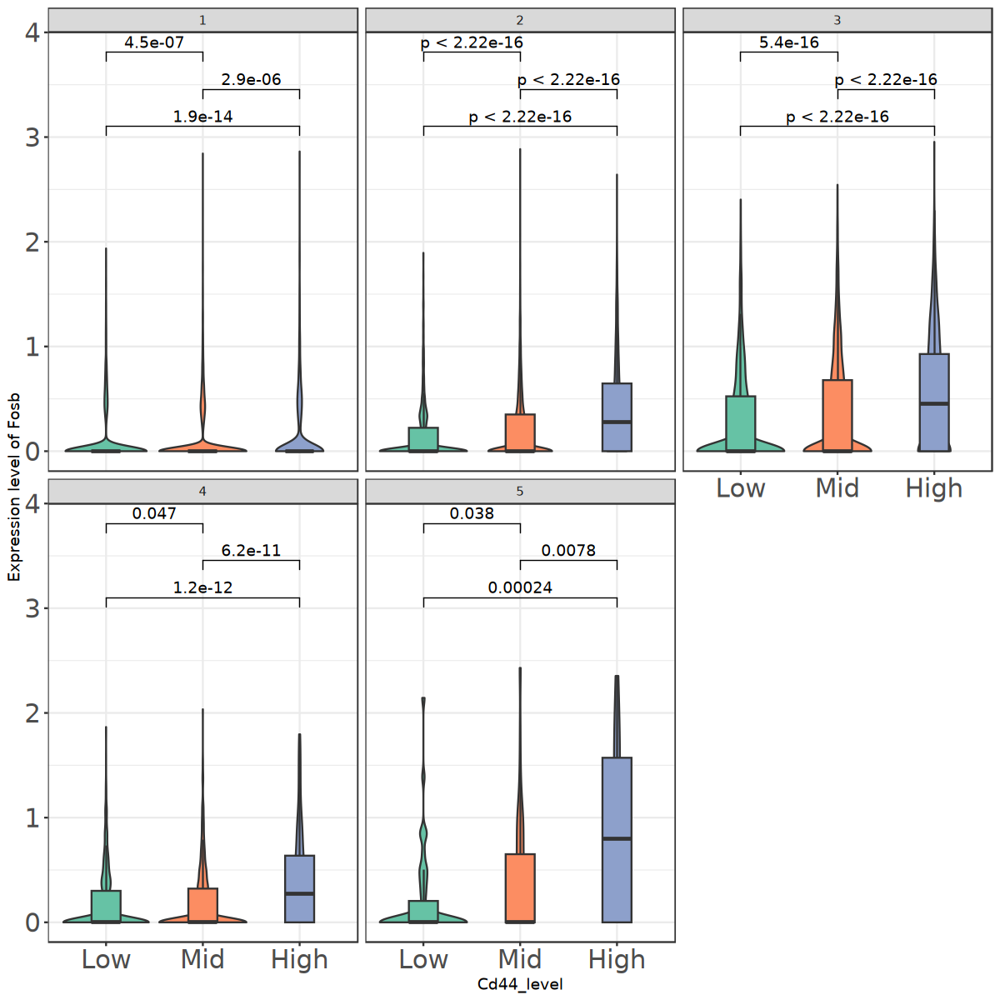

In [553]:
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure5/sc_state_Fosb_exp_BL.pdf',width=10,height=10)
options(repr.plot.width = 10, repr.plot.height = 10)
plot <- ggplot(df,aes(x=Cd44_level,y=Fosb,fill=Cd44_level))+geom_violin(trim = T) +  # 小提琴图
  geom_boxplot(width = 0.3, outlier.shape = NA) +  facet_wrap(~seurat_clusters_rename)+
  scale_fill_brewer(palette = "Set2") +  
  ylab('Expression level of Fosb')+
  theme_bw()+
  theme(
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18)
  )+
  stat_compare_means(comparisons = list(c("High", "Low"), c("High", "Mid"), c("Mid", "Low")),
                     method = "wilcox.test",label = "p.format") 
print(plot)
dev.off()
print(plot)

png 
  2

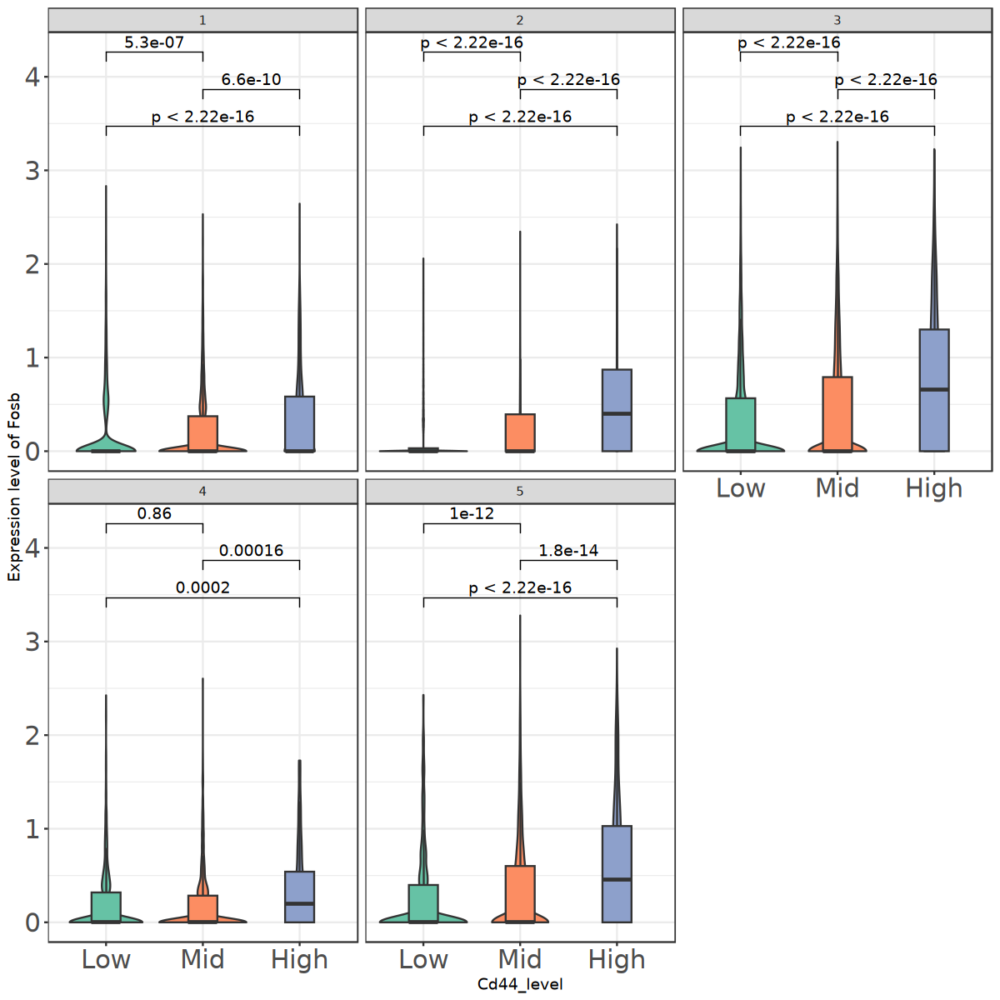

In [558]:
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure5/sc_state_Fosb_exp_EELE.pdf',width=10,height=10)
options(repr.plot.width = 10, repr.plot.height = 10)
plot <- ggplot(df,aes(x=Cd44_level,y=Fosb,fill=Cd44_level))+geom_violin(trim = T) +  # 小提琴图
  geom_boxplot(width = 0.3, outlier.shape = NA) +  facet_wrap(~seurat_clusters_rename)+
  scale_fill_brewer(palette = "Set2") +  
  ylab('Expression level of Fosb')+
  theme_bw()+
  theme(
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18)
  )+
  stat_compare_means(comparisons = list(c("High", "Low"), c("High", "Mid"), c("Mid", "Low")),
                     method = "wilcox.test",label = "p.format") 
print(plot)
dev.off()
print(plot)

In [145]:
library(ggplot2)

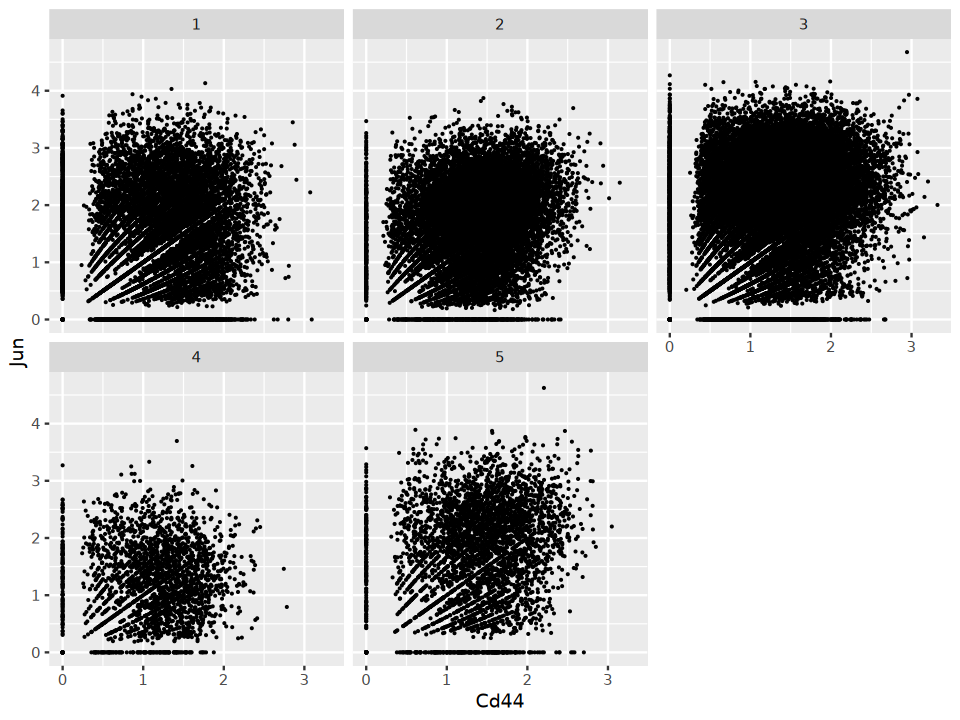

In [153]:
ggplot(df)+geom_point(aes(x=Cd44,y=Jun),size=0.1) + facet_wrap(~seurat_clusters_rename)

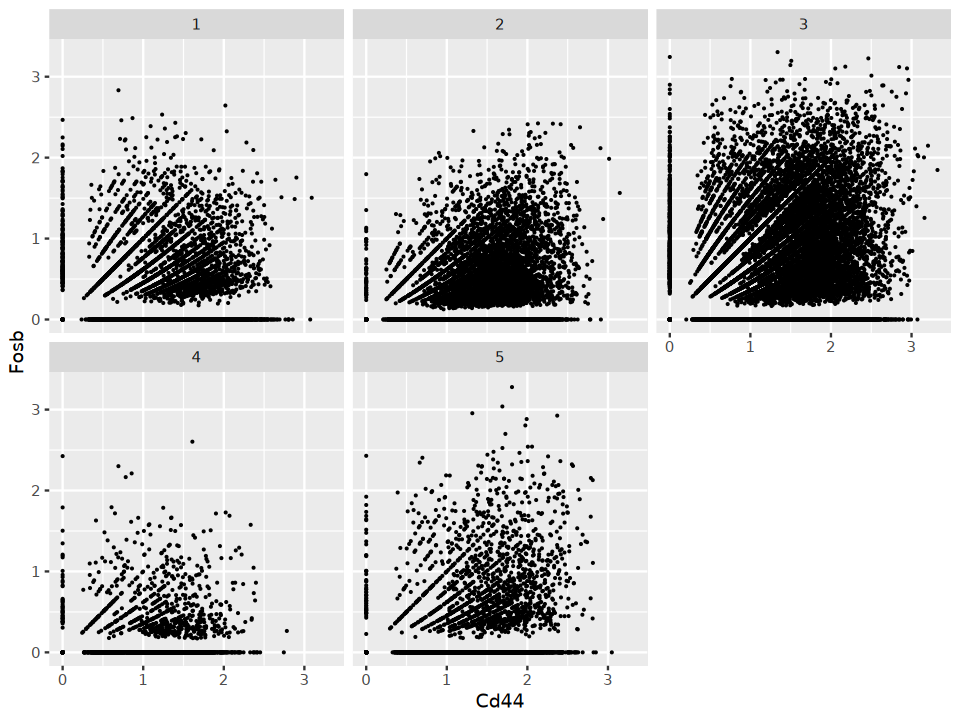

In [154]:
ggplot(df)+geom_point(aes(x=Cd44,y=Fosb),size=0.1)+facet_wrap(~seurat_clusters_rename)

In [482]:
df <- FetchData(sc.all.merge, vars=c('Itgav','Itgb1','Fosb','Jun','seurat_clusters_rename','time'))
#df <- df[df$time!='T1',]
df

,Itgav,Itgb1,Fosb,Jun,Gapdh,seurat_clusters_rename,time
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
T1_T1_a3026_AAACCCAAGACTAGAT-1,0.6236703,1.0048607,0.0000000,1.2801808,2.834191,2,T1
T1_T1_a3026_AAACCCACATGAGATA-1,0.5652775,1.7155292,0.0000000,0.5652775,3.201039,1,T1
T1_T1_a3026_AAACCCAGTCGCTGCA-1,0.4993357,1.2782931,0.0000000,0.0000000,4.125147,1,T1
T1_T1_a3026_AAACCCAGTCTCGCGA-1,0.6493446,1.2237754,0.0000000,1.6757606,4.589912,1,T1
T1_T1_a3026_AAACCCATCACGGGAA-1,1.0099929,1.8304583,0.0000000,1.2860243,5.093153,1,T1
T1_T1_a3026_AAACCCATCGCTTACC-1,0.7953159,1.3957128,0.0000000,0.0000000,2.956321,1,T1
T1_T1_a3026_AAACGAAAGATGAAGG-1,0.3898107,0.8879339,0.0000000,1.7521541,3.845099,2,T1
T1_T1_a3026_AAACGAAAGATGGCGT-1,0.3483312,1.1260676,0.3483312,2.3979710,2.917850,2,T1
T1_T1_a3026_AAACGAAAGGATACAT-1,0.9399366,0.9399366,1.1248513,1.6408431,3.739459,3,T1


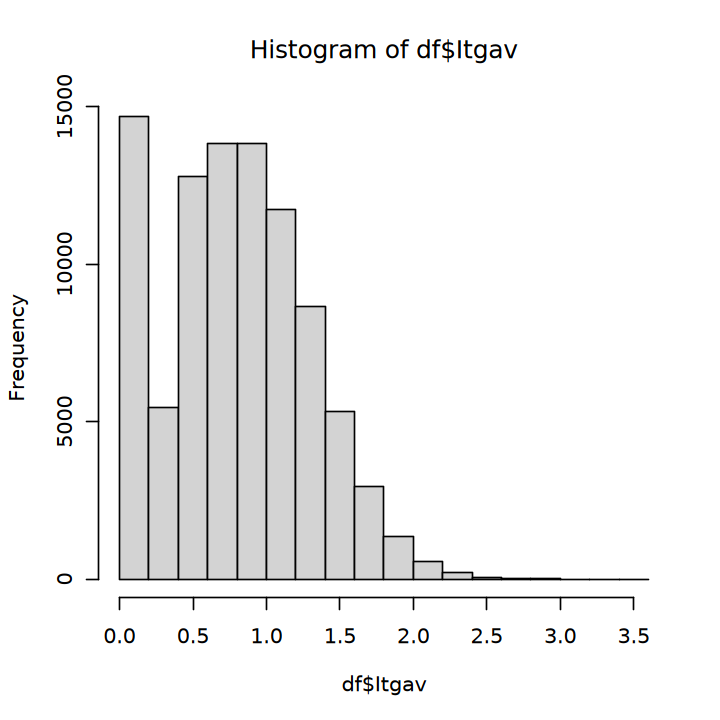

In [250]:
hist(df$Itgav)

In [60]:
df$Itgav_level <- 'High'
df[df$Itgav > 0.5 & df$Itgav < 1.5,'Itgav_level'] <- 'Mid'
df[df$Itgav < 0.5,'Itgav_level'] <- 'Low'

In [266]:
df$Itgav_level <- factor(df$Itgav_level,level=c('Low','Mid','High'))

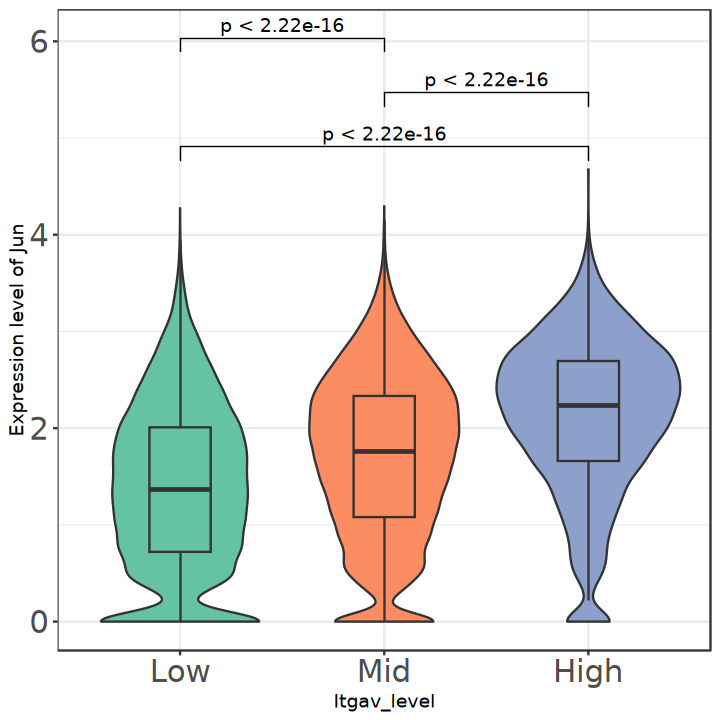

In [267]:
options(repr.plot.width = 6, repr.plot.height = 6)
plot <- ggplot(df,aes(x=Itgav_level,y=Jun,fill=Itgav_level))+geom_violin(trim = T) +  # 小提琴图
  geom_boxplot(width = 0.3, outlier.shape = NA) +  # 盒型图
  scale_fill_brewer(palette = "Set2") +  
  ylab('Expression level of Jun')+
  theme_bw()+
  theme(
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18)
  )+
  stat_compare_means(comparisons = list(c("High", "Low"), c("High", "Mid"), c("Mid", "Low")),
                     method = "wilcox.test",label = "p.format") 
print(plot)


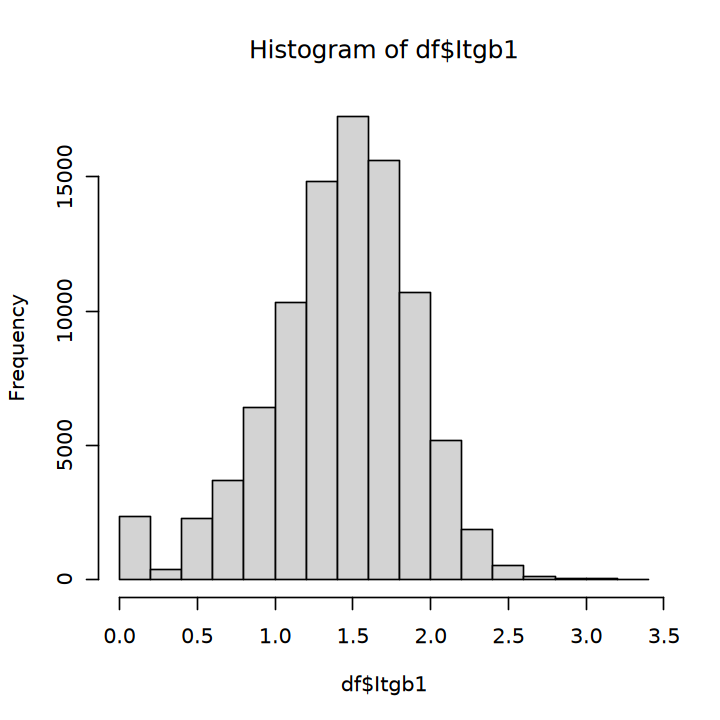

In [253]:
hist(df$Itgb1)

In [262]:
df$Itgb1_level <- 'High'
df[df$Itgb1 > 1 & df$Itgb1 < 2,'Itgb1_level'] <- 'Mid'
df[df$Itgb1 < 1,'Itgb1_level'] <- 'Low'

In [263]:
df$Itgb1_level <- factor(df$Itgb1_level,level=c('Low','Mid','High'))

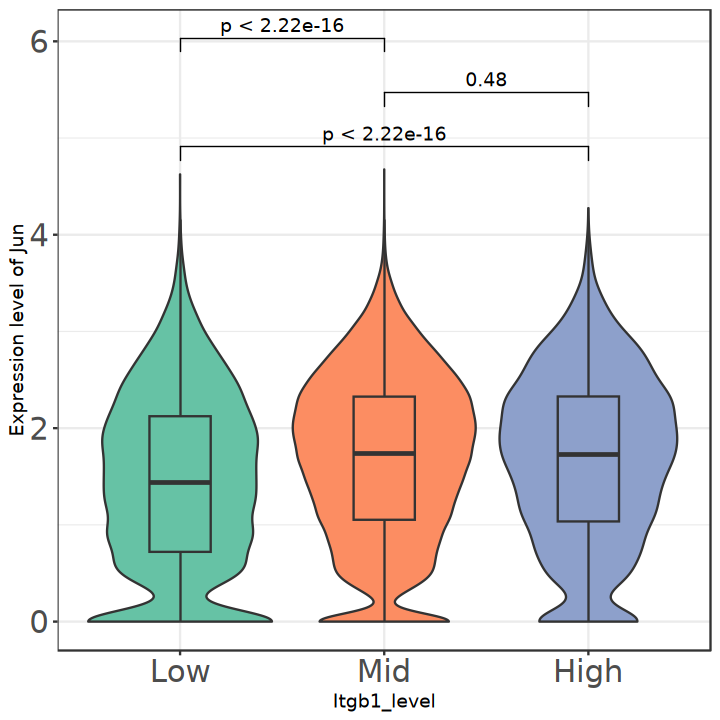

In [264]:
options(repr.plot.width = 6, repr.plot.height = 6)
plot <- ggplot(df,aes(x=Itgb1_level,y=Jun,fill=Itgb1_level))+geom_violin(trim = T) +  # 小提琴图
  geom_boxplot(width = 0.3, outlier.shape = NA) +  # 盒型图
  scale_fill_brewer(palette = "Set2") +  
  ylab('Expression level of Jun')+
  theme_bw()+
  theme(
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18)
  )+
  stat_compare_means(comparisons = list(c("High", "Low"), c("High", "Mid"), c("Mid", "Low")),
                     method = "wilcox.test",label = "p.format") 
print(plot)


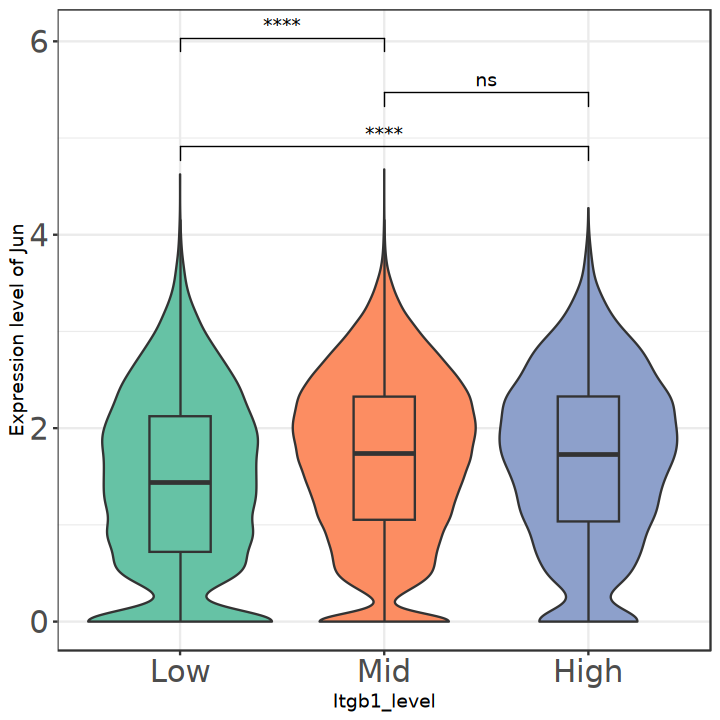

In [268]:
options(repr.plot.width = 6, repr.plot.height = 6)
plot <- ggplot(df,aes(x=Itgb1_level,y=Jun,fill=Itgb1_level))+geom_violin(trim = T) +  # 小提琴图
  geom_boxplot(width = 0.3, outlier.shape = NA) +  # 盒型图
  scale_fill_brewer(palette = "Set2") +  
  ylab('Expression level of Jun')+
  theme_bw()+
  theme(
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18)
  )+
  stat_compare_means(comparisons = list(c("High", "Low"), c("High", "Mid"), c("Mid", "Low")),
                     method = "wilcox.test",label = "p.signif") 
print(plot)


In [65]:
sc.all.merge$Cd44_level <- df[rownames(sc.all.merge@meta.data),'Cd44_level']

In [66]:
sc.all.merge.sub <- subset(sc.all.merge,Cd44_level %in% c('High','Low'))

In [67]:
sc.all.merge.sub

An object of class Seurat 
32285 features across 32839 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 19 layers present: counts.T1_a3026, counts.T1_a3028, counts.T1_a3030, counts.T2_a3026, counts.T2_a3028, counts.T2_a3030, counts.T3_a3026, counts.T3_a3028, counts.T3_a3030, scale.data, data.T1_a3026, data.T1_a3028, data.T1_a3030, data.T2_a3026, data.T2_a3028, data.T2_a3030, data.T3_a3026, data.T3_a3028, data.T3_a3030
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

In [68]:
sc.all.merge.sub <- JoinLayers(sc.all.merge.sub)

In [69]:
sc.all.merge.sub

An object of class Seurat 
32285 features across 32839 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

In [70]:
table(sc.all.merge.sub@meta.data$Cd44_level)


  Low   Mid  High 
23621     0  9218 

In [71]:
Idents(sc.all.merge.sub) <- sc.all.merge.sub@meta.data$Cd44_level

In [11]:
help(FindAllMarkers)

In [72]:
sc.all.merge.sub.markers <- FindAllMarkers(sc.all.merge.sub, only.pos = TRUE,min.pct = 0.1)

Calculating cluster Low

Calculating cluster High



In [73]:
sc.all.merge.sub.markers

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Aqp5,0.000000e+00,0.7916177,0.912,0.854,0.000000e+00,Low,Aqp5
Ndufa7,0.000000e+00,0.4558729,0.964,0.957,0.000000e+00,Low,Ndufa7
Uba52,0.000000e+00,0.3998130,0.994,0.989,0.000000e+00,Low,Uba52
Ndufa13,0.000000e+00,0.4445023,0.965,0.969,0.000000e+00,Low,Ndufa13
D8Ertd738e,0.000000e+00,0.3876494,0.984,0.980,0.000000e+00,Low,D8Ertd738e
Cox5a,0.000000e+00,0.4534713,0.991,0.988,0.000000e+00,Low,Cox5a
Atp5d,0.000000e+00,0.3778152,0.987,0.984,0.000000e+00,Low,Atp5d
Psmb1,0.000000e+00,0.4085681,0.998,0.995,0.000000e+00,Low,Psmb1
Cox5b,0.000000e+00,0.4534109,0.978,0.976,0.000000e+00,Low,Cox5b


In [357]:
sc.all.merge.sub.markers[sc.all.merge.sub.markers$cluster=='High',][c('Fosb','Jun'),]

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Fosb,0.000000e+00,1.4587774,0.560,0.282,0.000000e+00,High,Fosb
Jun,3.476213e-302,0.5210165,0.953,0.889,1.122295e-297,High,Jun


In [74]:
tfs <- read.table('/syn1/liangzhen/jinhua_jilab_project/result/scATAC_and_scRNA/mm_mgi_tfs.txt')

In [75]:
sc.all.merge.sub.markers.high <- sc.all.merge.sub.markers[sc.all.merge.sub.markers$gene %in% tfs$V1 & sc.all.merge.sub.markers$cluster=='High',]

In [76]:
sc.all.merge.sub.markers.high['Irf1',]

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Irf1,8.0322e-227,1.028283,0.547,0.361,2.593196e-222,High,Irf1


In [77]:
library(ggplot2)
library(ggrepel)

In [78]:
sc.all.merge.sub.markers.high[sc.all.merge.sub.markers.high$p_val_adj == 0 ,'p_val_adj'] <- 10^(-300)
sc.all.merge.sub.markers.high[-log(sc.all.merge.sub.markers.high$p_val_adj,10) < 200 | abs(sc.all.merge.sub.markers.high$avg_log2FC) < 0.5 ,'gene'] <- ''

Warning message:
“ggrepel: 3 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


png 
  2

Warning message:
“ggrepel: 38 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


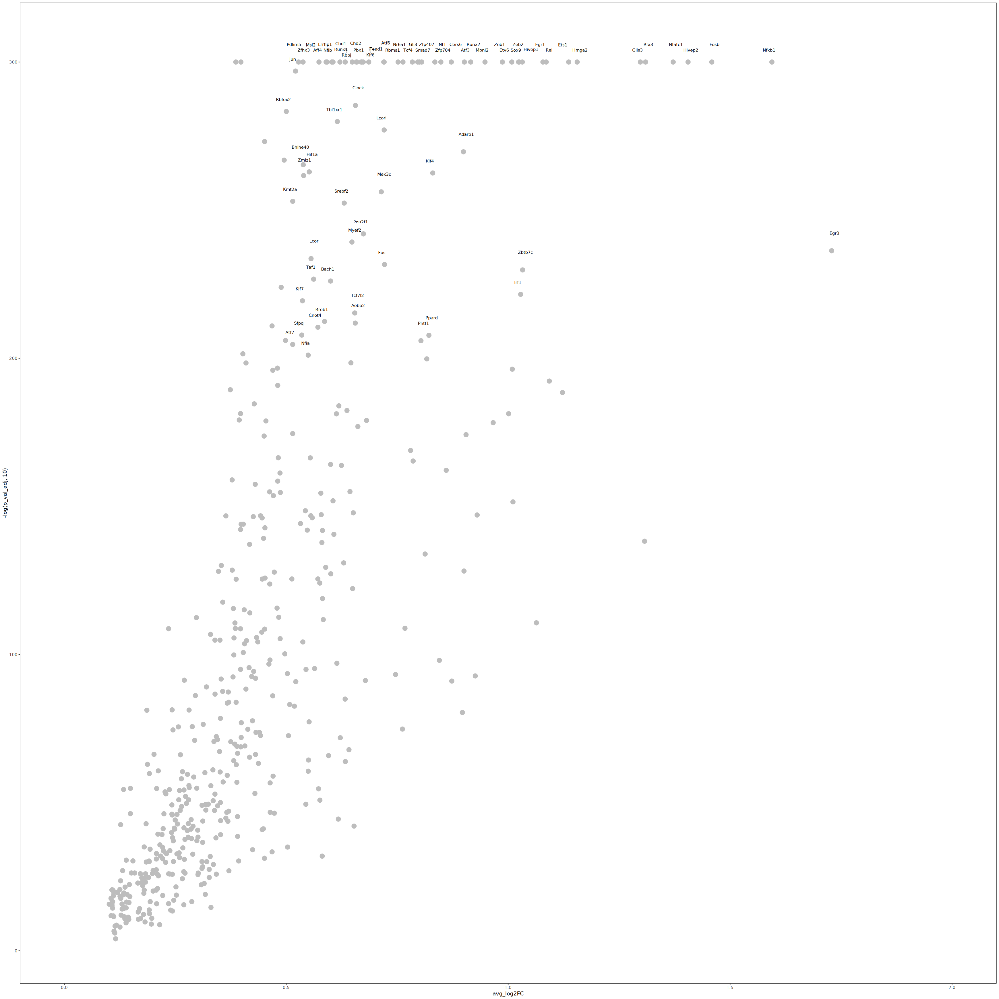

In [87]:
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure5/Cd44_high_VS_low.pdf',width=29,height=29)
options(repr.plot.width = 29, repr.plot.height = 29)
plot <- ggplot(sc.all.merge.sub.markers.high,aes(x=avg_log2FC,y=-log(p_val_adj,10))) + geom_point(size=4,color='#bdbdbd')+theme_bw()+
    theme(panel.grid = element_blank())+#coord_fixed(ratio = 1) +
    geom_text_repel(aes(avg_log2FC,-log(p_val_adj,base=10)+5,label=gene),size=3,
                    max.overlaps =10,box.padding = unit(0.1,"line"), point.padding = unit(0.1,"line"),
                    segment.color="gray",show.legend = F)+xlim(0,2)
print(plot)
dev.off()
print(plot)

Warning message:
“ggrepel: 3 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


png 
  2

Warning message:
“ggrepel: 38 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


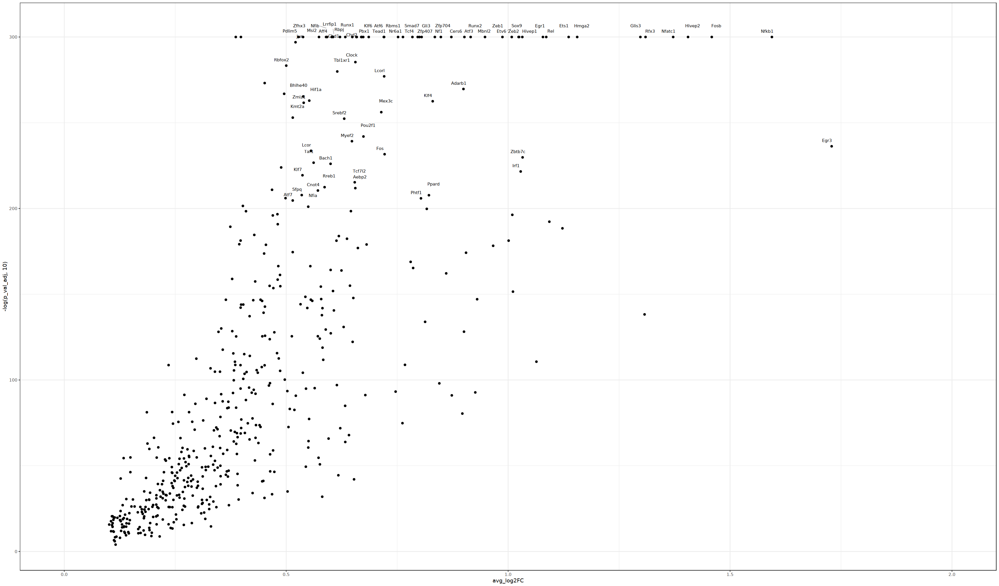

In [410]:
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure5/Cd44_high_VS_low.pdf',width=29,height=17)
options(repr.plot.width = 29, repr.plot.height = 17)
plot <- ggplot(sc.all.merge.sub.markers.high,aes(x=avg_log2FC,y=-log(p_val_adj,10))) + geom_point()+theme_bw()+
    geom_text_repel(aes(avg_log2FC,-log(p_val_adj,base=10)+5,label=gene),size=3,
                    max.overlaps =10,box.padding = unit(0.1,"line"), point.padding = unit(0.1,"line"),
                    segment.color="gray",show.legend = F)+xlim(0,2)
print(plot)
dev.off()
print(plot)

In [501]:
df <- FetchData(sc.all.merge, vars=c('Jun','Gapdh','seurat_clusters_rename','time'))
#df <- df[df$time!='T1',]
df

,Jun,Gapdh,seurat_clusters_rename,time
,<dbl>,<dbl>,<chr>,<chr>
T1_T1_a3026_AAACCCAAGACTAGAT-1,1.2801808,2.834191,2,T1
T1_T1_a3026_AAACCCACATGAGATA-1,0.5652775,3.201039,1,T1
T1_T1_a3026_AAACCCAGTCGCTGCA-1,0.0000000,4.125147,1,T1
T1_T1_a3026_AAACCCAGTCTCGCGA-1,1.6757606,4.589912,1,T1
T1_T1_a3026_AAACCCATCACGGGAA-1,1.2860243,5.093153,1,T1
T1_T1_a3026_AAACCCATCGCTTACC-1,0.0000000,2.956321,1,T1
T1_T1_a3026_AAACGAAAGATGAAGG-1,1.7521541,3.845099,2,T1
T1_T1_a3026_AAACGAAAGATGGCGT-1,2.3979710,2.917850,2,T1
T1_T1_a3026_AAACGAAAGGATACAT-1,1.6408431,3.739459,3,T1


In [502]:
df$Cd44_norm <- df[,'Jun']-df[,'Gapdh']

In [503]:
df

,Jun,Gapdh,seurat_clusters_rename,time,Cd44_norm
,<dbl>,<dbl>,<chr>,<chr>,<dbl>
T1_T1_a3026_AAACCCAAGACTAGAT-1,1.2801808,2.834191,2,T1,-1.5540098
T1_T1_a3026_AAACCCACATGAGATA-1,0.5652775,3.201039,1,T1,-2.6357610
T1_T1_a3026_AAACCCAGTCGCTGCA-1,0.0000000,4.125147,1,T1,-4.1251467
T1_T1_a3026_AAACCCAGTCTCGCGA-1,1.6757606,4.589912,1,T1,-2.9141509
T1_T1_a3026_AAACCCATCACGGGAA-1,1.2860243,5.093153,1,T1,-3.8071287
T1_T1_a3026_AAACCCATCGCTTACC-1,0.0000000,2.956321,1,T1,-2.9563213
T1_T1_a3026_AAACGAAAGATGAAGG-1,1.7521541,3.845099,2,T1,-2.0929449
T1_T1_a3026_AAACGAAAGATGGCGT-1,2.3979710,2.917850,2,T1,-0.5198785
T1_T1_a3026_AAACGAAAGGATACAT-1,1.6408431,3.739459,3,T1,-2.0986163


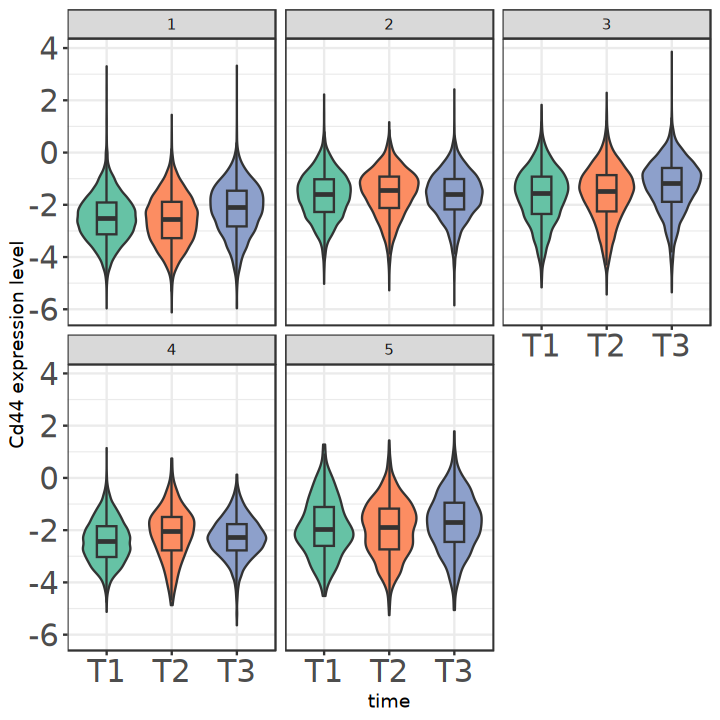

In [504]:
options(repr.plot.width = 6, repr.plot.height = 6)
ggplot(df,aes(x=time,y=Cd44_norm,fill=time))+geom_violin(trim = T) + facet_wrap(~seurat_clusters_rename)+
  geom_boxplot(width = 0.3, outlier.shape = NA) + 
  scale_fill_brewer(palette = "Set2") + 
  ylab('Cd44 expression level')+
  theme_bw()+
  theme(
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18)
  )

# Cd44 VS Fosb/Jun (clone)

In [574]:
sc.all.merge

An object of class Seurat 
32285 features across 91411 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

In [575]:
sc.all.merge@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.2,seurat_clusters,pANN_0.25_0.12_592,Doublet_or_Singlet,pANN_0.25_0.21_600,pANN_0.25_0.19_742,⋯,pANN_0.25_0.29_759,pANN_0.25_0.28_612,pANN_0.25_0.14_771,pANN_0.25_0.07_798,RNA_snn_res.0.3,harmony_clusters,seurat_clusters_rename,umapharmony_1,umapharmony_2,time_cluster
,<chr>,<dbl>,<int>,<dbl>,<chr>,<fct>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<chr>,<dbl>,<dbl>,<fct>
T1_T1_a3026_AAACCCAAGACTAGAT-1,T1_a3026,23101,4348,5.6534349,1,1,0.31401210,Singlet,NA,NA,⋯,NA,NA,NA,NA,1,1,2,3.9604470,5.4197859,T1_2
T1_T1_a3026_AAACCCACATGAGATA-1,T1_a3026,13159,3546,2.0290296,0,2,0.35635081,Singlet,NA,NA,⋯,NA,NA,NA,NA,0,2,1,-4.3216055,-2.7615321,T1_1
T1_T1_a3026_AAACCCAGTCGCTGCA-1,T1_a3026,15441,3362,5.9840684,0,2,0.25604839,Singlet,NA,NA,⋯,NA,NA,NA,NA,0,2,1,-2.2831264,-2.0551043,T1_1
T1_T1_a3026_AAACCCAGTCTCGCGA-1,T1_a3026,87500,7440,4.8742857,0,2,0.45211694,Singlet,NA,NA,⋯,NA,NA,NA,NA,0,2,1,-2.3479148,-1.7235541,T1_1
T1_T1_a3026_AAACCCATCACGGGAA-1,T1_a3026,22915,3939,4.2330351,0,2,0.25000000,Singlet,NA,NA,⋯,NA,NA,NA,NA,0,2,1,-2.8805269,-2.3351765,T1_1
T1_T1_a3026_AAACCCATCGCTTACC-1,T1_a3026,16459,4443,1.6951212,0,2,0.35584677,Singlet,NA,NA,⋯,NA,NA,NA,NA,0,2,1,-3.2611917,-3.7758344,T1_1
T1_T1_a3026_AAACGAAAGATGAAGG-1,T1_a3026,41955,5372,2.9293290,0,1,0.34274194,Singlet,NA,NA,⋯,NA,NA,NA,NA,5,1,2,-3.9233058,-2.5635064,T1_2
T1_T1_a3026_AAACGAAAGATGGCGT-1,T1_a3026,23998,4543,3.2752729,1,1,0.32409274,Singlet,NA,NA,⋯,NA,NA,NA,NA,1,1,2,2.9485046,2.2712824,T1_2
T1_T1_a3026_AAACGAAAGGATACAT-1,T1_a3026,19233,3932,3.7227682,0,0,0.35181452,Singlet,NA,NA,⋯,NA,NA,NA,NA,0,0,3,-1.1678324,-2.1568299,T1_3


In [576]:
cell_lineage <- read.table('/syn1/liangzhen/jinhua_jilab_project/result/DNA_Amplicon/cell_lineage.T1_T2_T3a.csv',header = T,row.names = 1,sep=',')

sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO301','orig.ident'] <- 'T2_a3026_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO302','orig.ident'] <- 'T2_a3026_2'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO303','orig.ident'] <- 'T2_a3028_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO304','orig.ident'] <- 'T2_a3028_2'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO305','orig.ident'] <- 'T2_a3030_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T2' & sc.all.merge@meta.data$Assignment_0.7=='CMO306','orig.ident'] <- 'T2_a3030_2'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO301','orig.ident'] <- 'T3_a3026_1_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO307','orig.ident'] <- 'T3_a3026_2_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO303','orig.ident'] <- 'T3_a3028_1_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO304','orig.ident'] <- 'T3_a3028_2_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO305','orig.ident'] <- 'T3_a3030_1_1'
sc.all.merge@meta.data[sc.all.merge@meta.data$time=='T3' & sc.all.merge@meta.data$Assignment_0.7=='CMO306','orig.ident'] <- 'T3_a3030_2_1'

cellBCs <- c()
for (cellBC in rownames(sc.all.merge@meta.data)){
    cellBC <- substr(cellBC,nchar(cellBC)-1-16,nchar(cellBC)-2)
    cellBCs <- c(cellBCs,cellBC)
}

sc.all.merge@meta.data$cellName <- paste0(sc.all.merge@meta.data$orig.ident,'_',cellBCs)

sc.all.merge@meta.data$lineageGrp <- 'None'
overlapped_cells <- sc.all.merge@meta.data$cellName[sc.all.merge@meta.data$cellName %in% rownames(cell_lineage)]

sc.all.merge@meta.data[sc.all.merge@meta.data$cellName %in% rownames(cell_lineage),'lineageGrp'] <- cell_lineage[overlapped_cells,'lineageGrp']


#sc.all.merge <- subset(sc.all.merge,cells = rownames(sc.all.merge@meta.data)[sc.all.merge@meta.data$lineageGrp!='None'])
sc.all.merge@meta.data$lineageGrp <- paste0('C',sc.all.merge@meta.data$lineageGrp)
sc.all.merge@meta.data$lineageGrp <- factor(sc.all.merge@meta.data$lineageGrp,levels = names(sort(table(sc.all.merge@meta.data$lineageGrp),decreasing = T)))

In [577]:
sc.all.merge@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.2,seurat_clusters,pANN_0.25_0.12_592,Doublet_or_Singlet,pANN_0.25_0.21_600,pANN_0.25_0.19_742,⋯,pANN_0.25_0.14_771,pANN_0.25_0.07_798,RNA_snn_res.0.3,harmony_clusters,seurat_clusters_rename,umapharmony_1,umapharmony_2,time_cluster,cellName,lineageGrp
,<chr>,<dbl>,<int>,<dbl>,<chr>,<fct>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<fct>,<fct>,<chr>,<dbl>,<dbl>,<fct>,<chr>,<fct>
T1_T1_a3026_AAACCCAAGACTAGAT-1,T1_a3026,23101,4348,5.6534349,1,1,0.31401210,Singlet,NA,NA,⋯,NA,NA,1,1,2,3.9604470,5.4197859,T1_2,T1_a3026_AAACCCAAGACTAGAT,CNone
T1_T1_a3026_AAACCCACATGAGATA-1,T1_a3026,13159,3546,2.0290296,0,2,0.35635081,Singlet,NA,NA,⋯,NA,NA,0,2,1,-4.3216055,-2.7615321,T1_1,T1_a3026_AAACCCACATGAGATA,C130
T1_T1_a3026_AAACCCAGTCGCTGCA-1,T1_a3026,15441,3362,5.9840684,0,2,0.25604839,Singlet,NA,NA,⋯,NA,NA,0,2,1,-2.2831264,-2.0551043,T1_1,T1_a3026_AAACCCAGTCGCTGCA,CNone
T1_T1_a3026_AAACCCAGTCTCGCGA-1,T1_a3026,87500,7440,4.8742857,0,2,0.45211694,Singlet,NA,NA,⋯,NA,NA,0,2,1,-2.3479148,-1.7235541,T1_1,T1_a3026_AAACCCAGTCTCGCGA,CNone
T1_T1_a3026_AAACCCATCACGGGAA-1,T1_a3026,22915,3939,4.2330351,0,2,0.25000000,Singlet,NA,NA,⋯,NA,NA,0,2,1,-2.8805269,-2.3351765,T1_1,T1_a3026_AAACCCATCACGGGAA,CNone
T1_T1_a3026_AAACCCATCGCTTACC-1,T1_a3026,16459,4443,1.6951212,0,2,0.35584677,Singlet,NA,NA,⋯,NA,NA,0,2,1,-3.2611917,-3.7758344,T1_1,T1_a3026_AAACCCATCGCTTACC,C30
T1_T1_a3026_AAACGAAAGATGAAGG-1,T1_a3026,41955,5372,2.9293290,0,1,0.34274194,Singlet,NA,NA,⋯,NA,NA,5,1,2,-3.9233058,-2.5635064,T1_2,T1_a3026_AAACGAAAGATGAAGG,CNone
T1_T1_a3026_AAACGAAAGATGGCGT-1,T1_a3026,23998,4543,3.2752729,1,1,0.32409274,Singlet,NA,NA,⋯,NA,NA,1,1,2,2.9485046,2.2712824,T1_2,T1_a3026_AAACGAAAGATGGCGT,CNone
T1_T1_a3026_AAACGAAAGGATACAT-1,T1_a3026,19233,3932,3.7227682,0,0,0.35181452,Singlet,NA,NA,⋯,NA,NA,0,0,3,-1.1678324,-2.1568299,T1_3,T1_a3026_AAACGAAAGGATACAT,CNone


In [579]:
table(sc.all.merge@meta.data$lineageGrp)


   C1 CNone    C2    C3    C7    C5    C4    C6   C12   C10    C9    C8   C19 
23530 21785  4542  3402  2395  1801  1502  1349  1251  1006   986   957   823 
  C15   C13   C16   C28   C14   C17   C11   C18   C40   C31   C26   C32   C20 
  748   737   727   709   662   649   594   478   415   406   401   397   389 
  C36   C44   C29   C50   C21   C23   C27   C34   C30   C25   C33   C22   C35 
  379   373   351   346   333   312   300   294   291   274   272   267   267 
  C48   C49   C39   C24   C41   C54   C64   C97   C37   C45   C42   C46   C86 
  253   248   234   232   232   221   212   205   202   199   194   194   193 
  C47   C96   C43   C76   C77   C62   C94   C82  C123  C106   C52   C56   C53 
  188   188   187   180   180   178   178   177   175   172   171   171   170 
  C60   C74   C67   C73   C58   C55   C68   C98  C108   C85  C112  C101   C79 
  169   169   166   166   158   157   157   152   144   137   136   134   133 
  C65   C69  C104   C38   C78   C83  C128   C61   C

In [580]:
69863-69626

[1] 237

In [578]:
sc.all.merge.lineageGrp <- subset(sc.all.merge,lineageGrp!='CNone')
sc.all.merge.lineageGrp

An object of class Seurat 
32285 features across 69626 samples within 1 assay 
Active assay: RNA (32285 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 4 dimensional reductions calculated: pca, umap, harmony, umap.harmony

In [582]:
df <- FetchData(sc.all.merge.lineageGrp, vars=c("Cd44",'Fosb','Jun','lineageGrp'))
#df <- df[df$time!='T1',]
df

,Cd44,Fosb,Jun,lineageGrp
,<dbl>,<dbl>,<dbl>,<fct>
T1_T1_a3026_AAACCCACATGAGATA-1,1.7155292,0.0000000,0.5652775,C130
T1_T1_a3026_AAACCCATCGCTTACC-1,2.0390457,0.0000000,0.0000000,C30
T1_T1_a3026_AAACGAACAGCCGTTG-1,1.9985030,0.5357135,2.1742217,C18
T1_T1_a3026_AAACGAAGTCATATGC-1,1.7494994,0.0000000,0.5833065,C54
T1_T1_a3026_AAACGAAGTGGGATTG-1,1.2314813,0.0000000,1.0366397,C117
T1_T1_a3026_AAACGAAGTTTGATCG-1,0.5623725,0.0000000,0.5623725,C56
T1_T1_a3026_AAACGCTAGAGGGTAA-1,2.0403681,0.0000000,0.9833361,C63
T1_T1_a3026_AAACGCTCAATTCTTC-1,1.3870448,0.0000000,0.0000000,C54
T1_T1_a3026_AAACGCTCATGGCTGC-1,2.1866285,0.5825026,1.8769576,C15


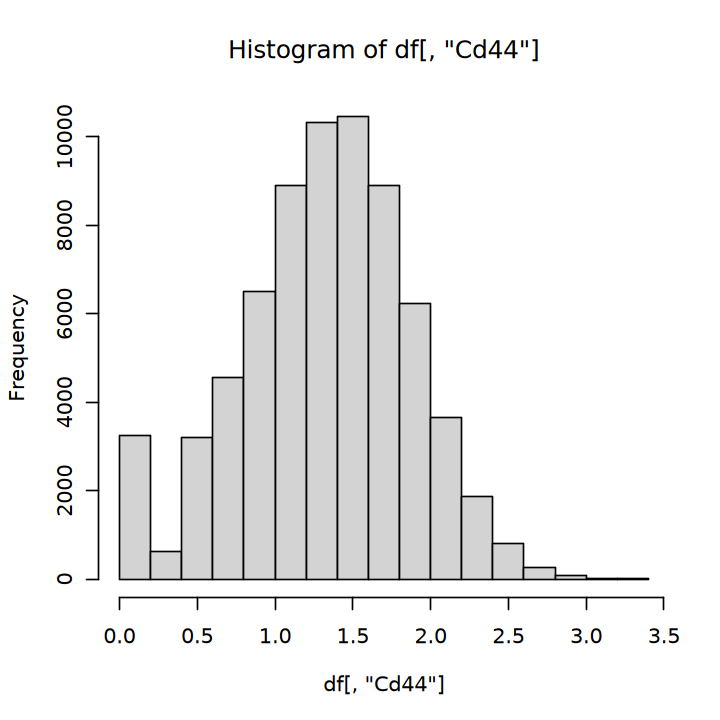

In [584]:
options(repr.plot.width = 6, repr.plot.height = 6)
hist(df[,'Cd44'])

In [585]:
df$Cd44_level <- 'High'
df[df$Cd44 > 1 & df$Cd44 < 2,'Cd44_level'] <- 'Mid'
df[df$Cd44 < 1,'Cd44_level'] <- 'Low'
df$Cd44_level <- factor(df$Cd44_level,level=c('Low','Mid','High'))

In [586]:
df

,Cd44,Fosb,Jun,lineageGrp,Cd44_level
,<dbl>,<dbl>,<dbl>,<fct>,<fct>
T1_T1_a3026_AAACCCACATGAGATA-1,1.7155292,0.0000000,0.5652775,C130,Mid
T1_T1_a3026_AAACCCATCGCTTACC-1,2.0390457,0.0000000,0.0000000,C30,High
T1_T1_a3026_AAACGAACAGCCGTTG-1,1.9985030,0.5357135,2.1742217,C18,Mid
T1_T1_a3026_AAACGAAGTCATATGC-1,1.7494994,0.0000000,0.5833065,C54,Mid
T1_T1_a3026_AAACGAAGTGGGATTG-1,1.2314813,0.0000000,1.0366397,C117,Mid
T1_T1_a3026_AAACGAAGTTTGATCG-1,0.5623725,0.0000000,0.5623725,C56,Low
T1_T1_a3026_AAACGCTAGAGGGTAA-1,2.0403681,0.0000000,0.9833361,C63,High
T1_T1_a3026_AAACGCTCAATTCTTC-1,1.3870448,0.0000000,0.0000000,C54,Mid
T1_T1_a3026_AAACGCTCATGGCTGC-1,2.1866285,0.5825026,1.8769576,C15,High


png 
  2

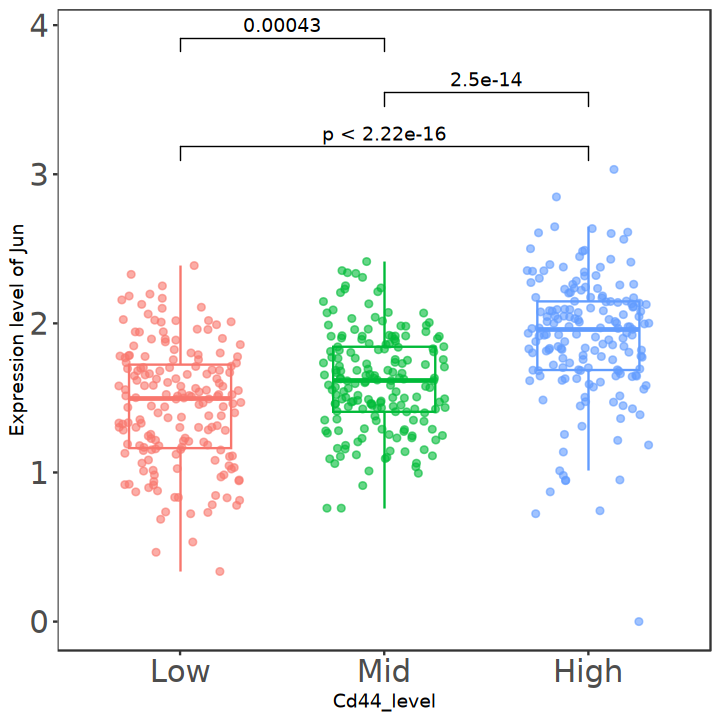

In [618]:
library(dplyr)

df_summary <- df %>%
  group_by(Cd44_level, lineageGrp) %>%
  summarise(median_value = median(Jun), .groups = 'drop') %>% as.data.frame

library(ggpubr)
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure5/Cd44_VS_Jun_cloneLevel.pdf',width=6,height=6)
options(repr.plot.width = 6, repr.plot.height = 6)
plot <- ggplot(df_summary,aes(x=Cd44_level,y=median_value,color=Cd44_level))+geom_point(position = position_jitter(width = 0.3),alpha=0.6) +  
  geom_boxplot(width = 0.5, fill = NA, outlier.shape = NA) + 
  scale_fill_brewer(palette = "Set2") +  
  ylab('Expression level of Jun')+
  theme_bw()+
  theme(panel.grid = element_blank(),
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18)
  )+
  stat_compare_means(comparisons = list(c("High", "Low"), c("High", "Mid"), c("Mid", "Low")),
                     method = "wilcox.test",label = "p.format") 
print(plot)
dev.off()
print(plot)


png 
  2

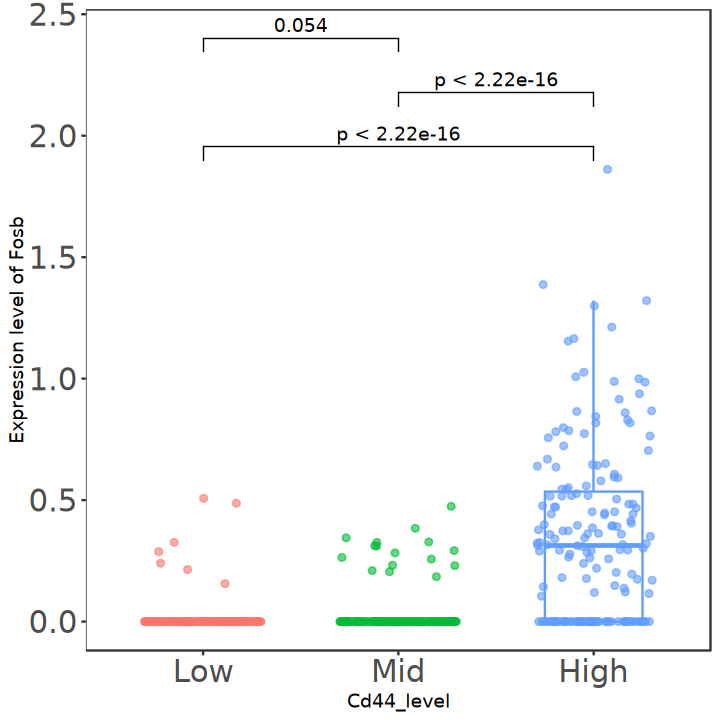

In [621]:
library(dplyr)

df_summary <- df %>%
  group_by(Cd44_level, lineageGrp) %>%
  summarise(median_value = median(Fosb), .groups = 'drop') %>% as.data.frame

library(ggpubr)
pdf('/syn1/liangzhen/jinhua_jilab_project/result/Figures/Figure5/Cd44_VS_Fosb_cloneLevel.pdf',width=6,height=6)
options(repr.plot.width = 6, repr.plot.height = 6)
plot <- ggplot(df_summary,aes(x=Cd44_level,y=median_value,color=Cd44_level))+geom_point(position = position_jitter(width = 0.3),alpha=0.6) +  
  geom_boxplot(width = 0.5, fill = NA, outlier.shape = NA) + 
  scale_fill_brewer(palette = "Set2") +  
  ylab('Expression level of Fosb')+
  theme_bw()+
  theme(panel.grid = element_blank(),
    legend.position = "none",
    plot.title = element_text(hjust = 0.5, face = "bold"),
    axis.text = element_text(face = "bold",size = 18)
  )+
  stat_compare_means(comparisons = list(c("High", "Low"), c("High", "Mid"), c("Mid", "Low")),
                     method = "wilcox.test",label = "p.format") 
print(plot)
dev.off()
print(plot)
